In [11]:
# data analysis for self-piloting the PLEARN eyetracking experiment

In [12]:
library('readr')
library('blabr')
library('plyr')
library('dplyr')
library('ggplot2')
library('rjson')
library('parallel')
library("readxl")
source('PLEARN_analysis_helper.R')

In [13]:
audio_timings = getAudioTimings("~/notebooks/morphoacq/PLEARN_experiments/stimuli/raw_audio2/*.cut")
head(audio_timings)

start_time,stop_time,target_noun_start_time,begin_disambig_region,target_noun_end_time,filename,disambig_time,audiotarget
3.199,5.300,4.085,4.366,4.366,17.wav,3167,17.wav
8.912,10.731,9.538,9.827,9.827,18.wav,2915,18.wav
14.222,15.929,14.736,15.130,15.130,19.wav,2908,19.wav
19.494,21.586,20.454,20.729,20.729,20.wav,3235,20.wav
32.459,34.185,33.174,33.438,33.438,21.wav,2979,21.wav
37.722,39.242,38.219,38.500,38.500,22.wav,2778,22.wav


In [14]:
# merge against item properties
item_properties = read.csv('../PLEARN_experiments/csv/plearn_receptiveTask_datasource.csv')
item_properties[1,]
audio_timings_with_metadata = merge(item_properties, audio_timings, by.x='AudioTarget', 
                                    by.y='audiotarget')
audio_timings_with_metadata$plural_duration = (audio_timings_with_metadata$target_noun_end_time -
    audio_timings_with_metadata$begin_disambig_region) * 1000 
nrow(audio_timings_with_metadata) # should be 64, right?

s_form,novel_id,background_context,vowel_carrier,full_carrier,s_carrier,s_punct,s_wav_index,s_sentence,pl_form,⋯,TargetSide,trial_index,NovelColor,order,expt_index,TargetLoc,DistractorLoc,AudioTarget,TargetImage,DistractorImage
book,!,house,in the house,Can you find the in the house,Can you find the,?,65,65. book... Can you find the book in the house?,books,⋯,NA,NA,NA,1,1,"(640,512)","(0,0)",65.wav,1_book_singular_left.png,1_book_plural_left.png


[1] 63

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


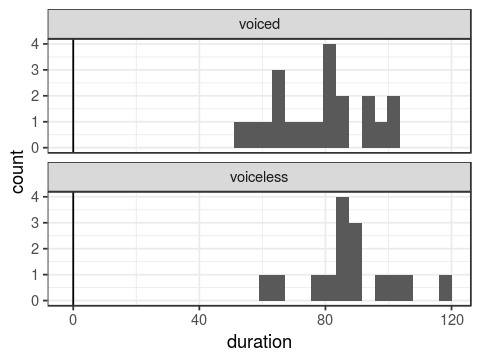

In [15]:
options(repr.plot.width=4, repr.plot.height=3)
ggplot(subset(audio_timings_with_metadata, plural_duration != 0)) + geom_histogram(aes(x=plural_duration)
) + facet_wrap(~voicing, ncol=1) + theme_bw() + geom_vline(xintercept=0) +xlab('duration')

# Eyetracking: Individual Participants

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 13104, not 13103”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

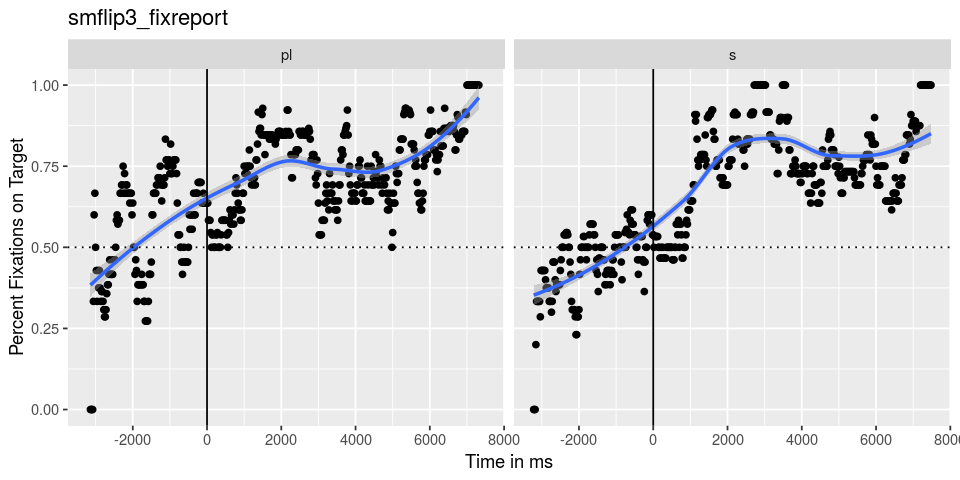

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


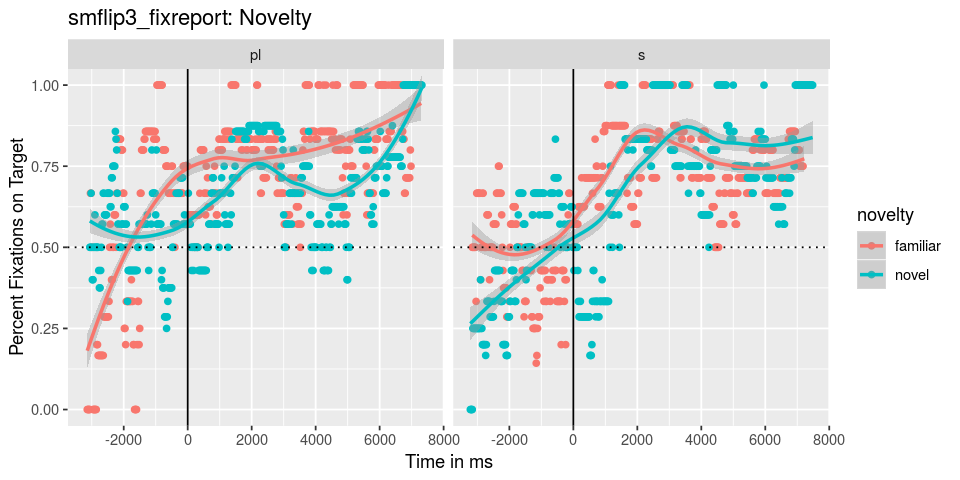

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


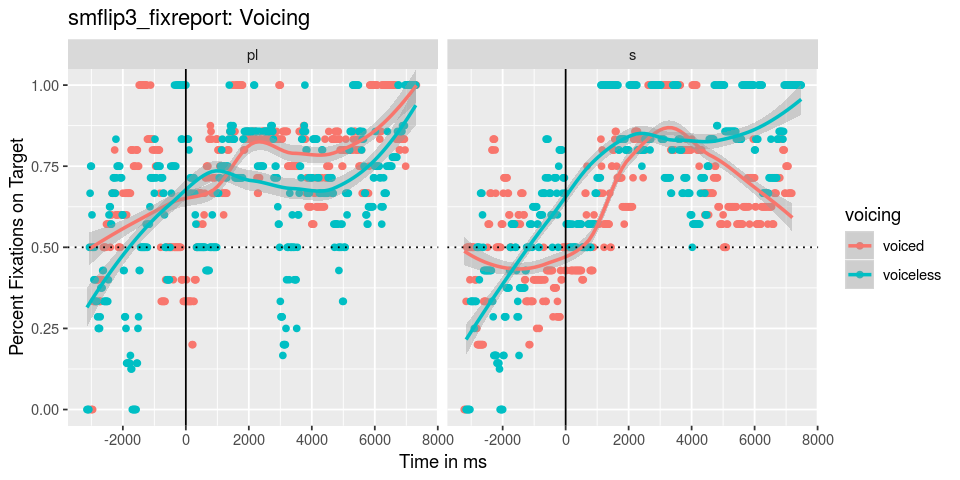

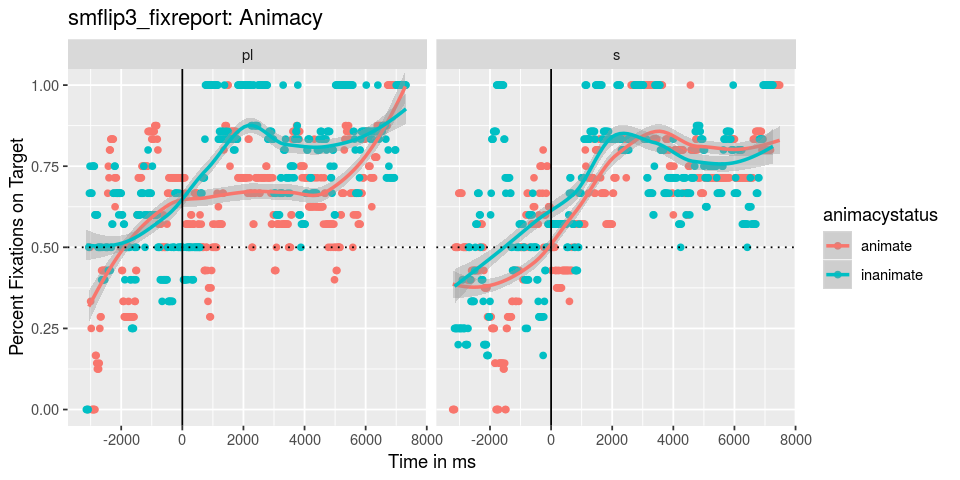

In [16]:
sm_fixbins= analyzeParticipant('results/smflip3_fixreport.txt', audio_timings, 'adult')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 15018, not 15017”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

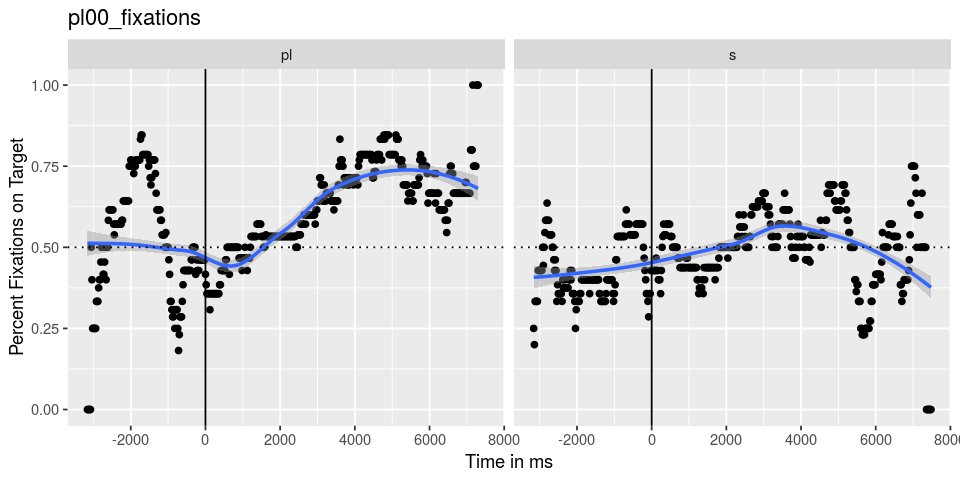

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


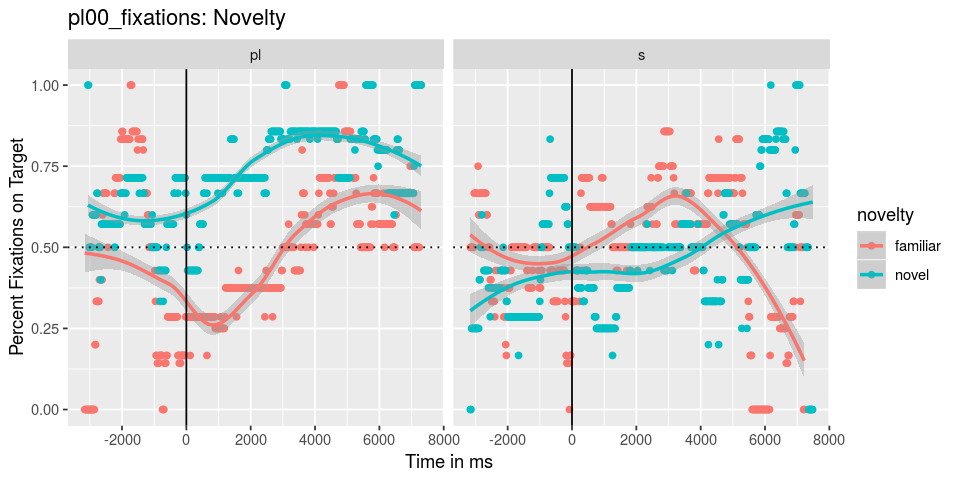

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


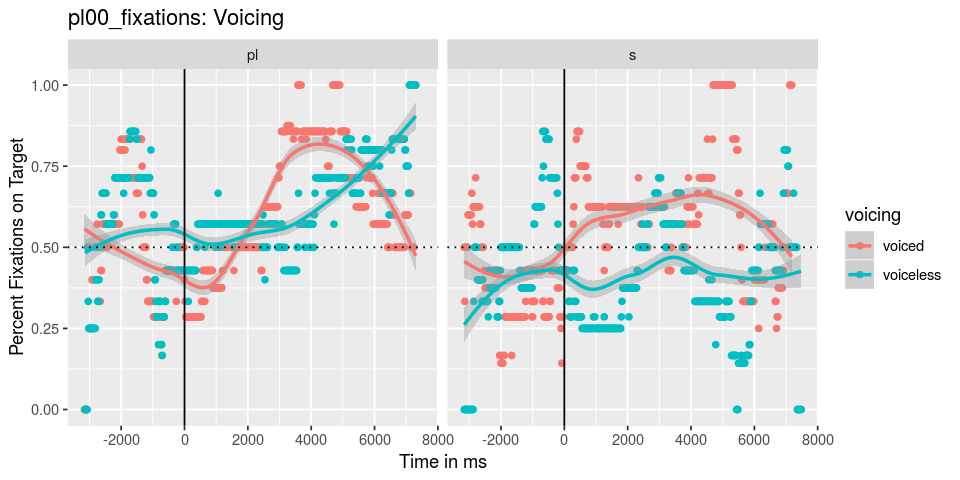

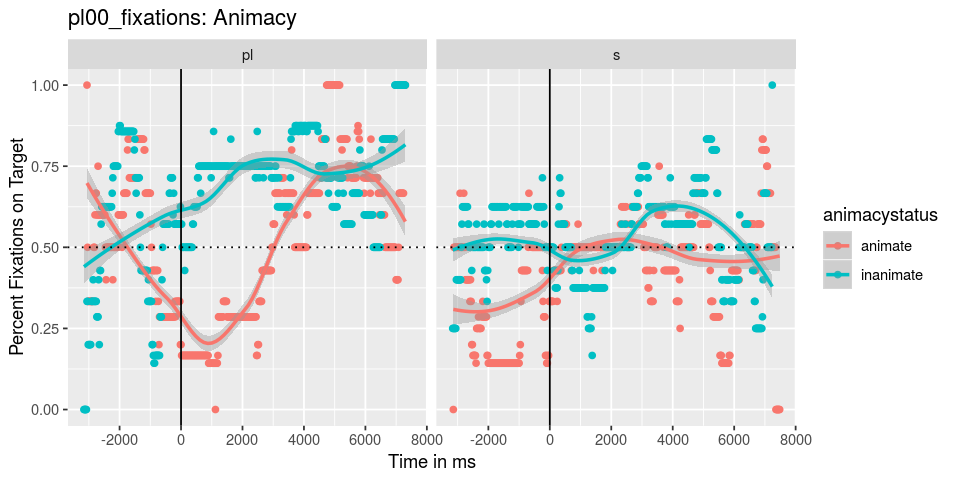

In [17]:
pl00_fixbins = analyzeParticipant('results/pl00_fixations.txt', audio_timings, 'child')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 14335, not 14334”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

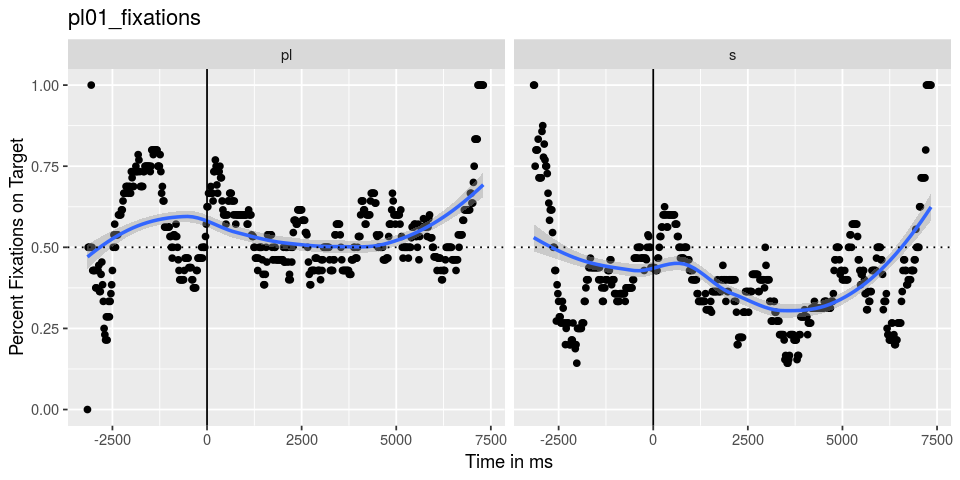

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


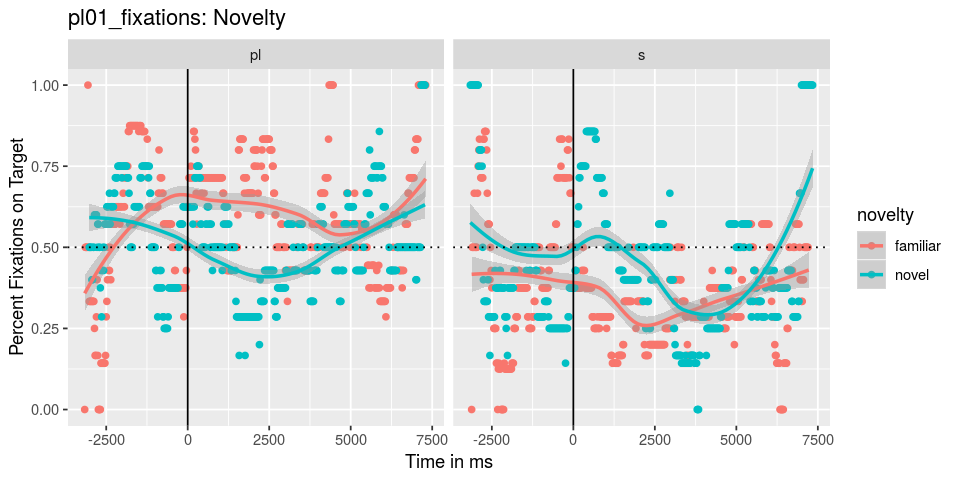

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


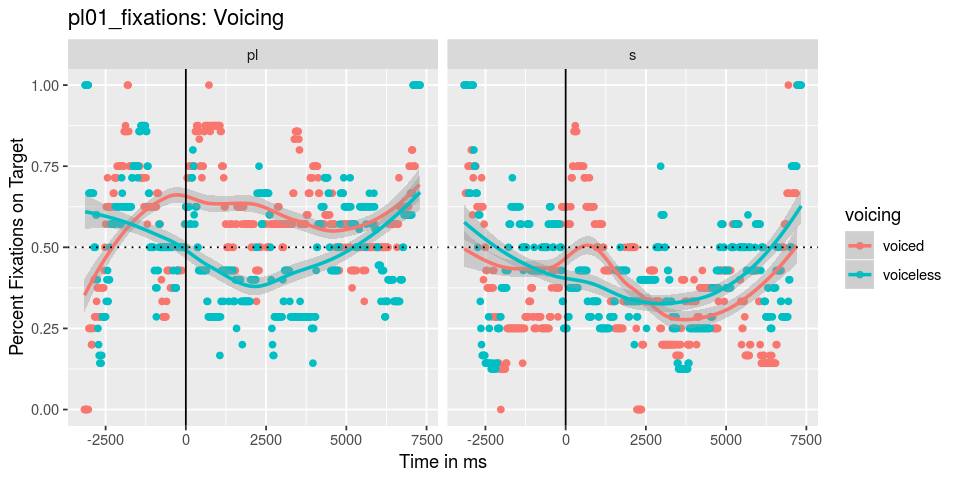

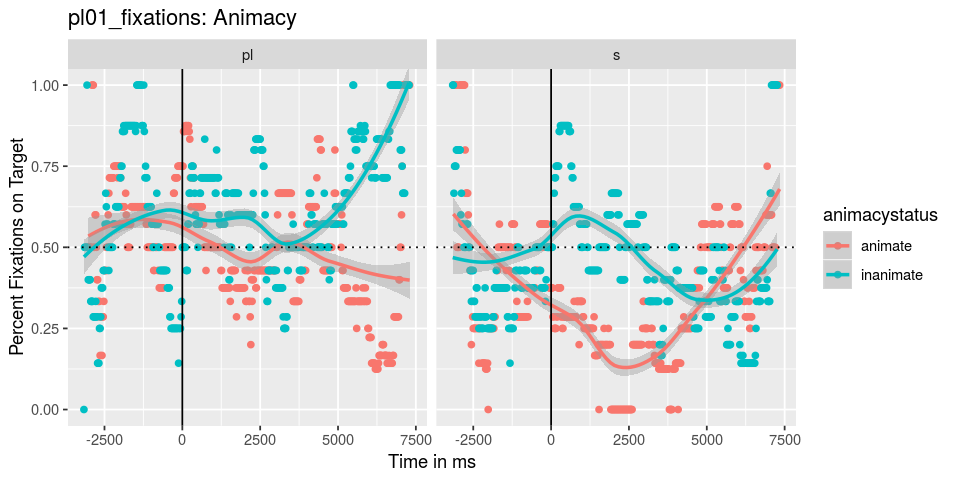

In [18]:
pl01_fixbins = analyzeParticipant('results/pl01_fixations.txt', audio_timings, 'child')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double()
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 6064, not 6063”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`geom_smooth()` using method = 'loess' and formula 'y 

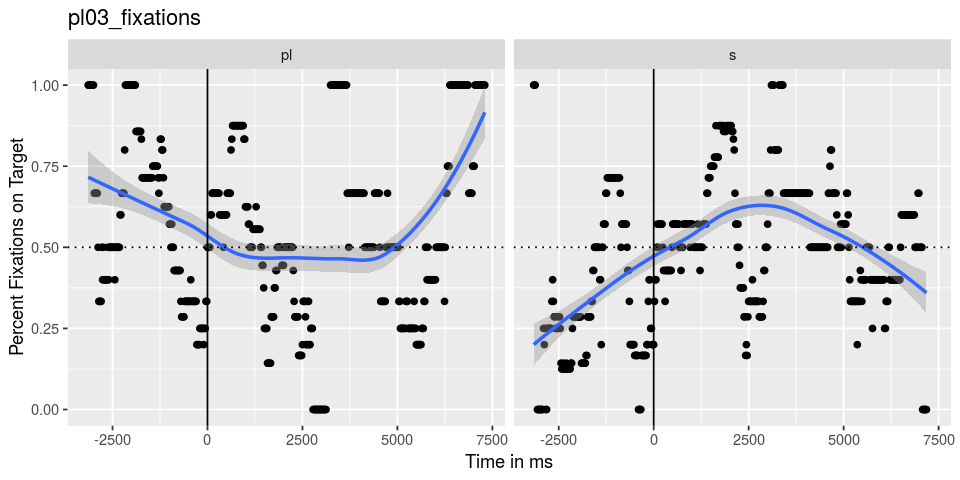

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


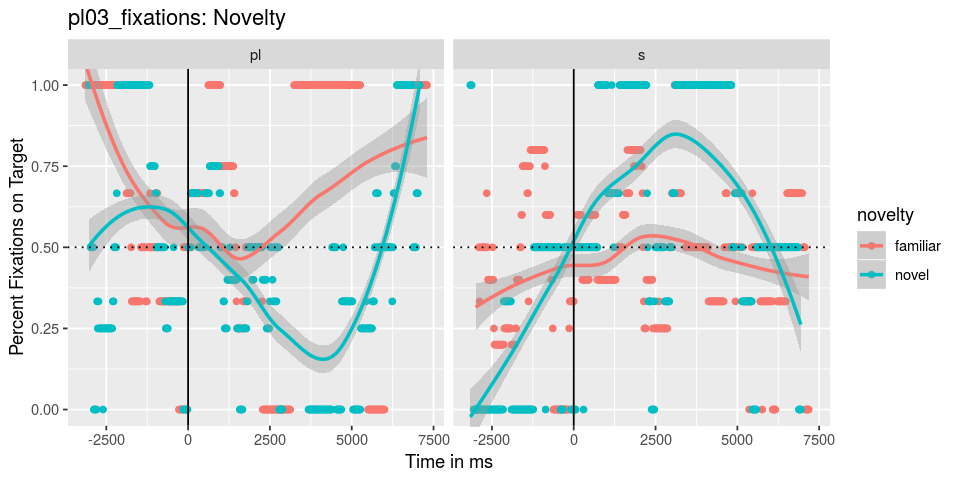

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


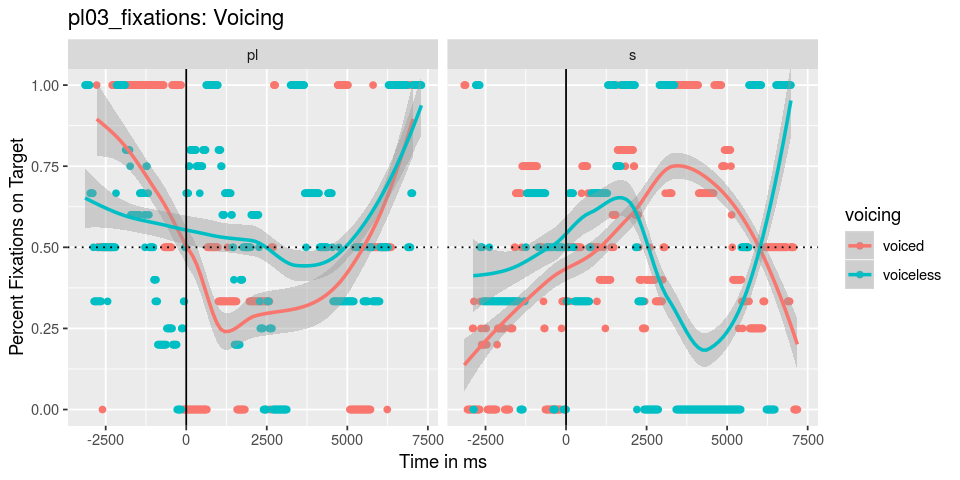

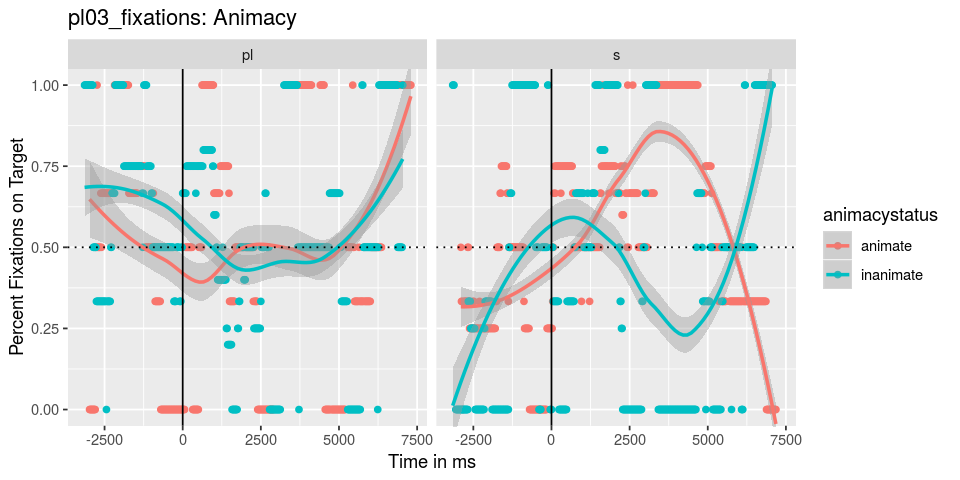

In [19]:
source('PLEARN_analysis_helper.R')
pl03_fixbins = analyzeParticipant('results/pl03_fixations.txt', audio_timings, 'child')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 13842, not 13841”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

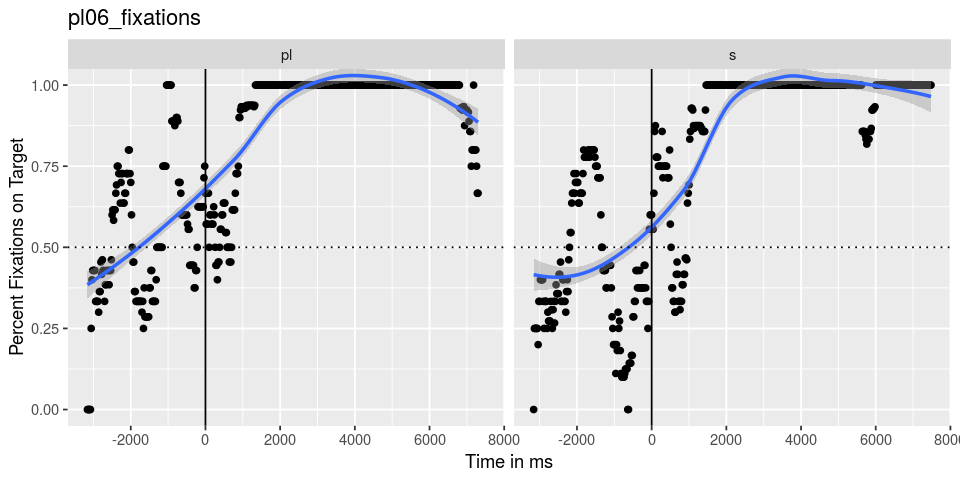

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


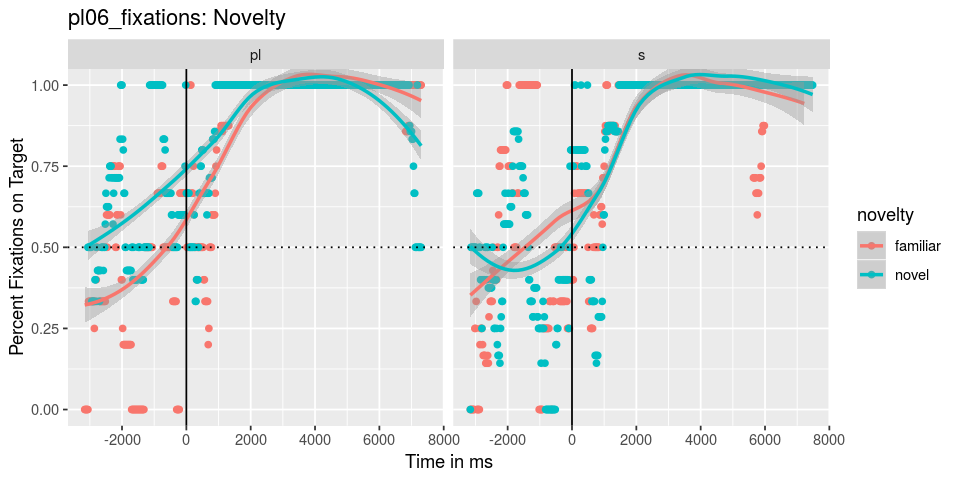

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


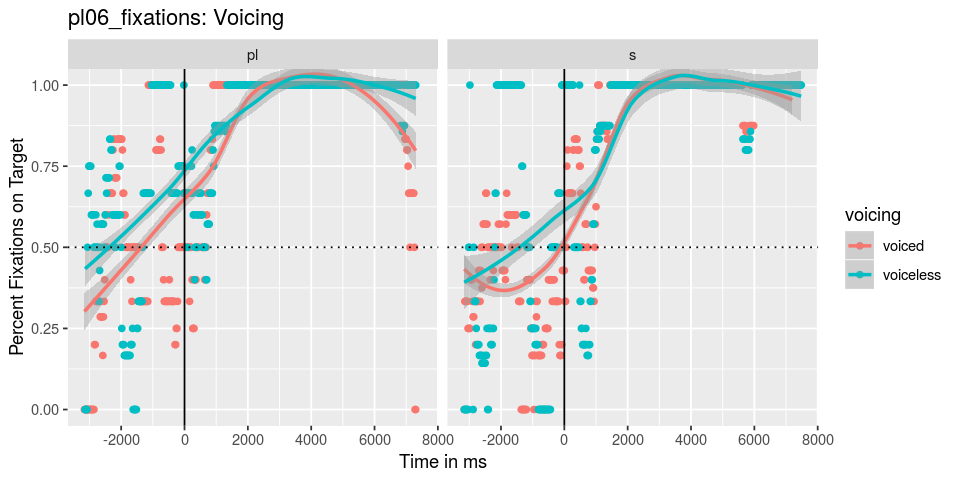

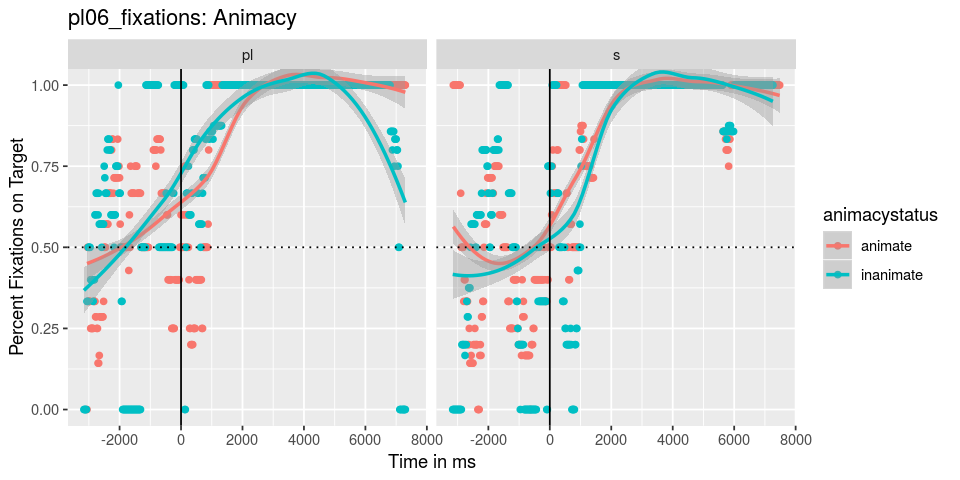

In [20]:
source('PLEARN_analysis_helper.R')
pl06_fixbins = analyzeParticipant('results/pl06_fixations.txt', audio_timings, 'adult')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 15062, not 15061”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

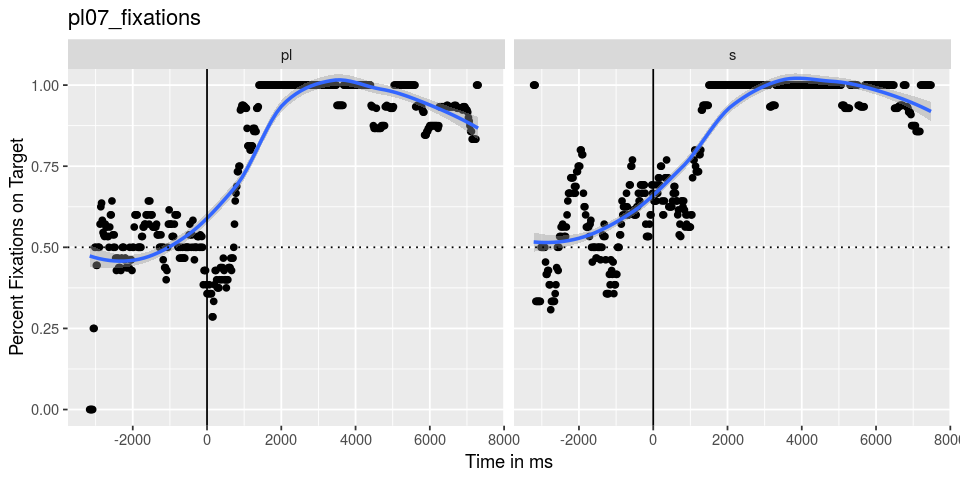

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


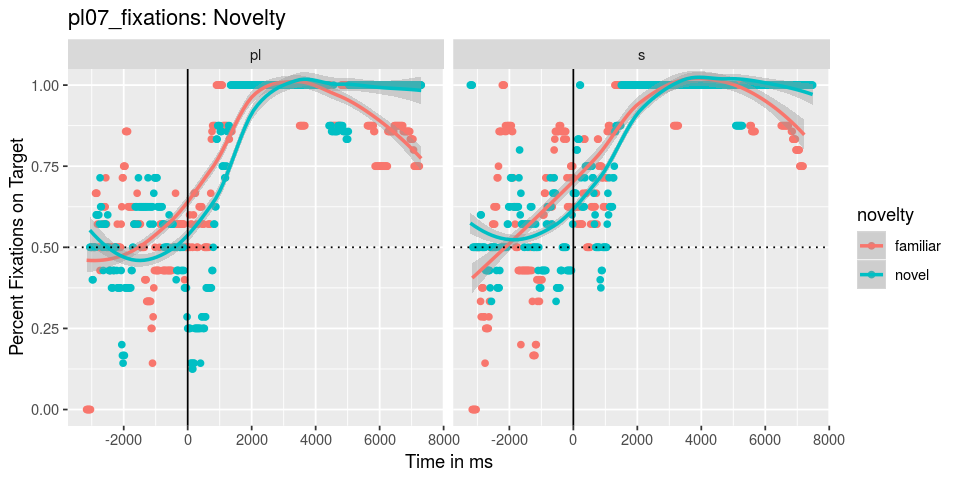

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


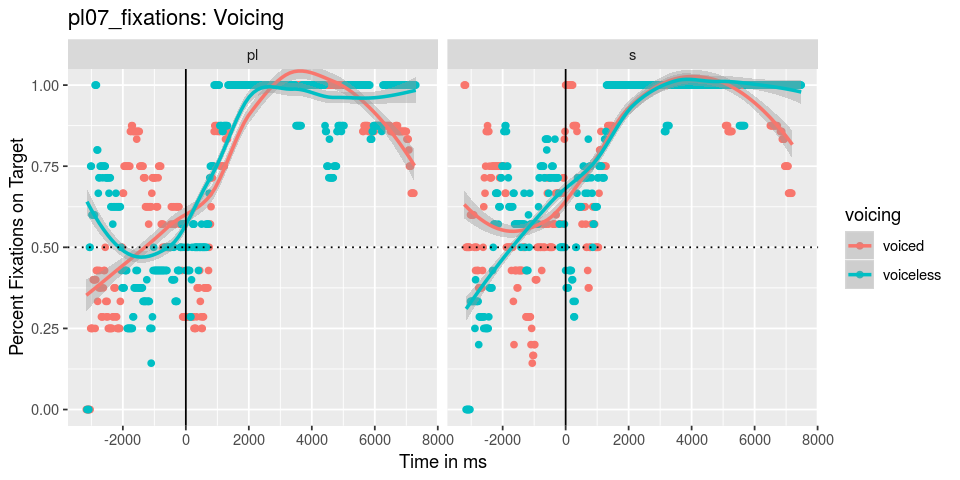

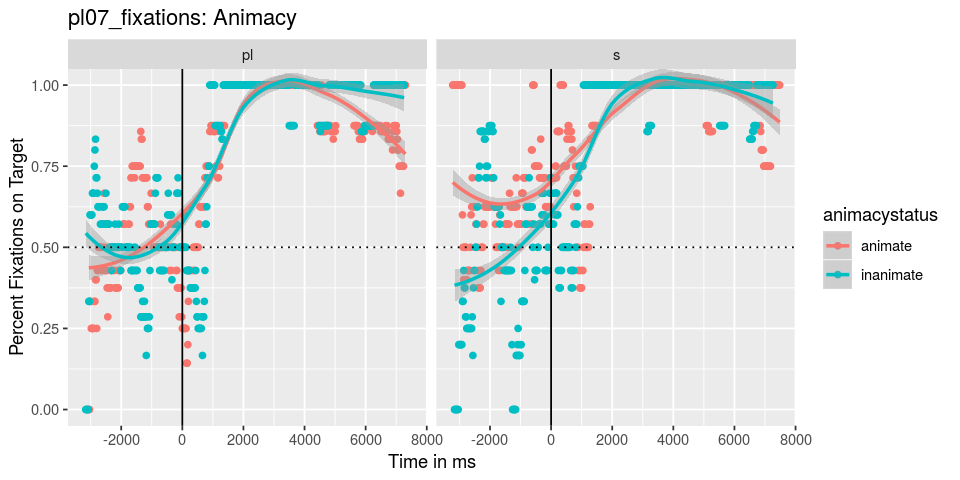

In [21]:
pl07_fixbins = analyzeParticipant('results/pl07_fixations.txt', audio_timings, 'adult')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 15062, not 15061”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

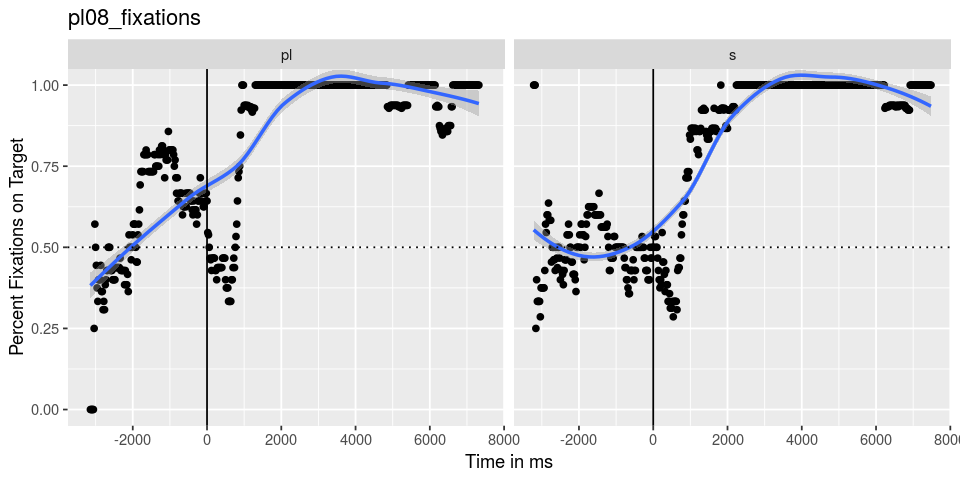

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


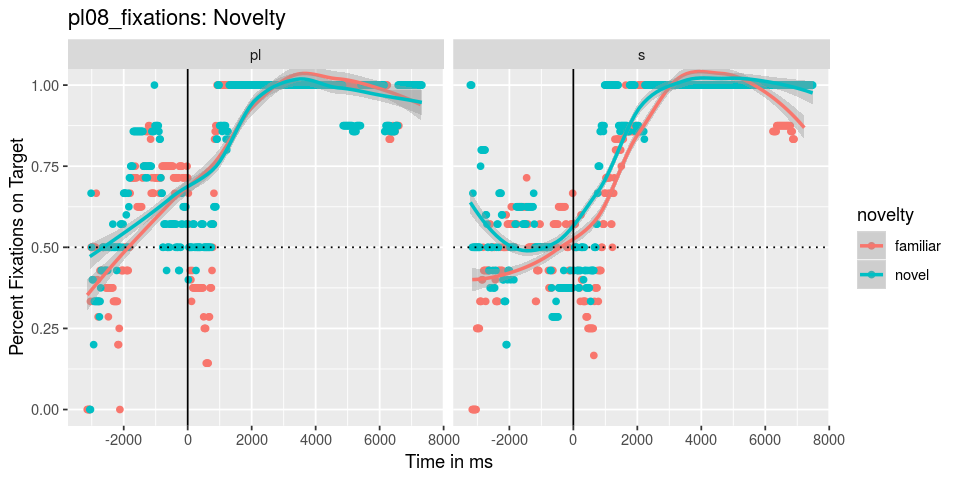

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


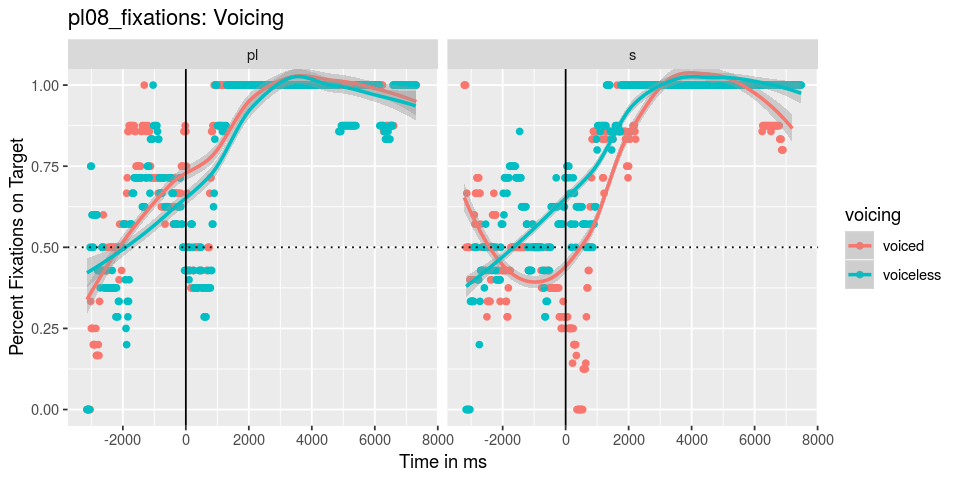

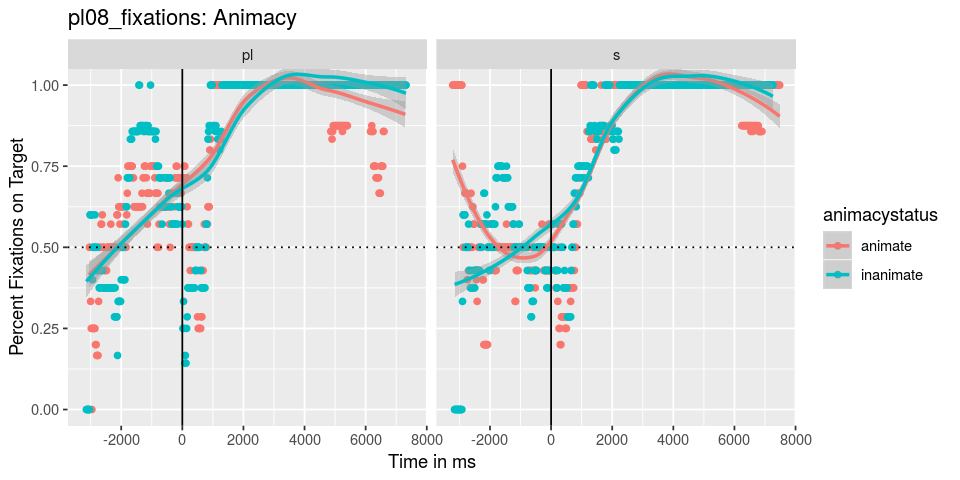

In [22]:
pl08_fixbins = analyzeParticipant('results/pl08_fixations.txt', audio_timings, 'adult')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 15543, not 15542”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

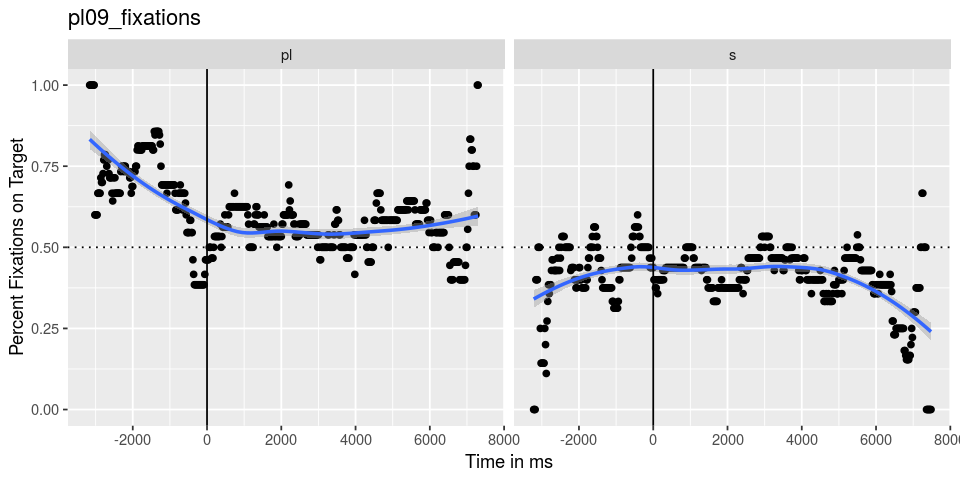

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


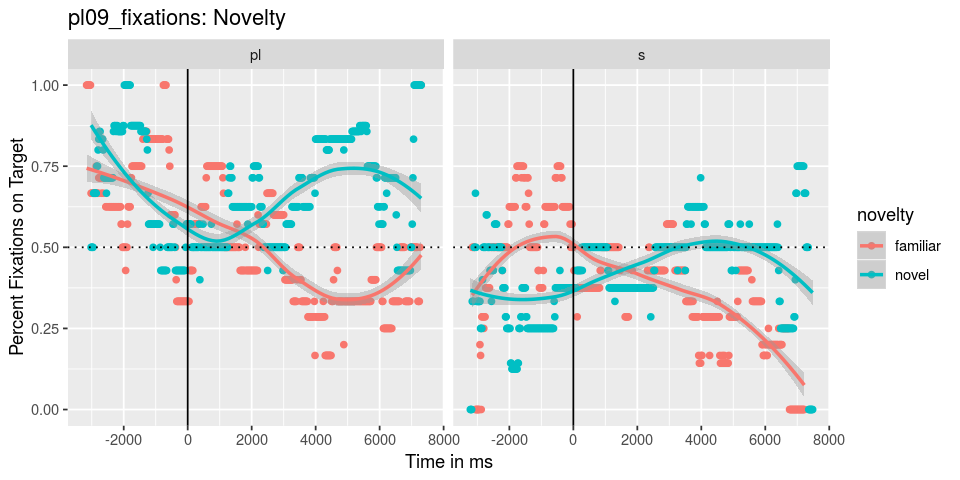

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


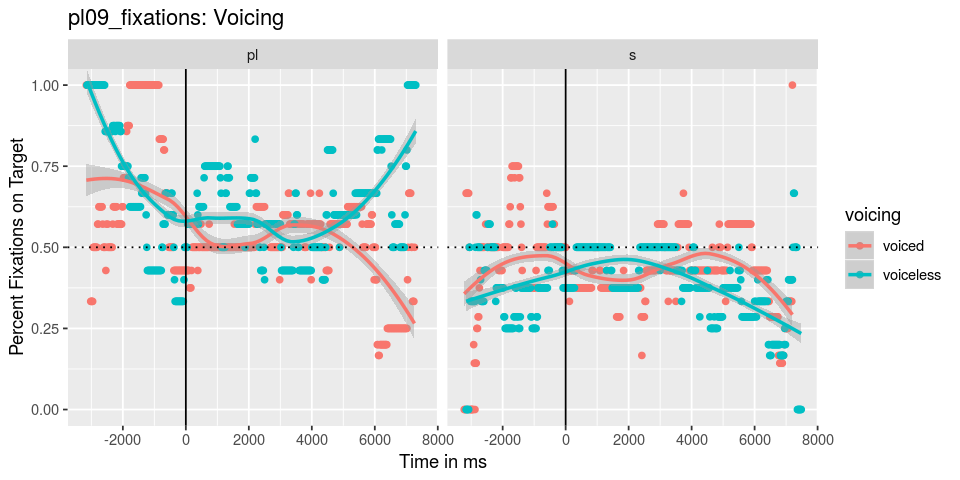

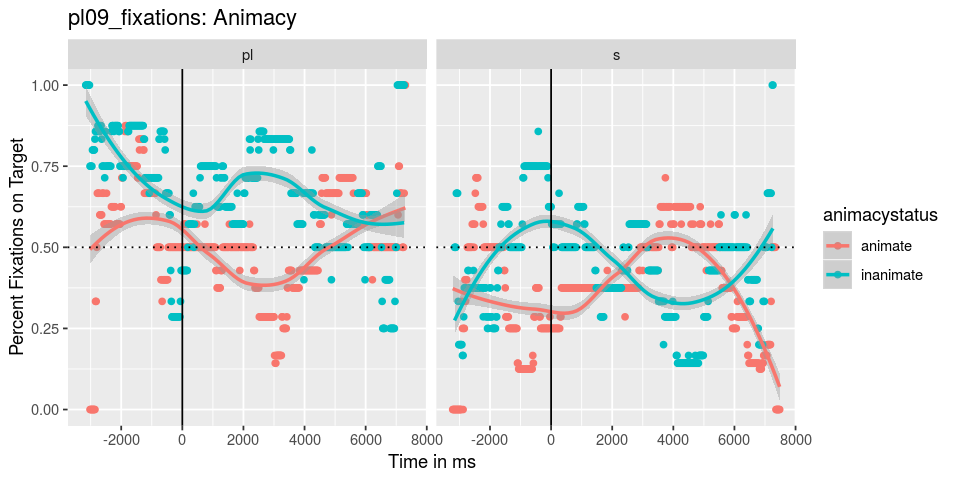

In [23]:
pl09_fixbins = analyzeParticipant('results/pl09_fixations.txt', audio_timings, 'child')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 7542, not 7541”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`geom

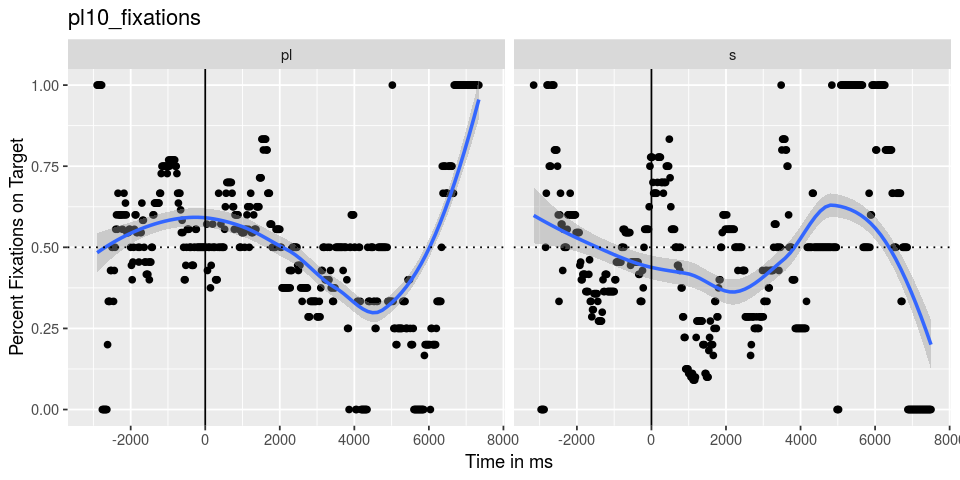

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


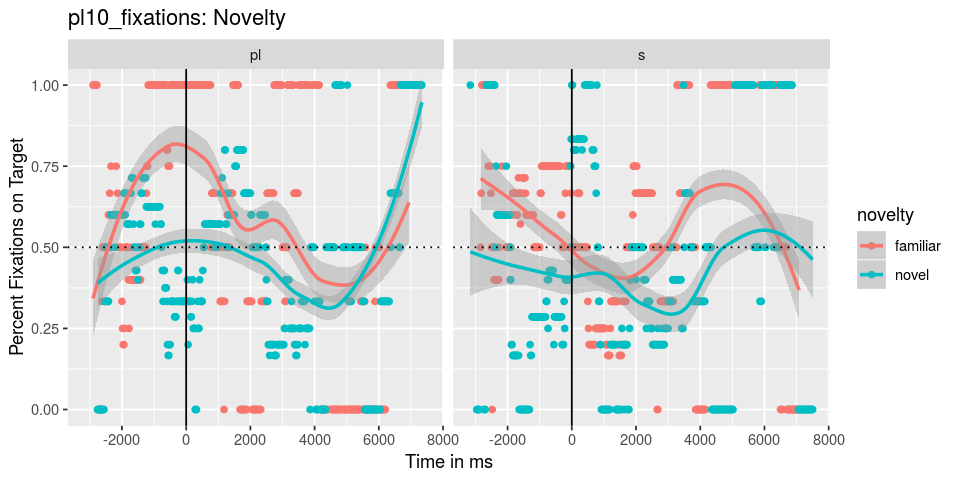

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


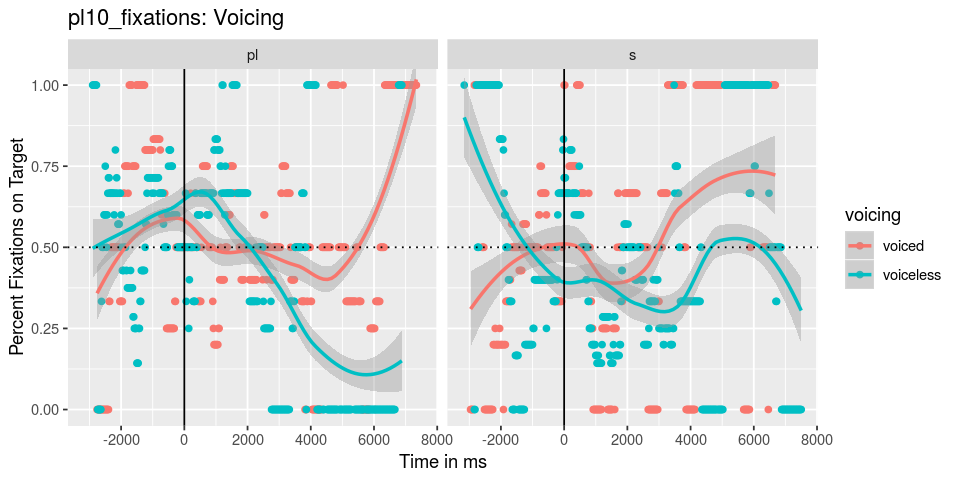

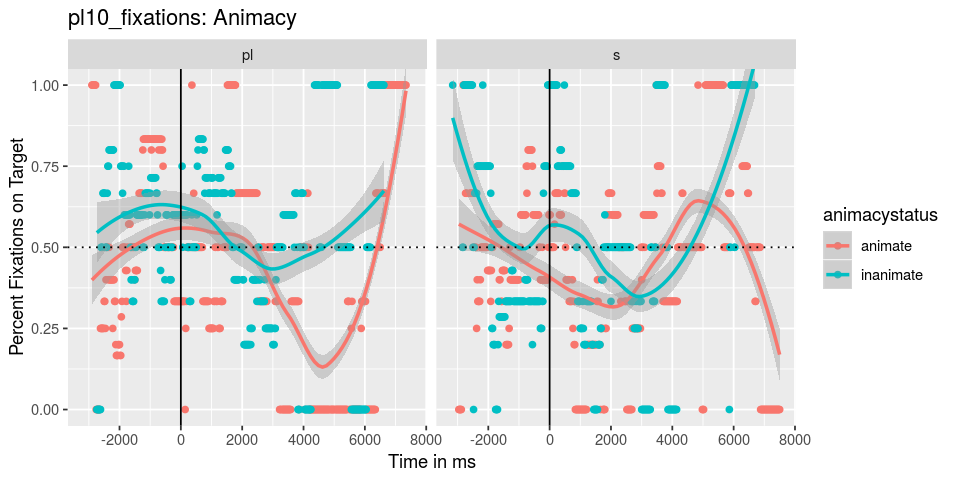

In [24]:
pl10_fixbins = analyzeParticipant('results/pl10_fixations.txt', audio_timings, 'child')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 10897, not 10896”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

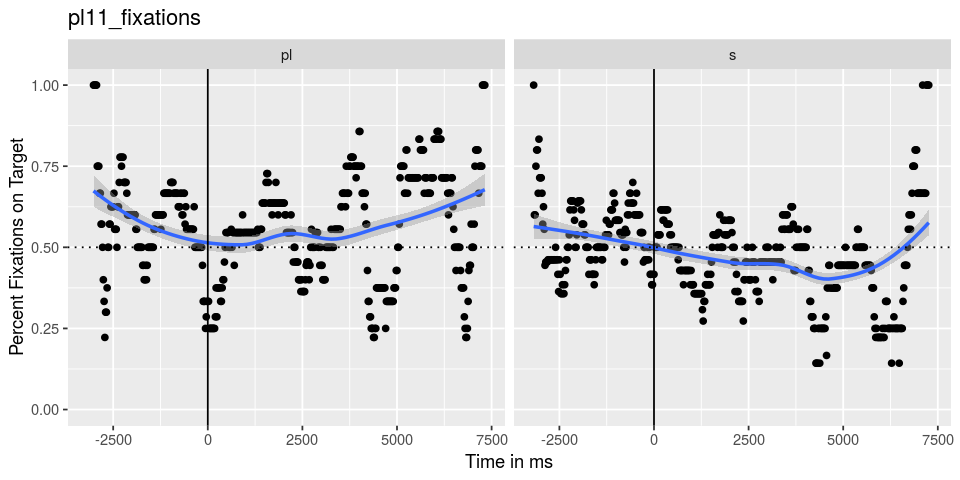

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


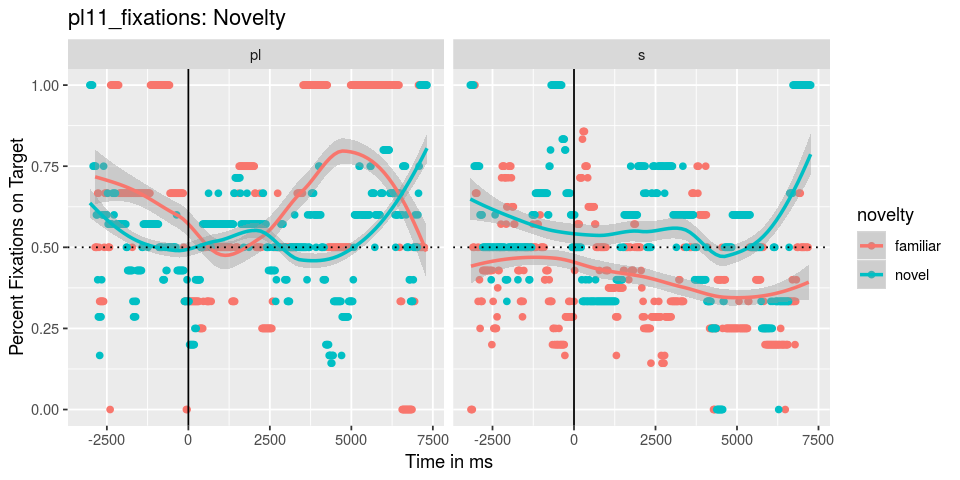

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


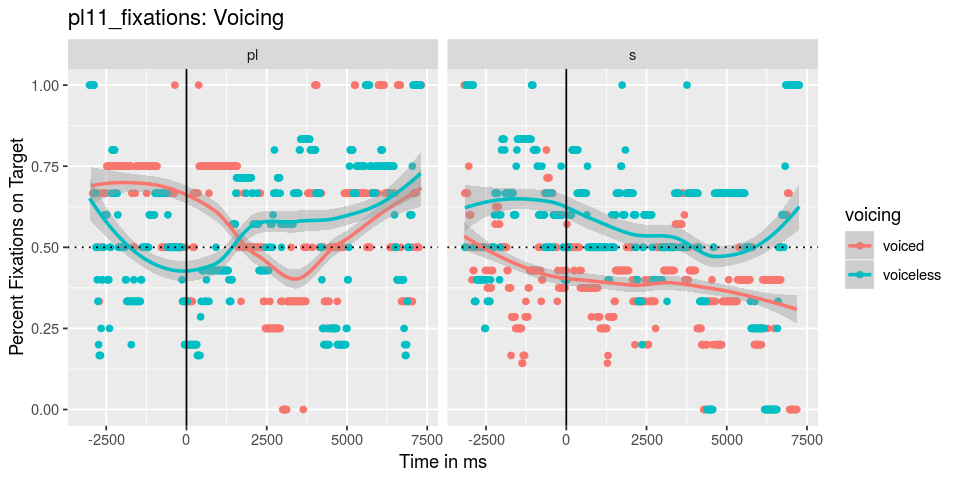

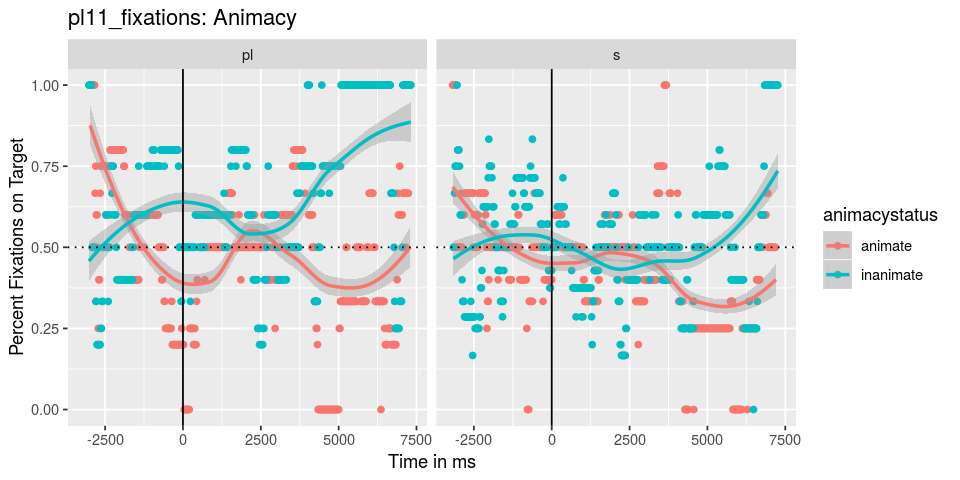

In [25]:
pl11_fixbins = analyzeParticipant('results/pl11_fixations.txt', audio_timings, 'child')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 14246, not 14245”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

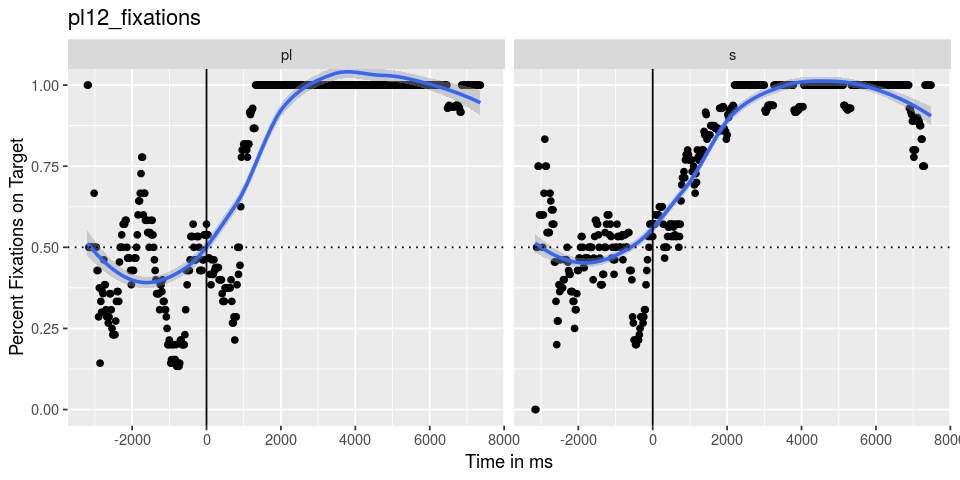

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


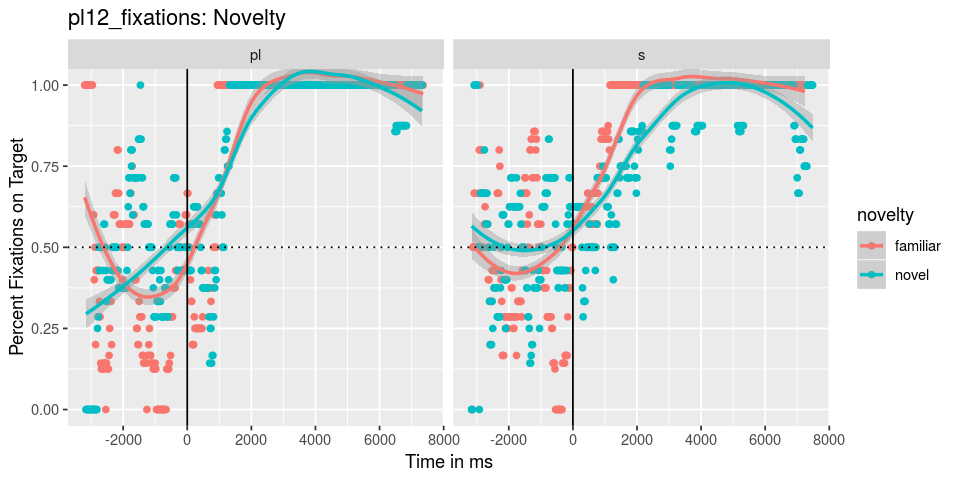

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


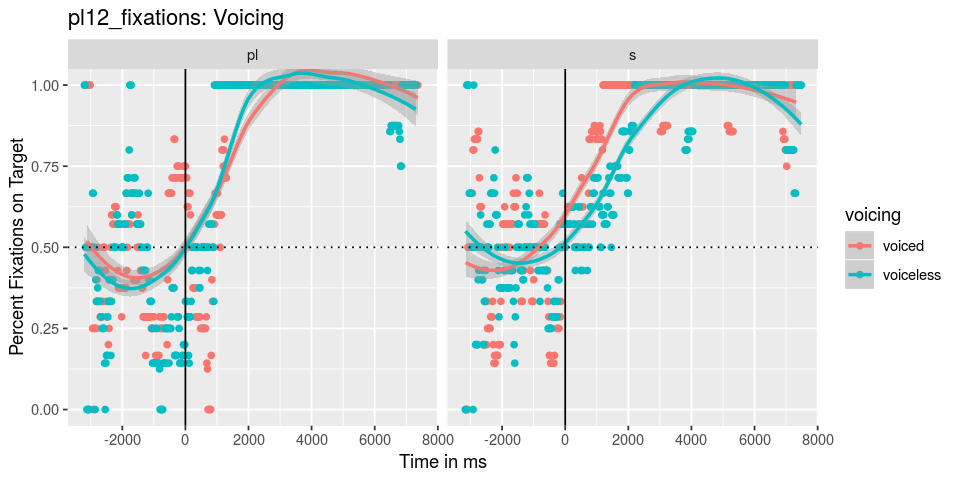

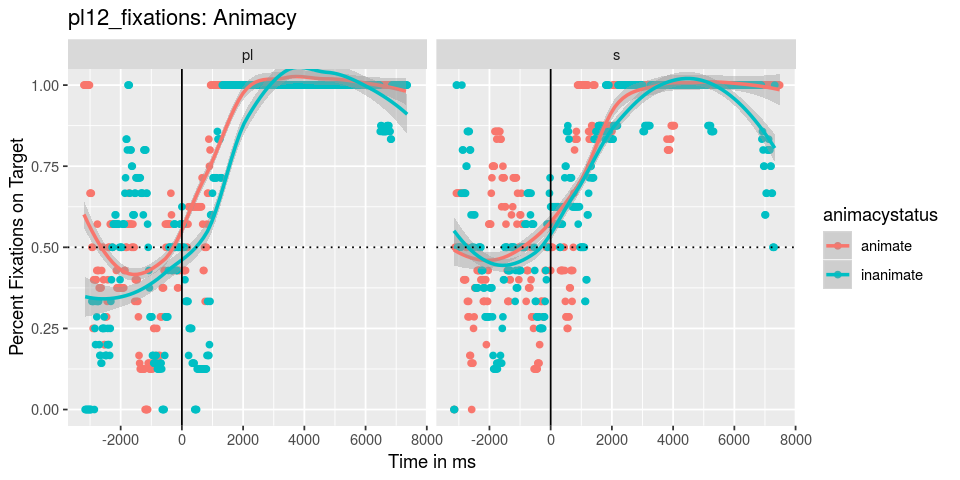

In [26]:
pl12_fixbins = analyzeParticipant('results/pl12_fixations.txt', audio_timings, 'adult')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 15302, not 15301”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

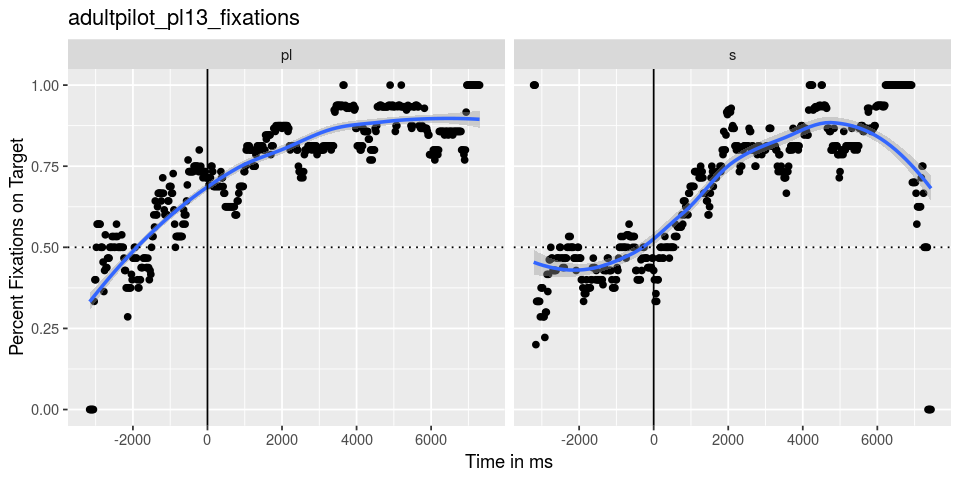

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


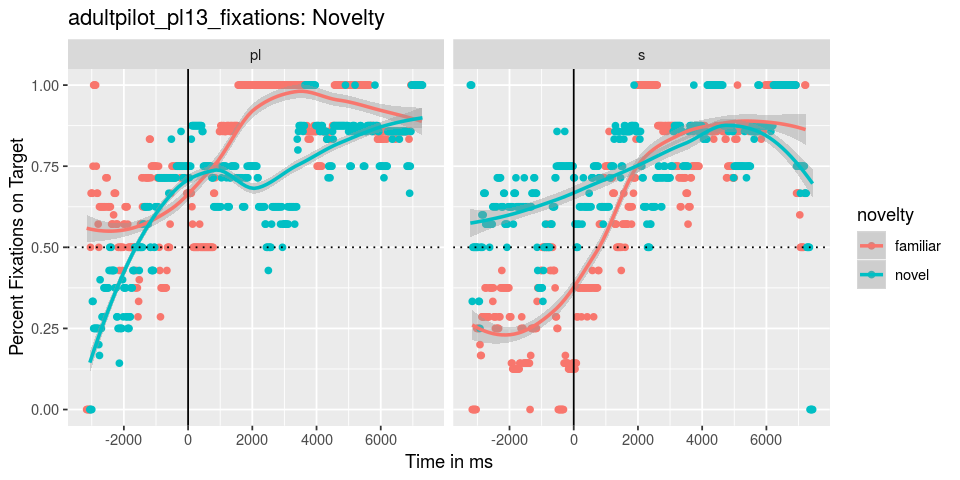

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


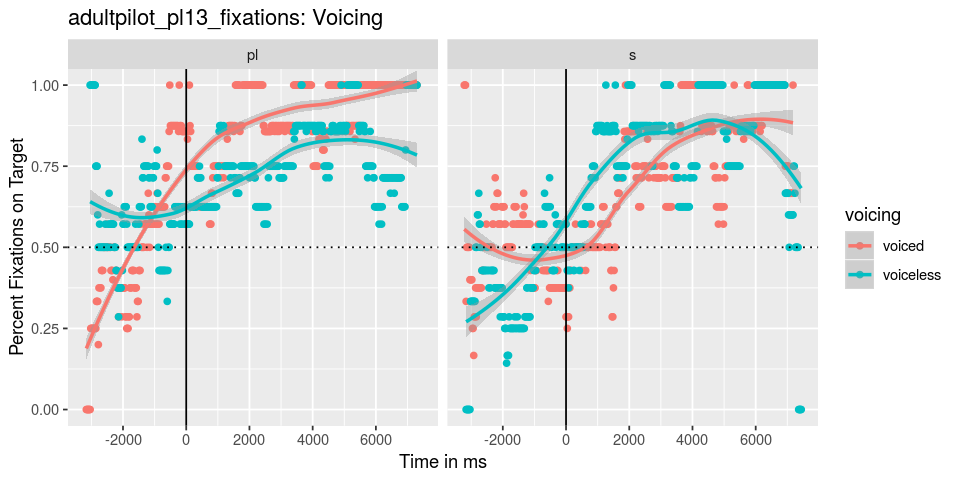

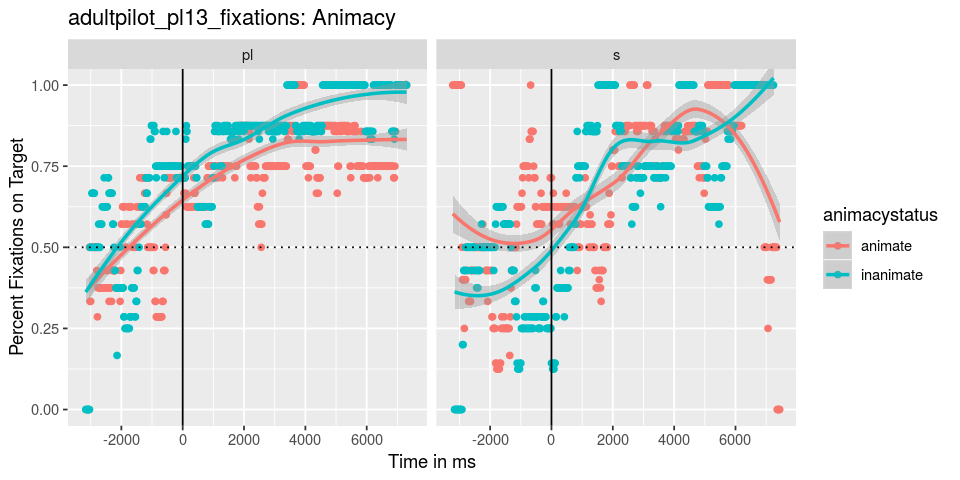

In [27]:
adultpilot_pl13_fixbins = analyzeParticipant('results/adultpilot_pl13_fixations.txt', audio_timings, 'adult')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 14431, not 14430”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

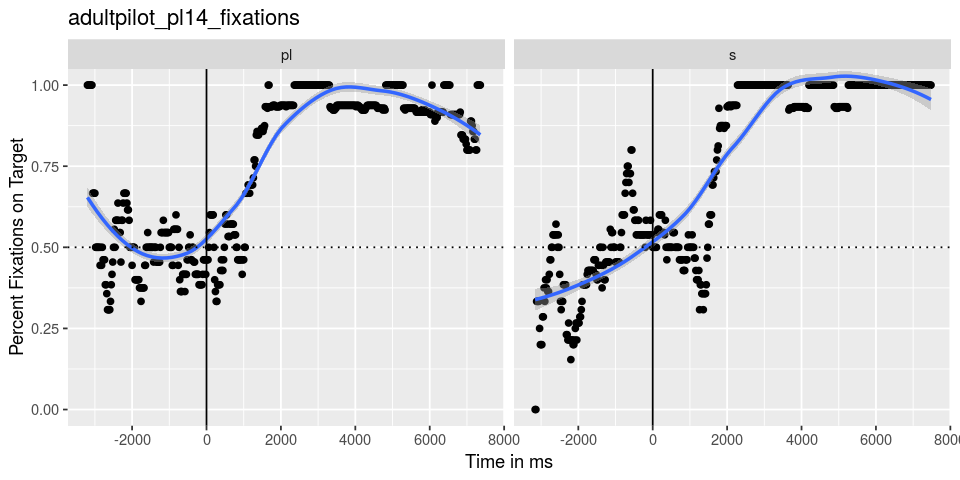

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


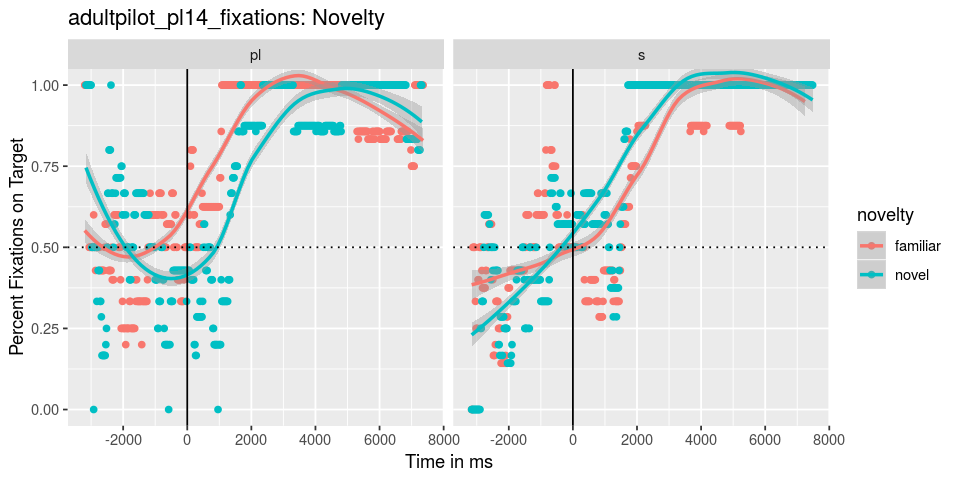

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


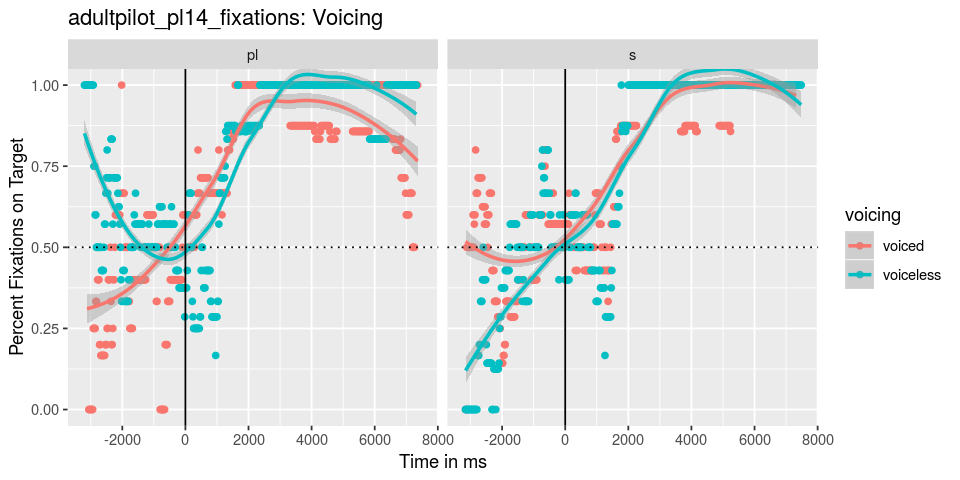

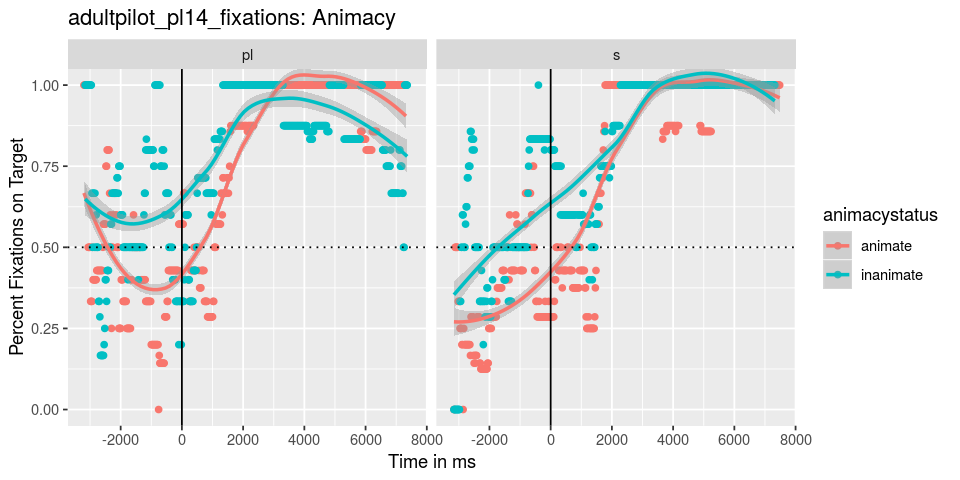

In [28]:
adultpilot_pl14_fixbins = analyzeParticipant('results/adultpilot_pl14_fixations.txt', audio_timings, 'adult')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 15050, not 15049”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

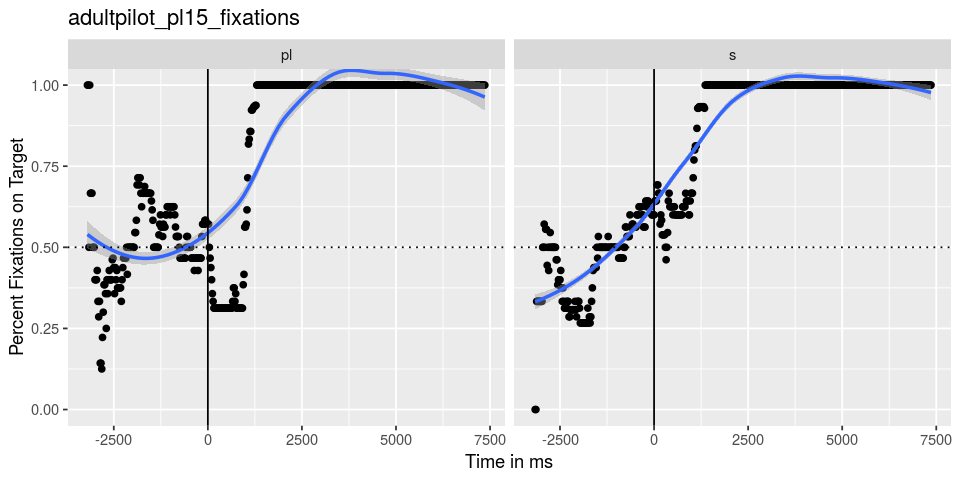

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


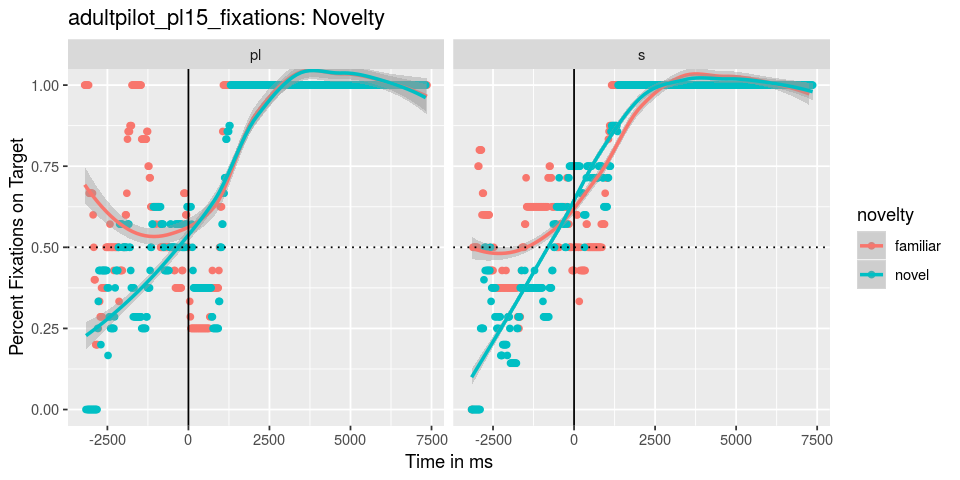

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


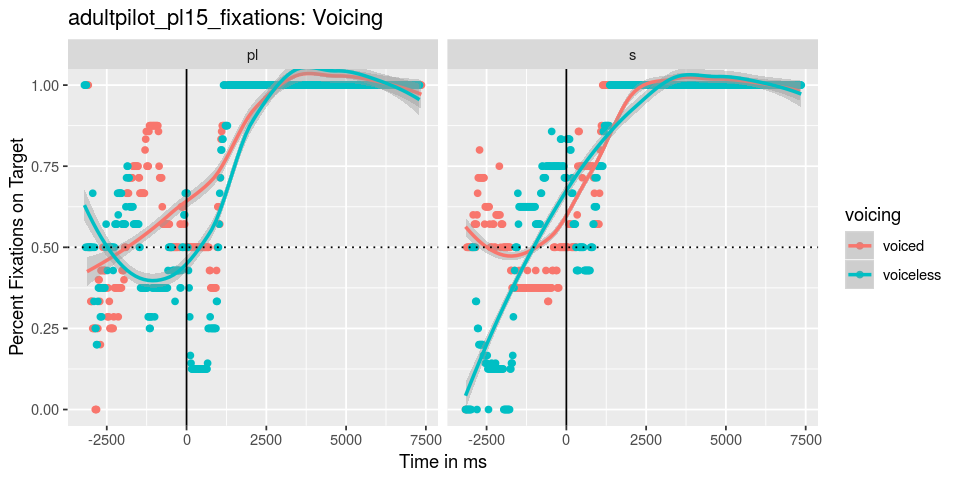

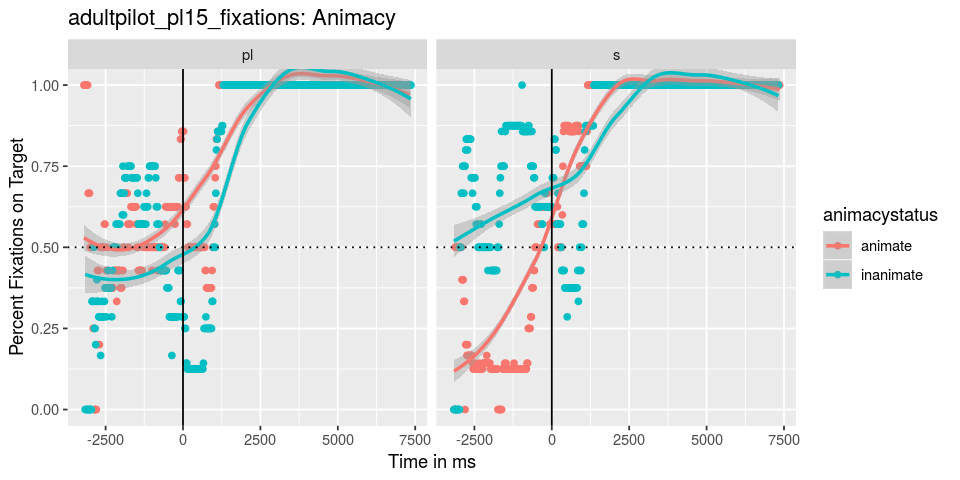

In [29]:
adultpilot_pl15_fixbins = analyzeParticipant('results/adultpilot_pl15_fixations.txt', audio_timings, 'adult')

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 14415, not 14414”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

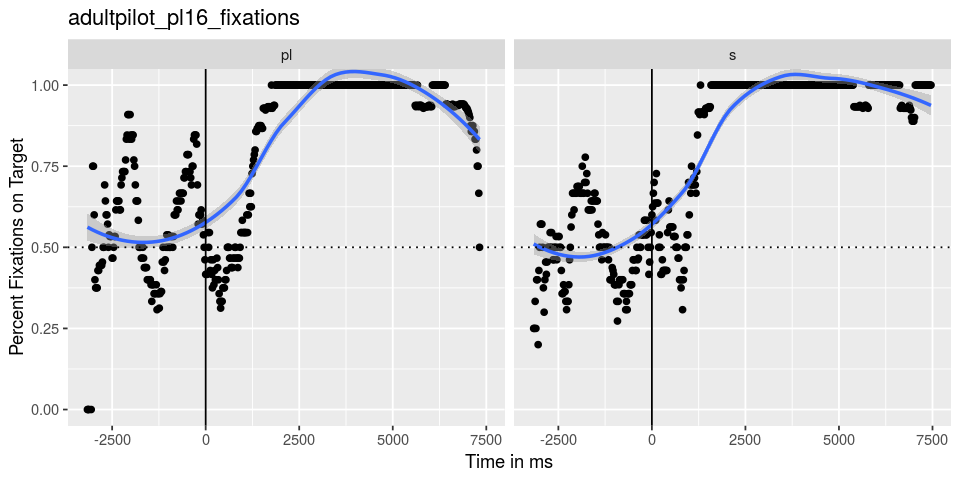

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


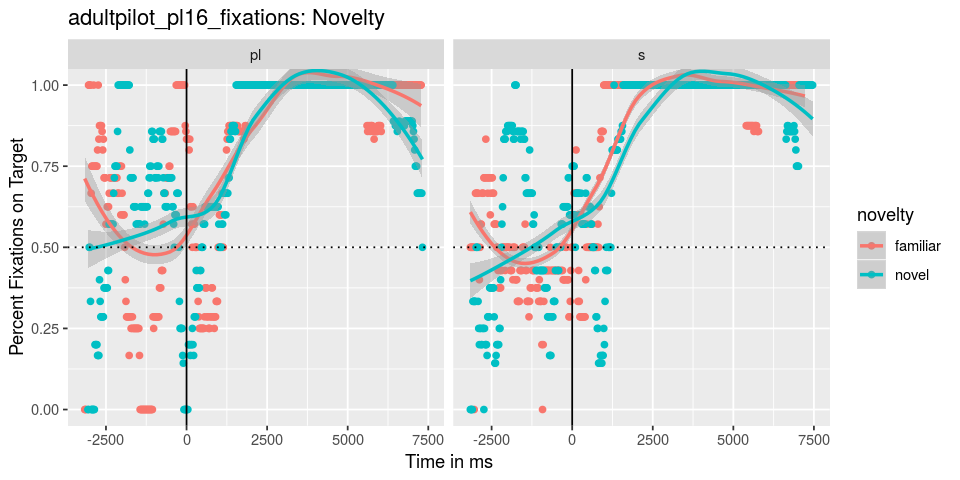

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


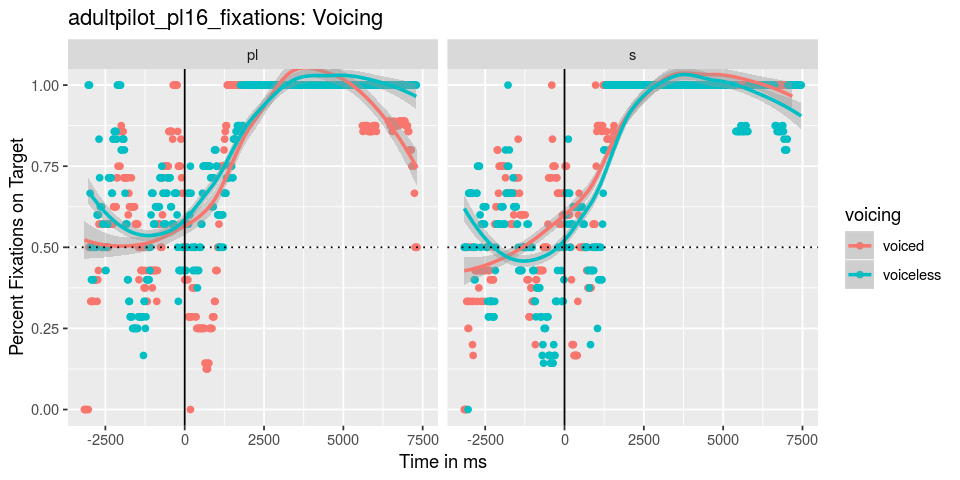

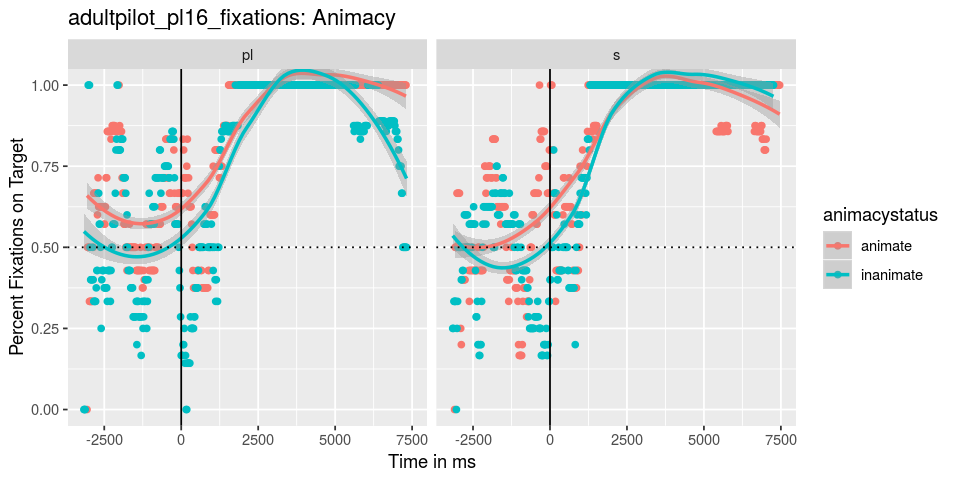

In [30]:
adultpilot_pl16_fixbins = analyzeParticipant('results/adultpilot_pl16_fixations.txt', audio_timings, 'adult')

[1] "Dimensions of excel file read in:"
[1] 608
[1] "will write to:"
[1] "results/pl13_fixations.txt"


Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 10705, not 10704”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

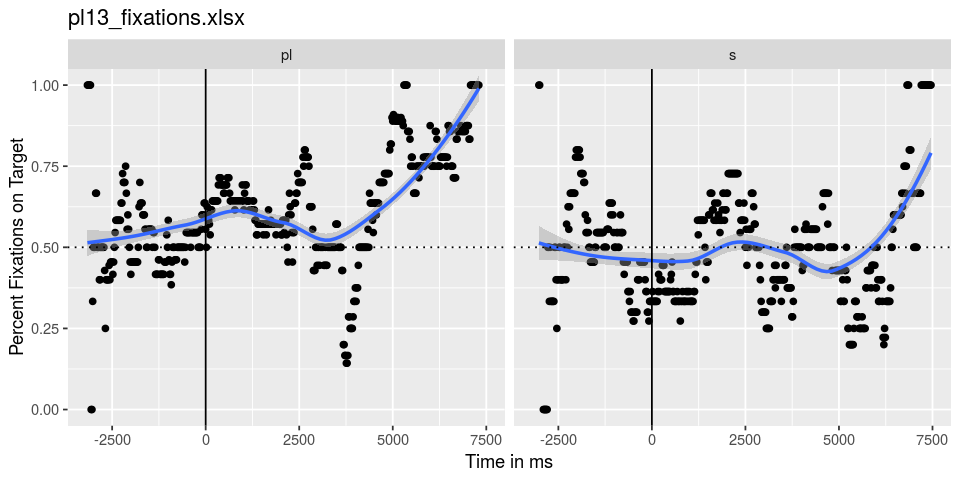

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


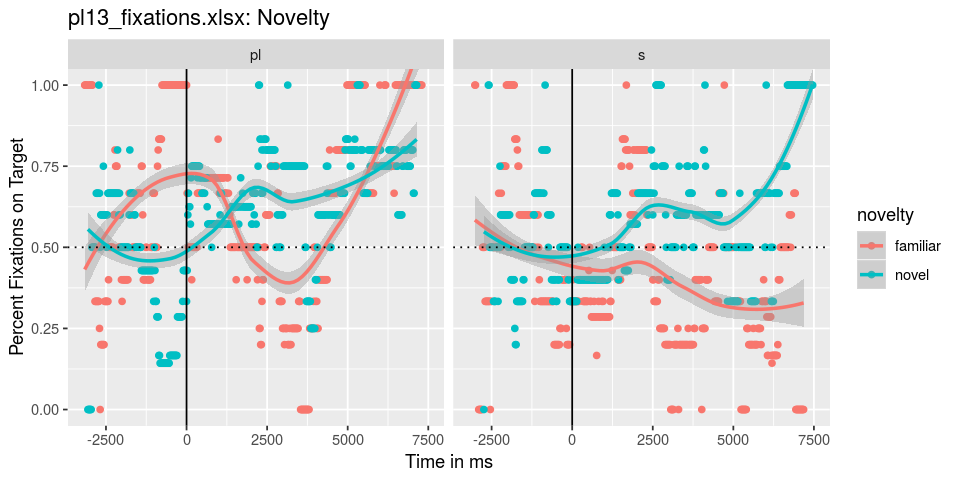

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


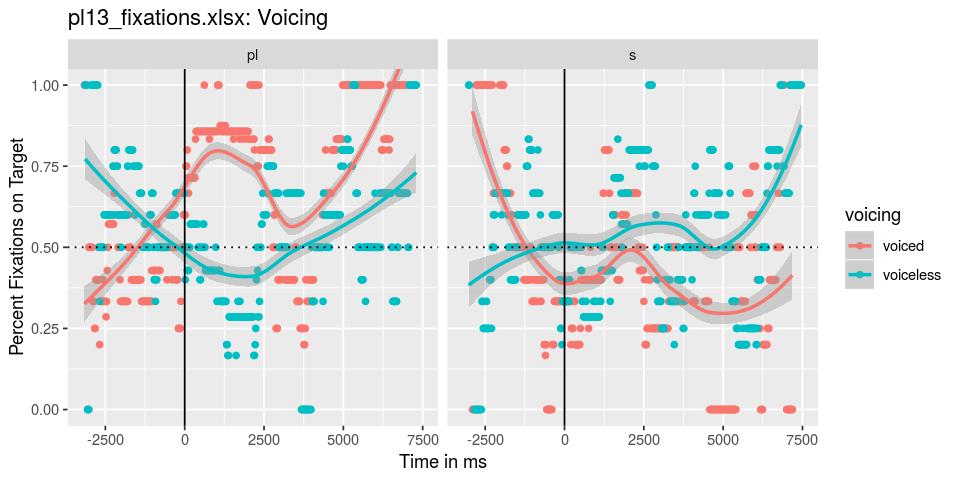

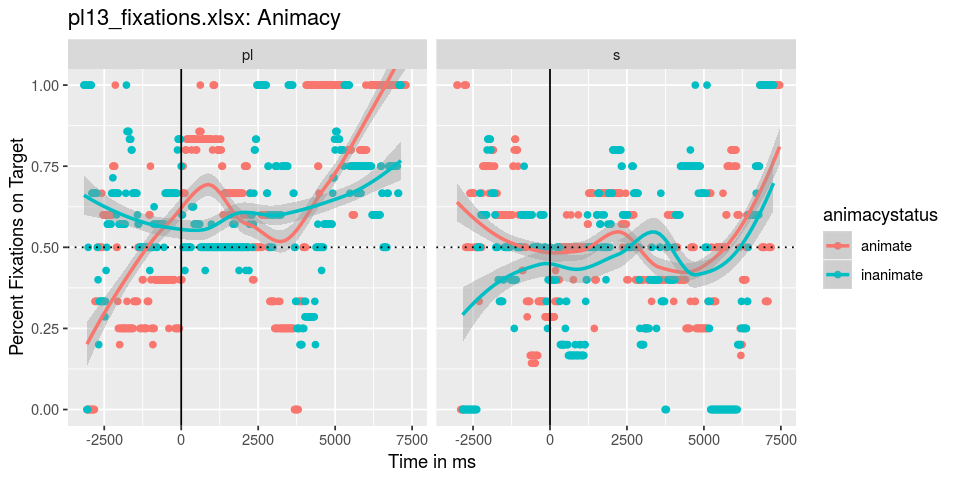

In [36]:
pl13_fixbins = analyzeParticipant('results/pl13_fixations.xlsx', audio_timings,  'child')

[1] "Dimensions of excel file read in:"
[1] 520
[1] "will write to:"
[1] "results/pl14_fixations.txt"


Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 12993, not 12992”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

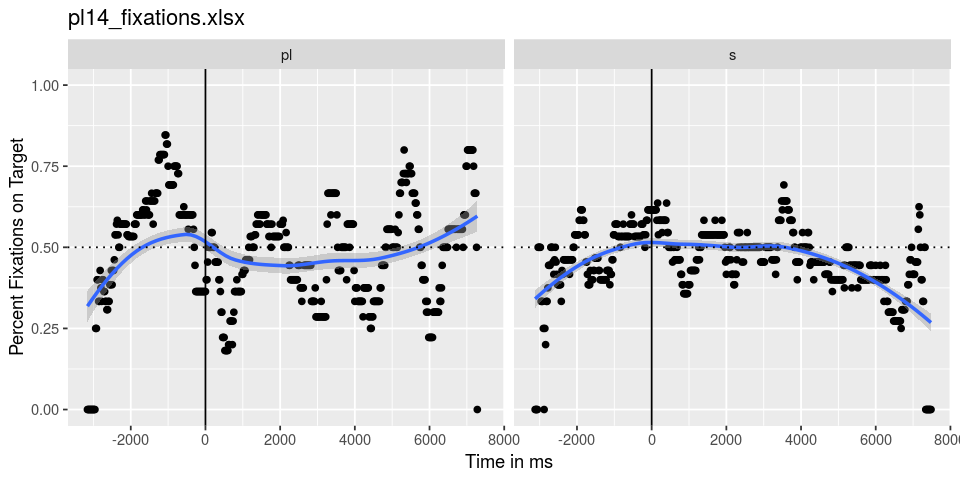

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


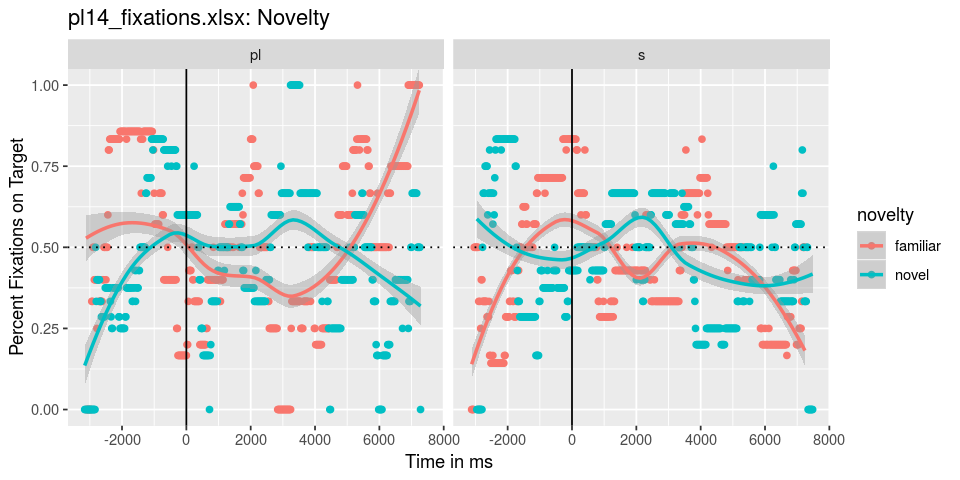

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


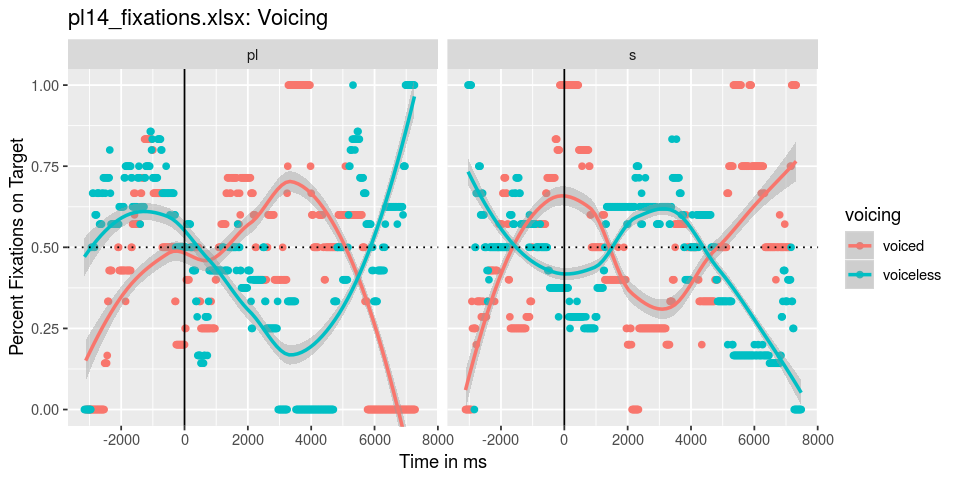

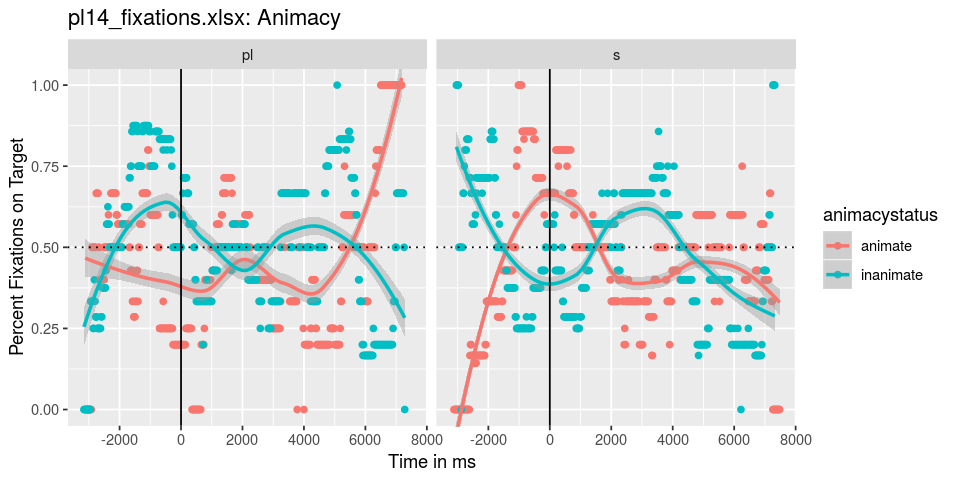

In [40]:
pl14_fixbins = analyzeParticipant('results/pl14_fixations.xlsx', audio_timings,  'child')

[1] "Dimensions of excel file read in:"
[1] 725
[1] "will write to:"
[1] "results/pl15_fixations.txt"


Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 11974, not 11973”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

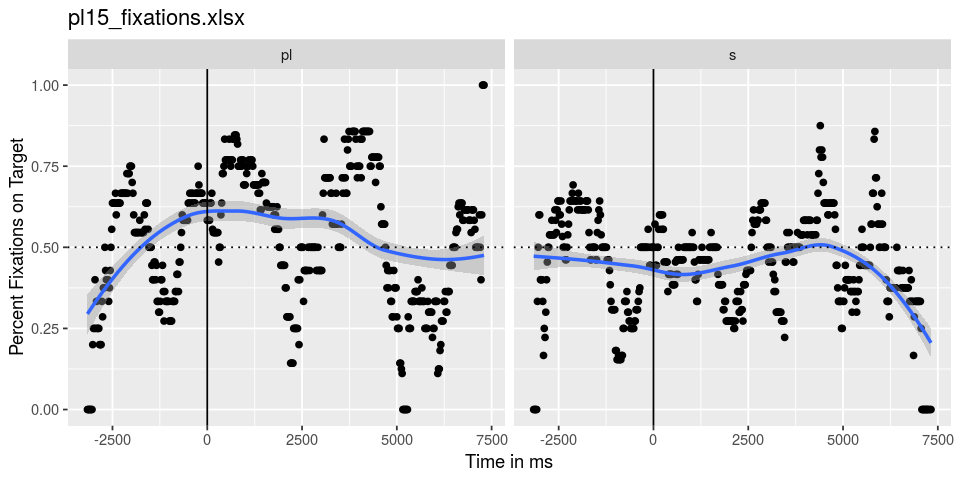

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


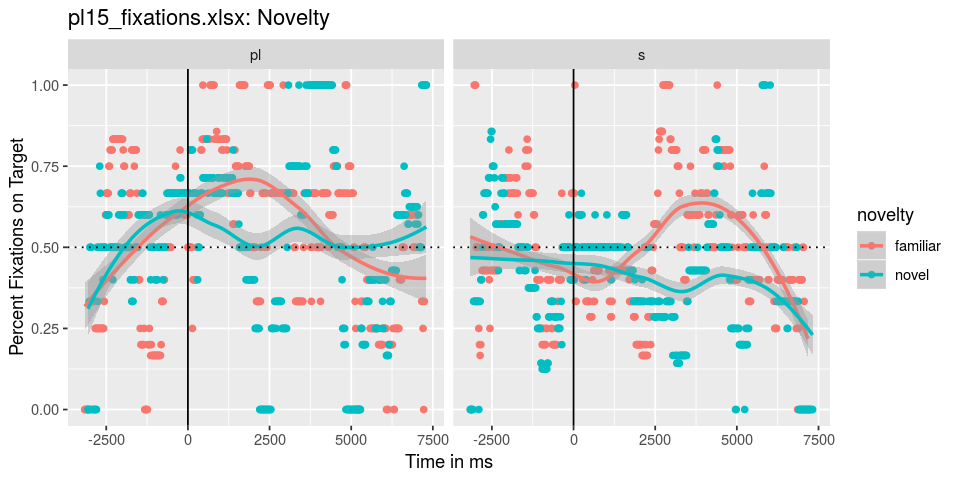

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


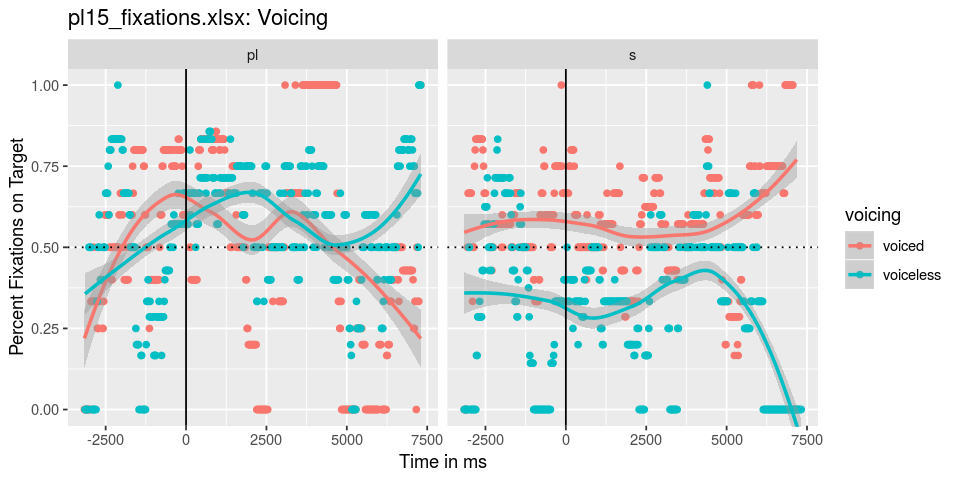

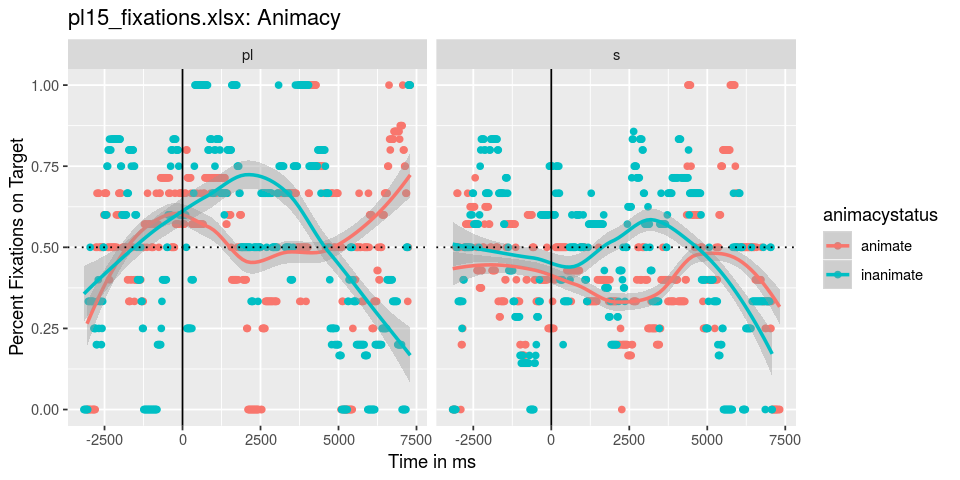

In [39]:
pl15_fixbins = analyzeParticipant('results/pl15_fixations.xlsx', audio_timings,  'child')

[1] "Dimensions of excel file read in:"
[1] 681
[1] "will write to:"
[1] "results/pl16_fixations.txt"


Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 14993, not 14992”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`ge

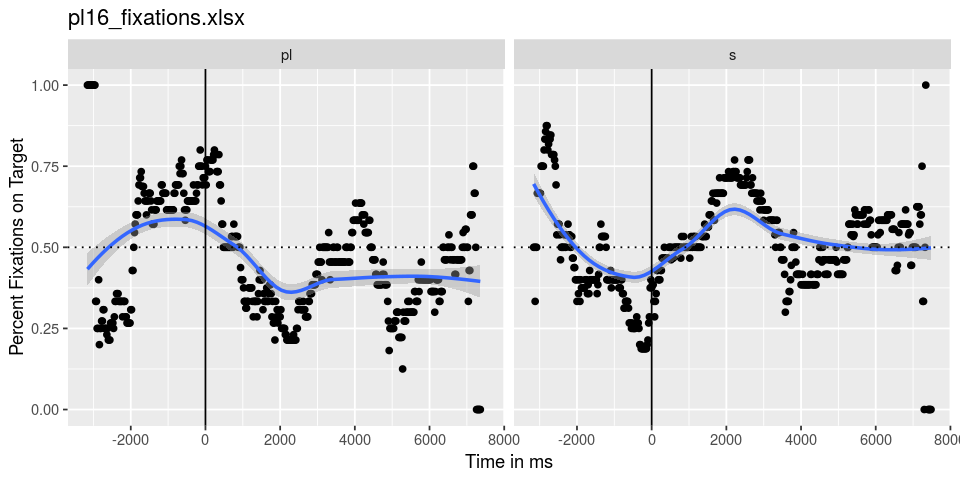

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


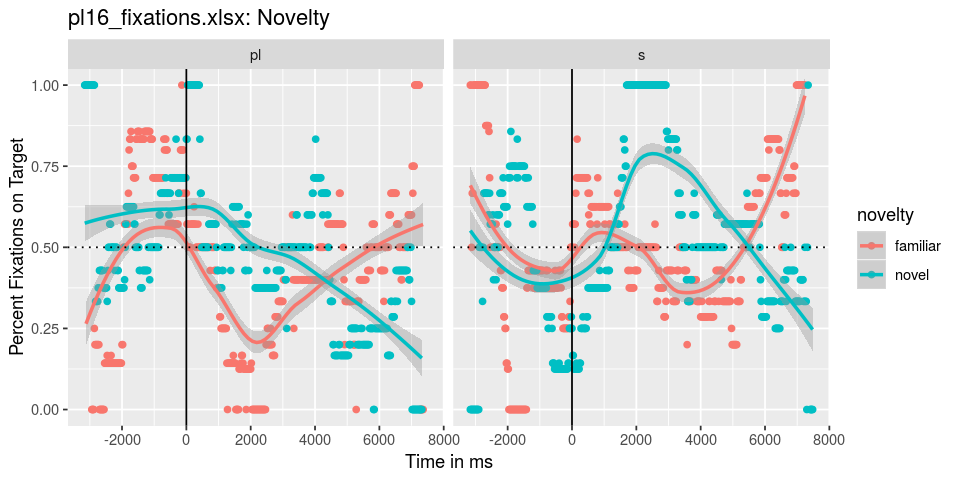

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


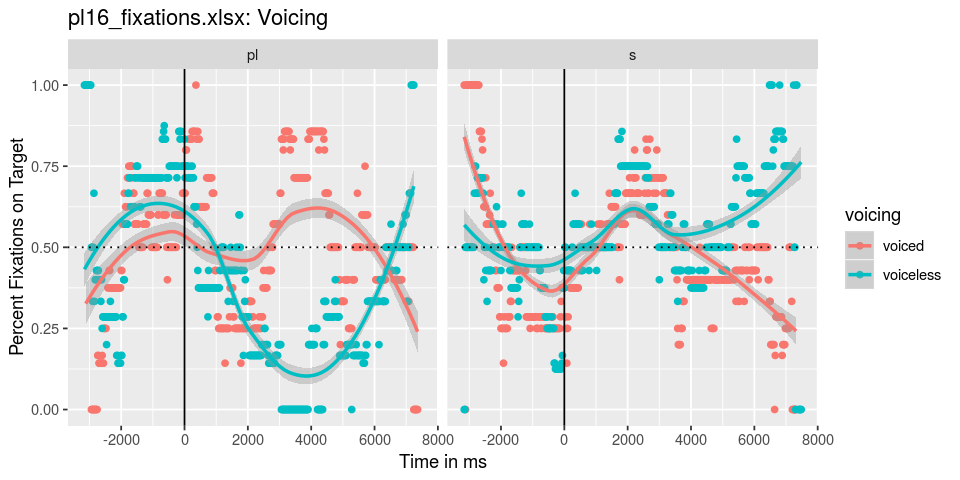

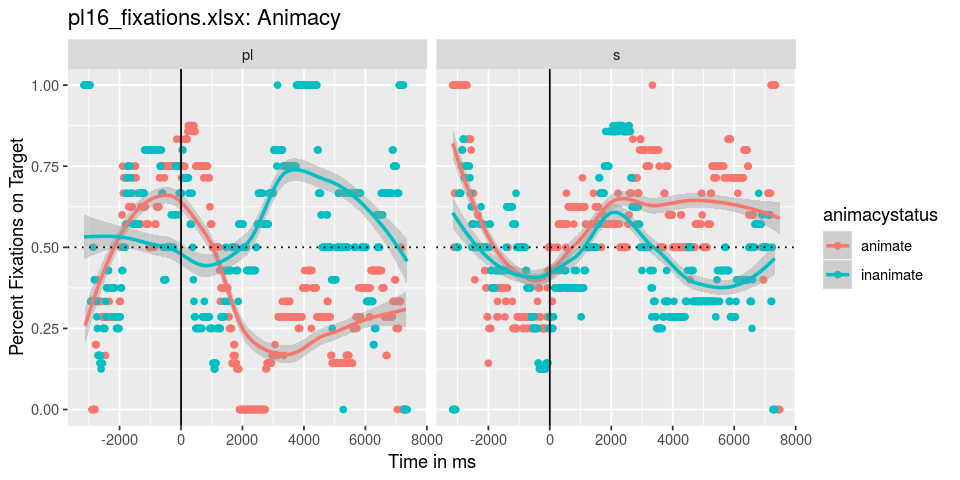

In [38]:
pl16_fixbins = analyzeParticipant('results/pl16_fixations.xlsx', audio_timings,  'child')

# Collection of Fixbins

In [41]:
fixbin_dfs = list(pl06_fixbins, sm_fixbins, pl07_fixbins, 
    pl08_fixbins, pl00_fixbins, pl03_fixbins, pl09_fixbins, pl10_fixbins, pl11_fixbins,
                 pl12_fixbins, adultpilot_pl13_fixbins, adultpilot_pl14_fixbins, 
                  adultpilot_pl15_fixbins, adultpilot_pl16_fixbins, pl13_fixbins,
                 pl14_fixbins, pl15_fixbins, pl16_fixbins)

adult_fixbin_dfs = list(pl06_fixbins, sm_fixbins, pl07_fixbins, 
    pl08_fixbins, pl12_fixbins, adultpilot_pl13_fixbins, adultpilot_pl14_fixbins, 
    adultpilot_pl15_fixbins, adultpilot_pl16_fixbins)
child_fixbins =  list(pl00_fixbins, pl03_fixbins, 
    pl09_fixbins, pl11_fixbins, pl13_fixbins, pl14_fixbins, pl15_fixbins, pl16_fixbins)

nonconv_child_fixbins = list(pl10_fixbins) # only one right now; pl04 only did the productive task

In [43]:
audio_timings$pp_duration = audio_timings$stop_time - audio_timings$target_noun_end_time

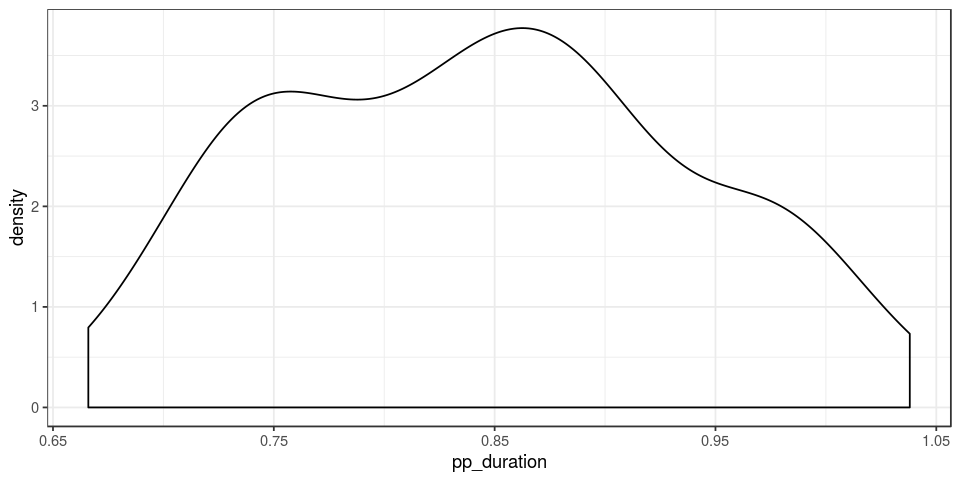

In [44]:
mean_pp_duration= mean(audio_timings$pp_duration, na.rm=T) * 1000
ggplot(audio_timings) + geom_density(aes(x=pp_duration)) + theme_bw()

 [1] "timeBin"                         "FixationID"                     
 [3] "TRIAL_INDEX"                     "RECORDING_SESSION_LABEL"        
 [5] "CURRENT_FIX_INTEREST_AREA_LABEL" "RT"                             
 [7] "expt_index"                      "target"                         
 [9] "s_form"                          "novelty"                        
[11] "animacystatus"                   "voicing"                        
[13] "practice"                        "Time"                           
[15] "Nonset"                          "participant_type"               
[17] "participant_name"                "label_at_onset"                 
[19] "time_to_last_nonna"              "track_loss_at_0"                
[21] "cfial_bin"                      


`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Warning message:
“Removed 4 rows containing missing values (geom_errorbar).”`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Warning message:
“Removed 6 rows containing missing values (geom_errorbar).”

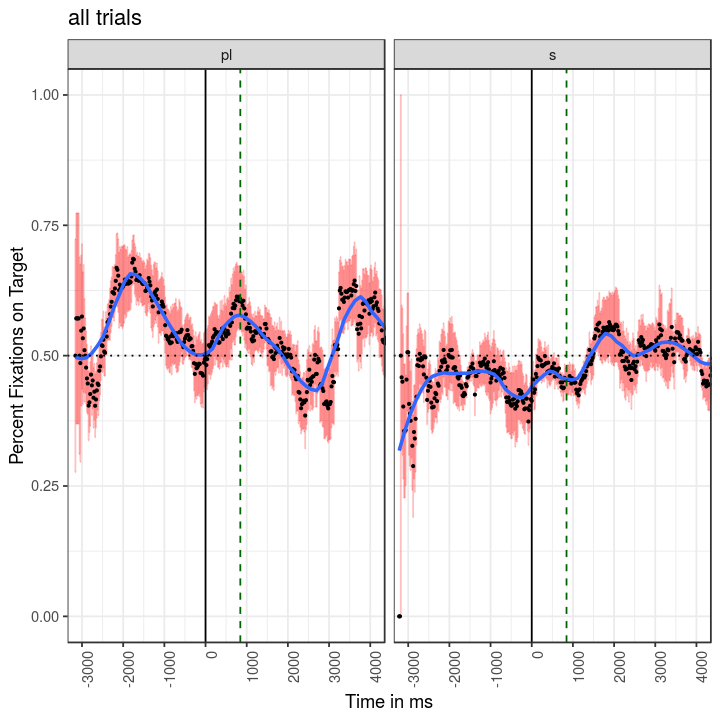

`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Warning message:
“Removed 4 rows containing missing values (geom_errorbar).”

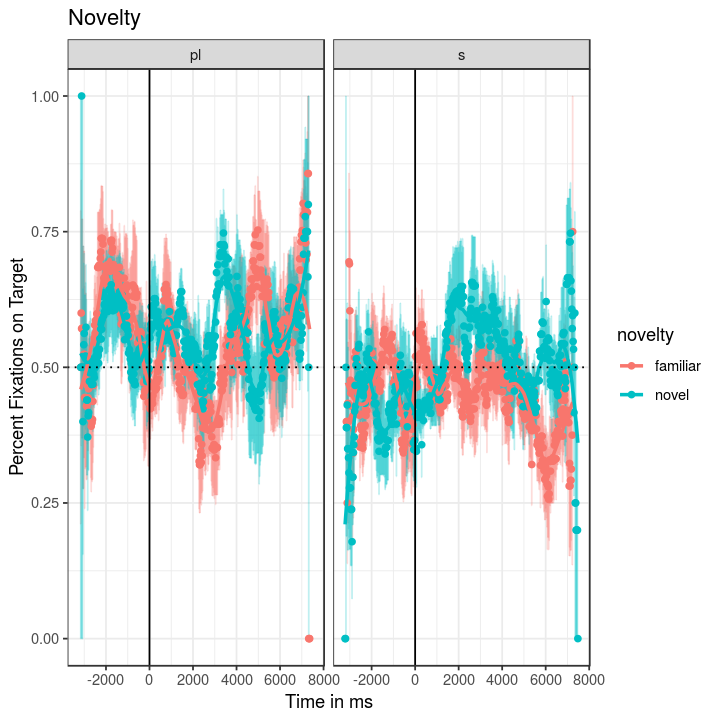

`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Warning message:
“Removed 5 rows containing missing values (geom_errorbar).”Coordinate system already present. Adding new coordinate system, which will replace the existing one.


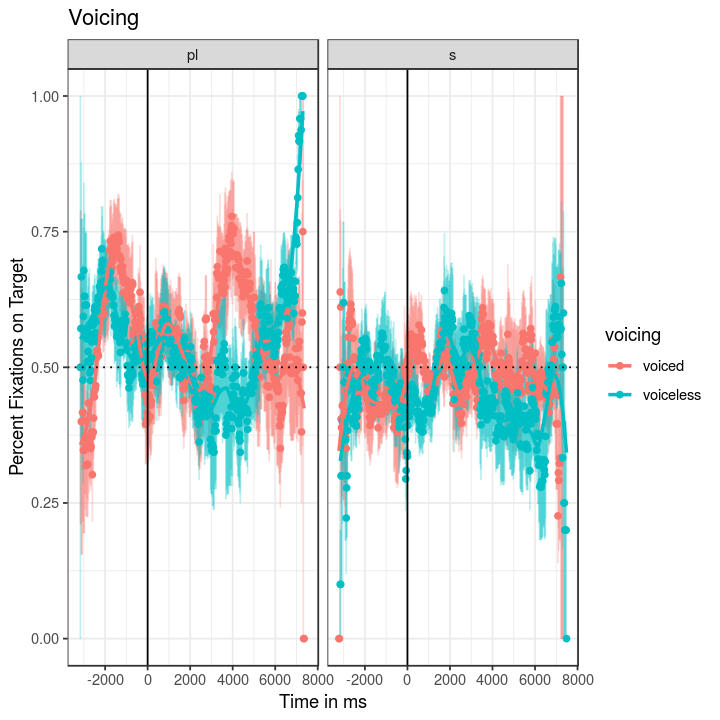

Warning message:
“Removed 4 rows containing missing values (geom_errorbar).”

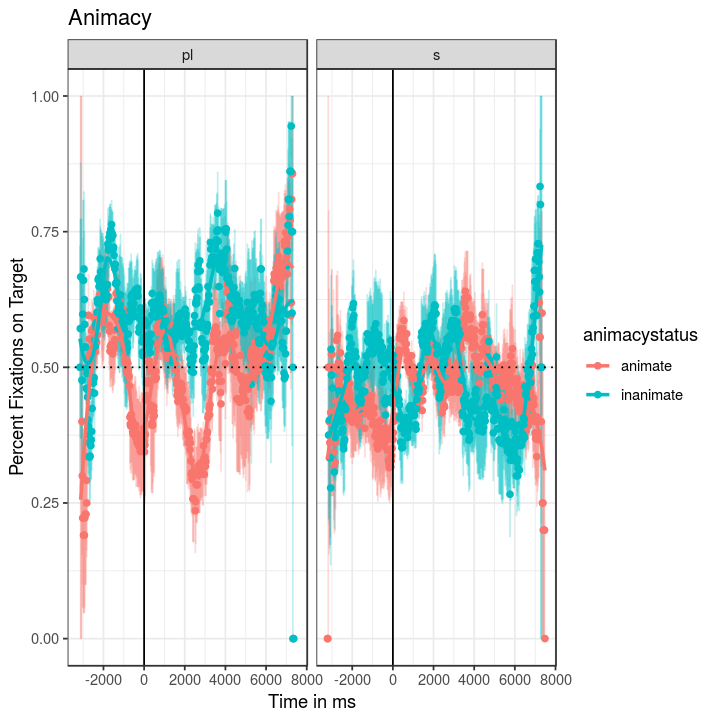

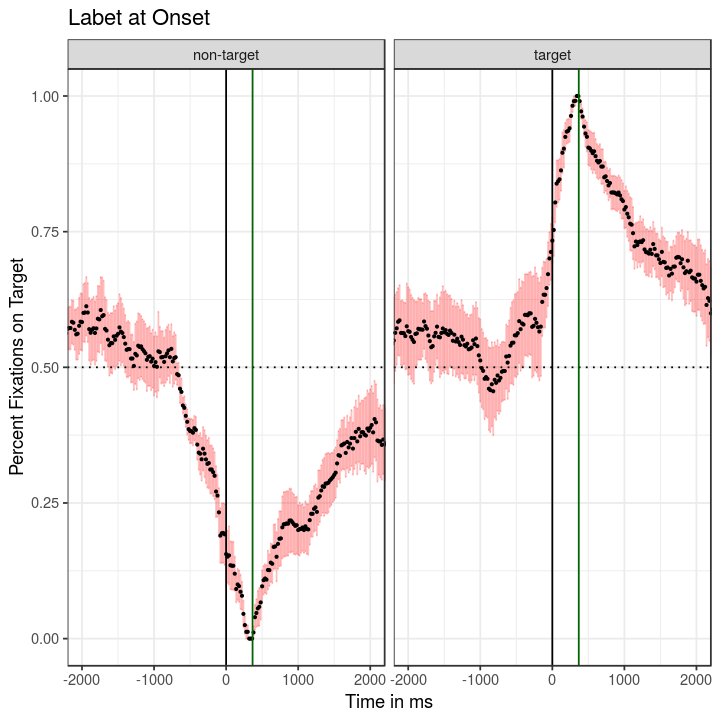

In [48]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
child_group_plots = getGroupPlots(child_fixbins,groupByParticipant=T, mean_pp_duration= mean_pp_duration)

 [1] "timeBin"                         "FixationID"                     
 [3] "TRIAL_INDEX"                     "RECORDING_SESSION_LABEL"        
 [5] "CURRENT_FIX_INTEREST_AREA_LABEL" "RT"                             
 [7] "expt_index"                      "target"                         
 [9] "s_form"                          "novelty"                        
[11] "animacystatus"                   "voicing"                        
[13] "practice"                        "Time"                           
[15] "Nonset"                          "participant_type"               
[17] "participant_name"                "label_at_onset"                 
[19] "time_to_last_nonna"              "track_loss_at_0"                
[21] "cfial_bin"                      


`geom_smooth()` using method = 'loess' and formula 'y ~ x'
`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Warning message:
“Removed 1 rows containing missing values (geom_errorbar).”

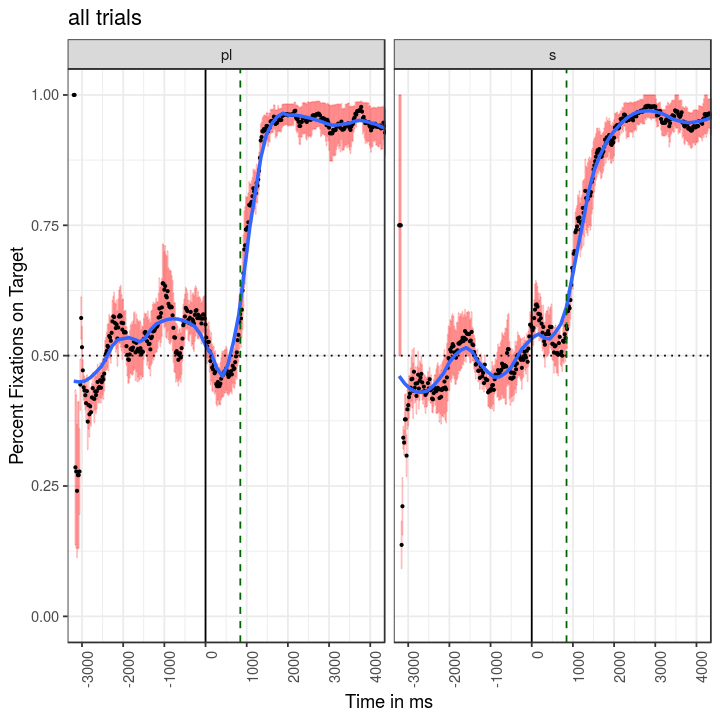

`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Warning message:
“Removed 1 rows containing missing values (geom_errorbar).”

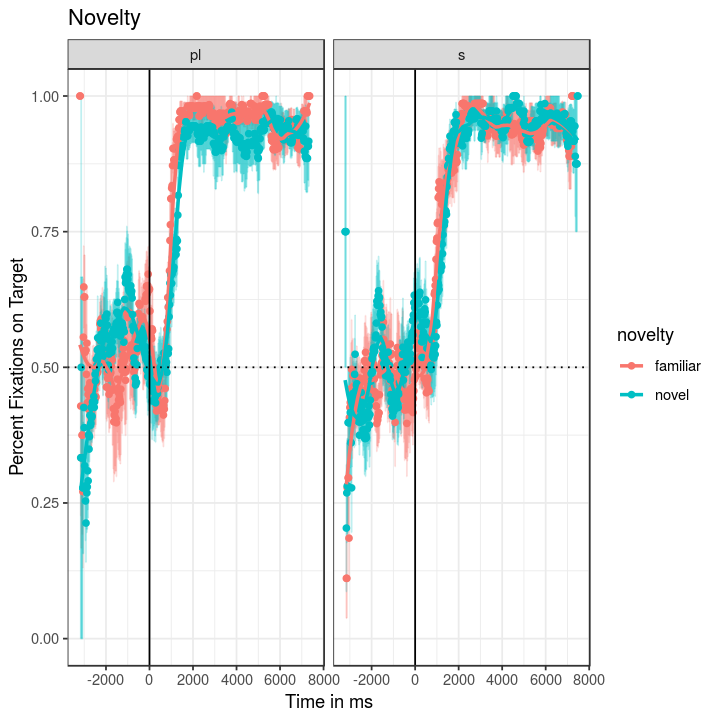

`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Coordinate system already present. Adding new coordinate system, which will replace the existing one.


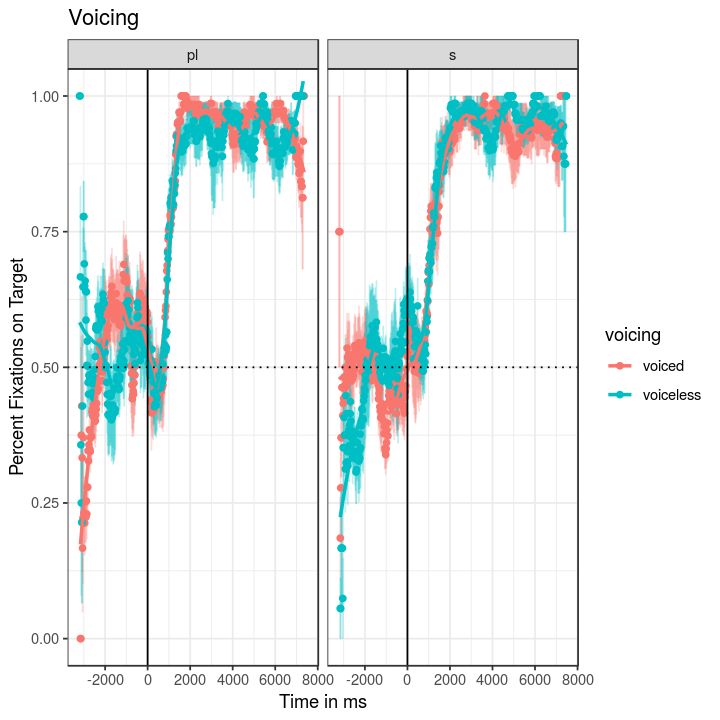

Warning message:
“Removed 1 rows containing missing values (geom_errorbar).”

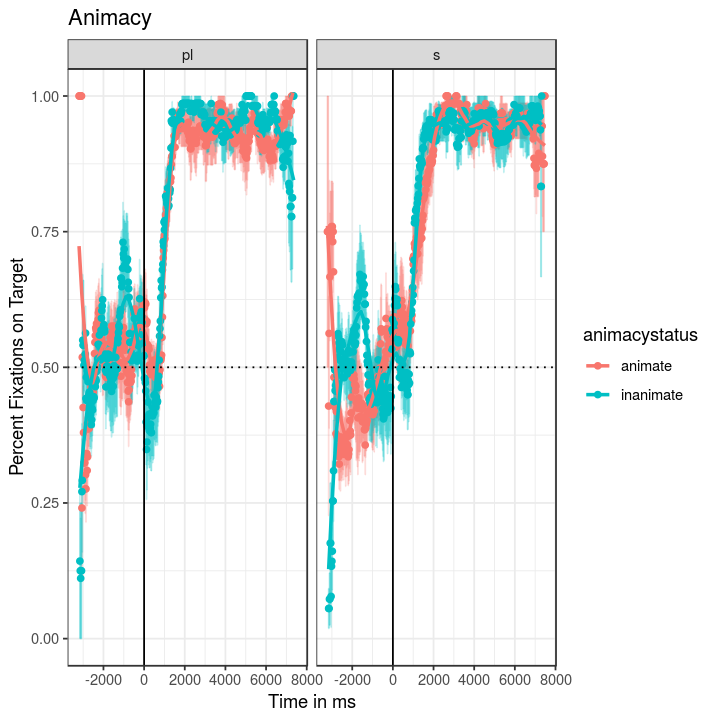

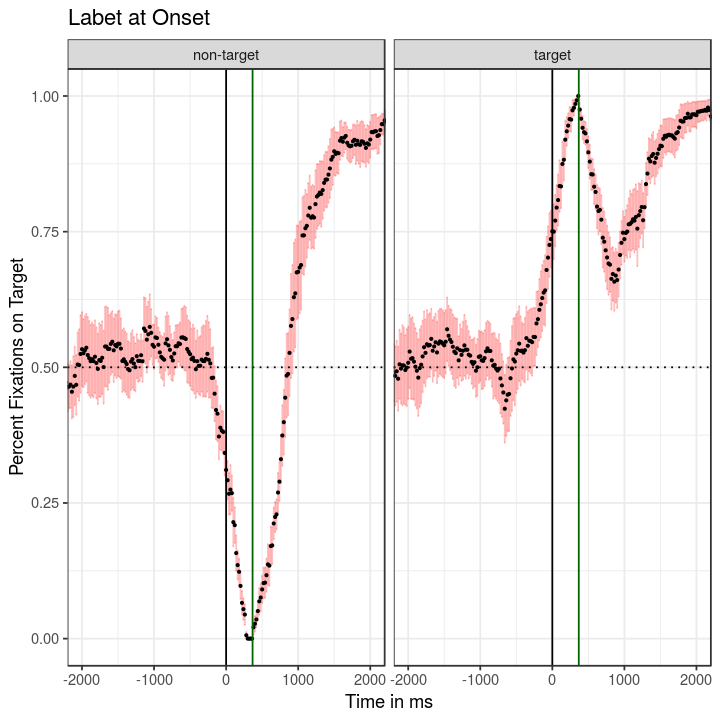

In [49]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
adult_fixbins_coded = getGroupPlots(adult_fixbin_dfs,groupByParticipant=T, mean_pp_duration= mean_pp_duration)

In [ ]:
# if are looking at the distractor, know you are wrong -- switch to the right thing
# reverse sharkfin: if already looking at the target, check out the other because it could be better

In [50]:
names(adult_fixbins_coded)

[1] "timeBin"                         "FixationID"                     
 [3] "TRIAL_INDEX"                     "RECORDING_SESSION_LABEL"        
 [5] "CURRENT_FIX_INTEREST_AREA_LABEL" "RT"                             
 [7] "expt_index"                      "target"                         
 [9] "s_form"                          "novelty"                        
[11] "animacystatus"                   "voicing"                        
[13] "practice"                        "Time"                           
[15] "Nonset"                          "participant_type"               
[17] "participant_name"                "label_at_onset"                 
[19] "time_to_last_nonna"              "track_loss_at_0"                
[21] "cfial_bin"

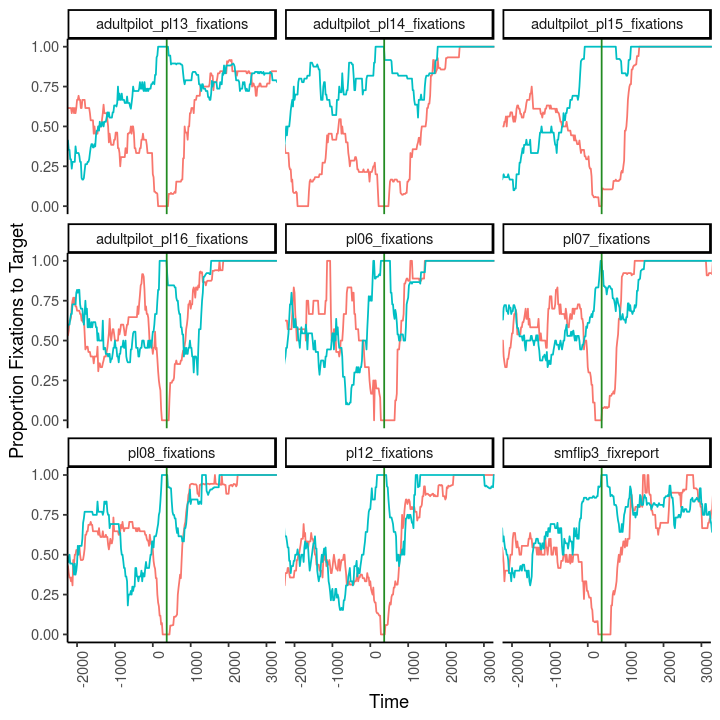

In [51]:
participant_onset = aggregate(cfial_bin ~ Time + participant_name + label_at_onset, adult_fixbins_coded, mean)

ggplot(participant_onset) + geom_line(aes(x=Time, y=cfial_bin, colour=label_at_onset)
) + facet_wrap(~participant_name) + theme_classic() + ylab(
    'Proportion Fixations to Target') + theme(legend.position="none",
            axis.text.x = element_text(angle = 90, hjust = 1)
) + coord_cartesian(xlim=c(-2000, 3000)) + geom_vline(xintercept=367, 
    colour='forestgreen')

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


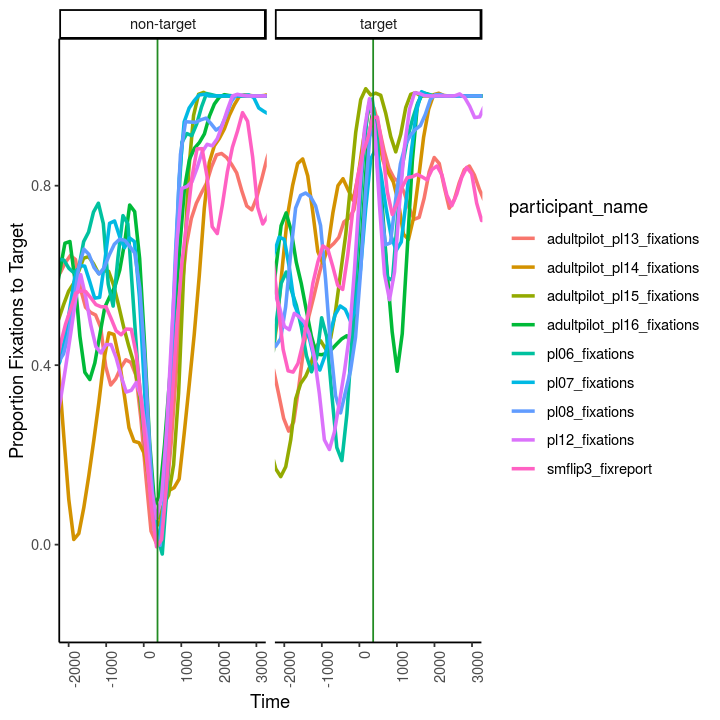

In [52]:
ggplot(participant_onset) + geom_smooth(aes(x=Time, y=cfial_bin, 
colour=participant_name), span=.1, se=F
) + facet_wrap(~label_at_onset) + theme_classic() + ylab(
    'Proportion Fixations to Target') + theme(
            axis.text.x = element_text(angle = 90, hjust = 1)
) + coord_cartesian(xlim=c(-2000, 3000)) + geom_vline(xintercept=367, 
    colour='forestgreen')

Everyone checks out the other thing, some people continue to look at it

# Participant Receptive Scores

In [53]:
source('PLEARN_analysis_helper.R')
test_participant_receptive_knowledge(pl08_fixbins,normalizeMethod = 'none')

participant_type,contrast_type,prob,prop_looks_to_target,thresholded,partition_name,normalizeMethod
adult,4-way,1.445313e-01,0.6970452,Unclear ( .05 < p < .33),4-way: familiar-voiced,none
adult,4-way,3.906250e-03,0.8131766,Demonstrates RK! (p < .05),4-way: familiar-voiceless,none
adult,4-way,3.906250e-03,0.8274424,Demonstrates RK! (p < .05),4-way: novel-voiced,none
adult,4-way,3.906250e-03,0.8513579,Demonstrates RK! (p < .05),4-way: novel-voiceless,none
adult,2-way,2.090454e-03,0.7551109,Demonstrates RK! (p < .05),2-way: familiar,none
adult,2-way,1.525879e-05,0.8394002,Demonstrates RK! (p < .05),2-way: novel,none
adult,2-way,2.090454e-03,0.7622438,Demonstrates RK! (p < .05),2-way: voiced,none
adult,2-way,1.525879e-05,0.8322673,Demonstrates RK! (p < .05),2-way: voiceless,none
adult,1-way,1.231674e-07,0.7972555,Demonstrates RK! (p < .05),1-way: All,none


In [54]:
normalizeMethods = c('none','yoked','preceding')
all_scores = do.call('rbind', lapply(normalizeMethods, function(normalizeMethod){
    do.call('rbind', lapply(fixbin_dfs, function(fixbin_df){
        test_participant_receptive_knowledge(fixbin_df, normalizeMethod, end_analysis_window= 2500)
    }))    
}))

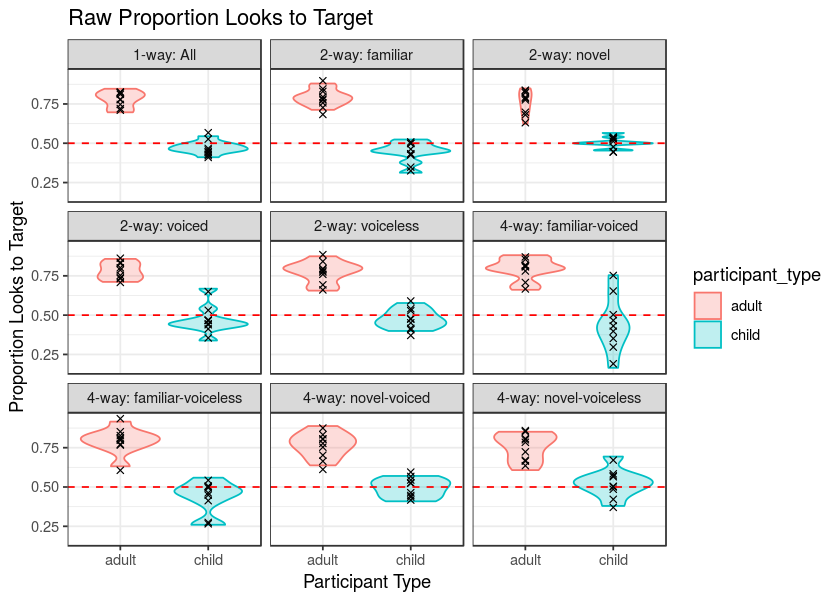

In [55]:
options(repr.plot.width=7, repr.plot.height=5)
ggplot(subset(all_scores, normalizeMethod == 'none')) + geom_violin(
aes(y=prop_looks_to_target, x = participant_type,
colour = participant_type, fill = participant_type), alpha=.25) +
geom_point(aes(x=participant_type, y=prop_looks_to_target), colour ='black',
shape = 4, position=position_jitter(height=.03, width=0)) + facet_wrap(
~partition_name) + theme_bw() + geom_hline(yintercept=.5, 
linetype = 'dashed', colour='red') + ggtitle('Raw Proportion Looks to Target'
) + xlab('Participant Type') + ylab('Proportion Looks to Target') 

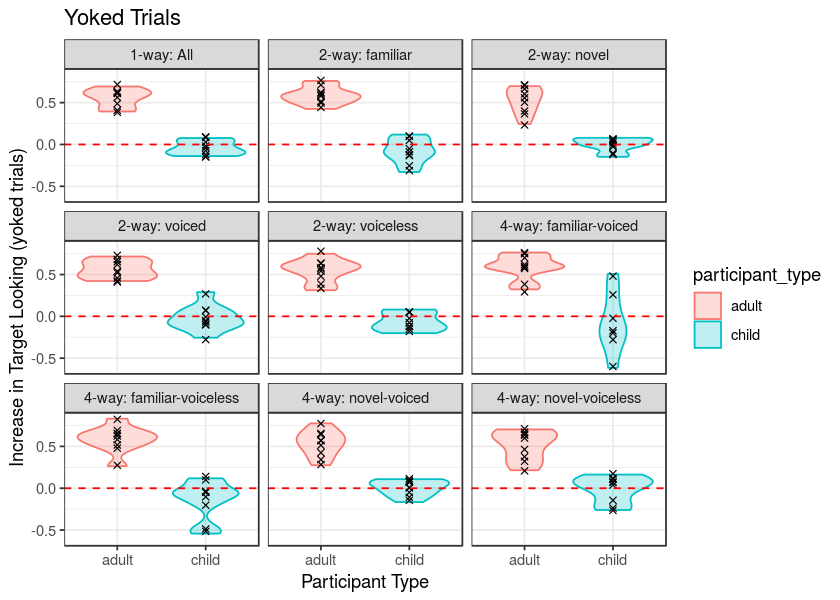

In [58]:
options(repr.plot.width=7, repr.plot.height=5)
ggplot(subset(all_scores, normalizeMethod == 'yoked')) + geom_violin(
aes(y=prop_looks_to_target, x = participant_type,
colour = participant_type, fill = participant_type), alpha=.25) +
geom_point(aes(x=participant_type, y=prop_looks_to_target), colour ='black',
shape = 4, position=position_jitter(height=.03, width=0)) + facet_wrap(
~partition_name) + theme_bw() + geom_hline(yintercept=0, 
linetype = 'dashed', colour='red') + ggtitle('Yoked Trials'
) + xlab('Participant Type') + ylab('Increase in Target Looking (yoked trials)') 

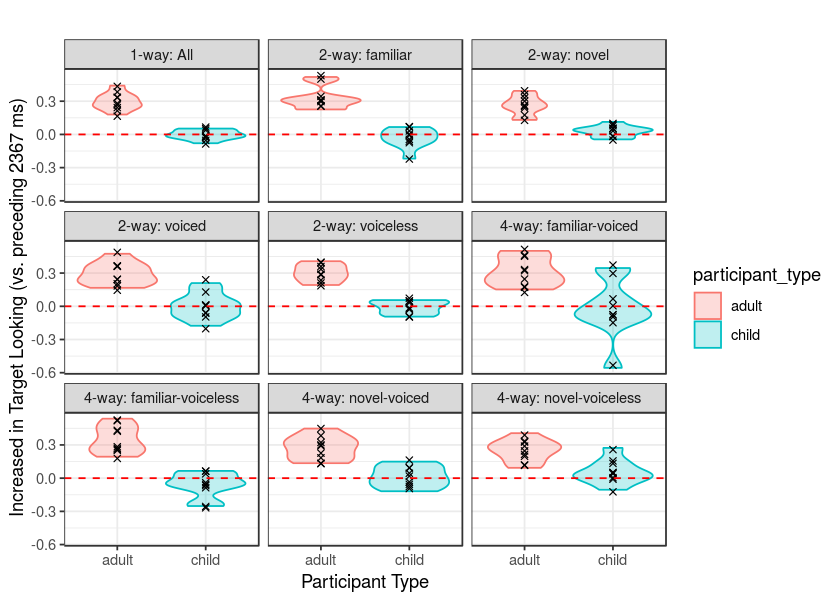

In [59]:
options(repr.plot.width=7, repr.plot.height=5)
ggplot(subset(all_scores, normalizeMethod == 'preceding')) + geom_violin(
aes(y=prop_looks_to_target, x = participant_type,
colour = participant_type, fill = participant_type), alpha=.25) +
geom_point(aes(x=participant_type, y=prop_looks_to_target), position=position_jitter(
height=.03, width=0), colour ='black', shape = 4) + facet_wrap(
~partition_name) + theme_bw() + geom_hline(yintercept=0, 
linetype = 'dashed', colour='red') + ggtitle(''
) + xlab('Participant Type') + ylab('Increased in Target Looking (vs. preceding 2367 ms)') 

# Binomial Test Exploration

In [61]:
pl06_fixbins$is_looking_at_target  = as.numeric(pl06_fixbins$CURRENT_FIX_INTEREST_AREA_LABEL == 'TARGET')

[1] 213840


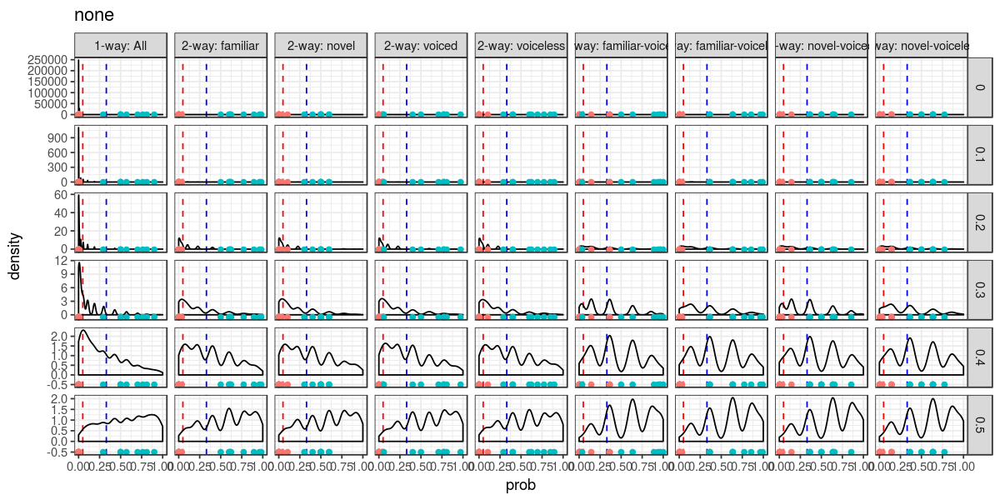

In [62]:
# takes a long time to run because of the bootstrapping
source('PLEARN_analysis_helper.R')
rlist = getPlotForMethod(fixbin_dfs, adult_fixbin_dfs, 'none')
options(repr.plot.width=10, repr.plot.height=5)
print(rlist$p1)
ggsave('figures/binomialTest_nopreprocessing.pdf', width=20, height=10)

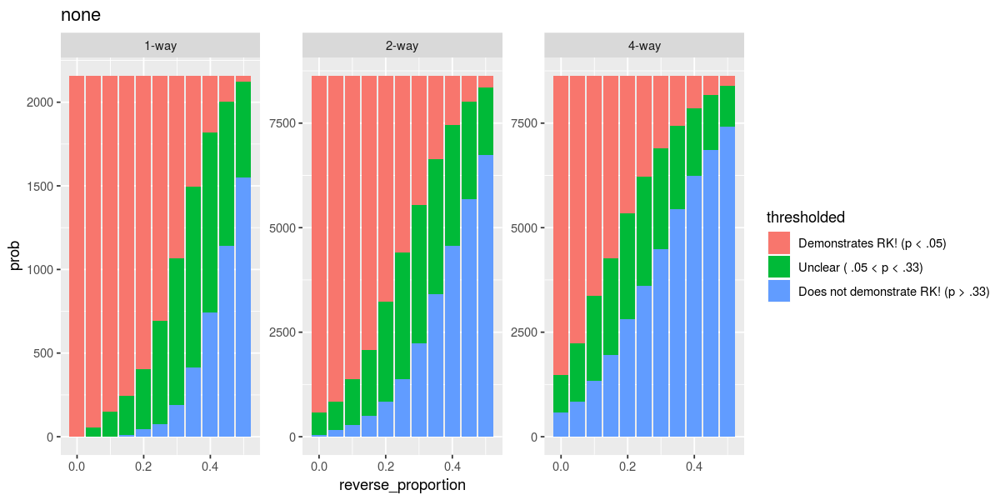

In [63]:
print(rlist$p2)

False negative rate around .1 on 2-way contrasts when halfway between adult-like knowledge and zero knowledge

False positve rate of around .02 on 1-way contrasts when zero-knowledge


[1] 213840


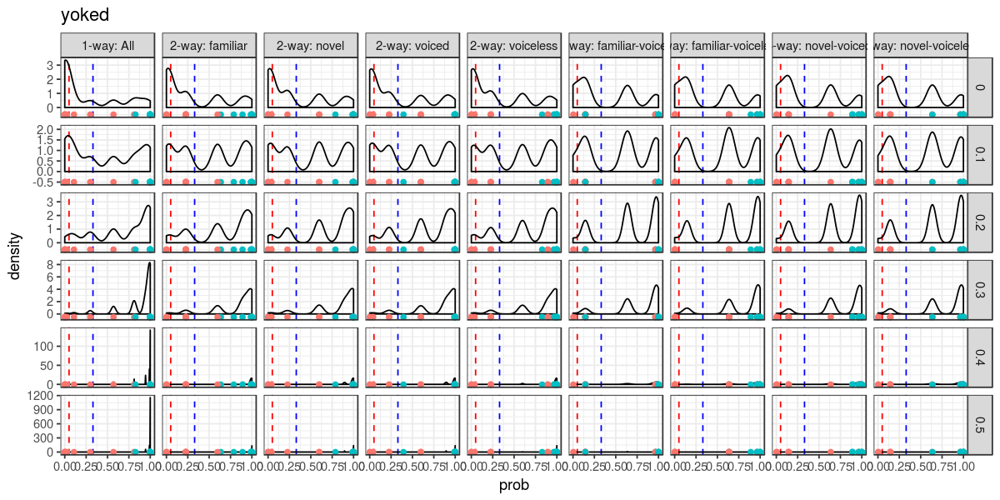

In [64]:
# takes a long time to run because of the bootstrapping
sim_yoked = getPlotForMethod(fixbin_dfs,adult_fixbin_dfs, 'yoked')
options(repr.plot.width=10, repr.plot.height=5)
print(sim_yoked$p1)
ggsave('figures/binomialTest_yoked.pdf', width=20, height=10)

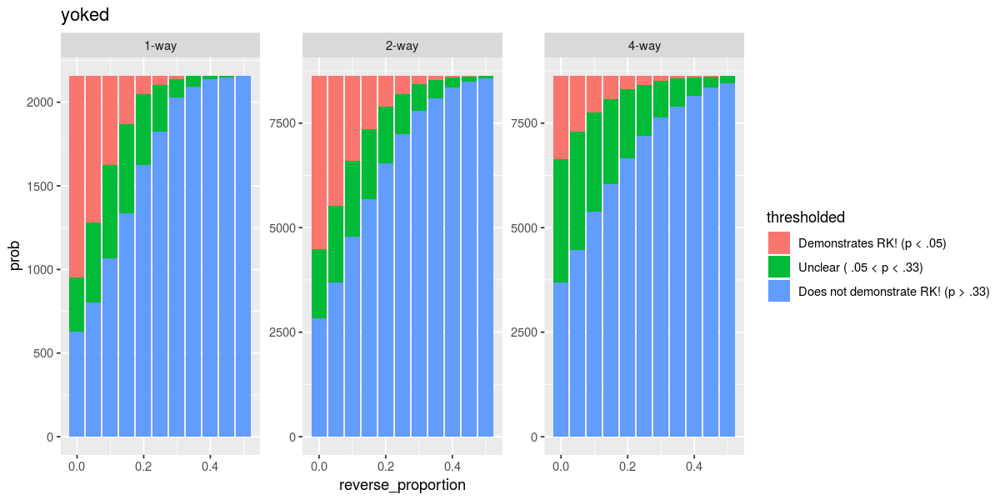

In [65]:
sim_yoked$p2

[1] 213840


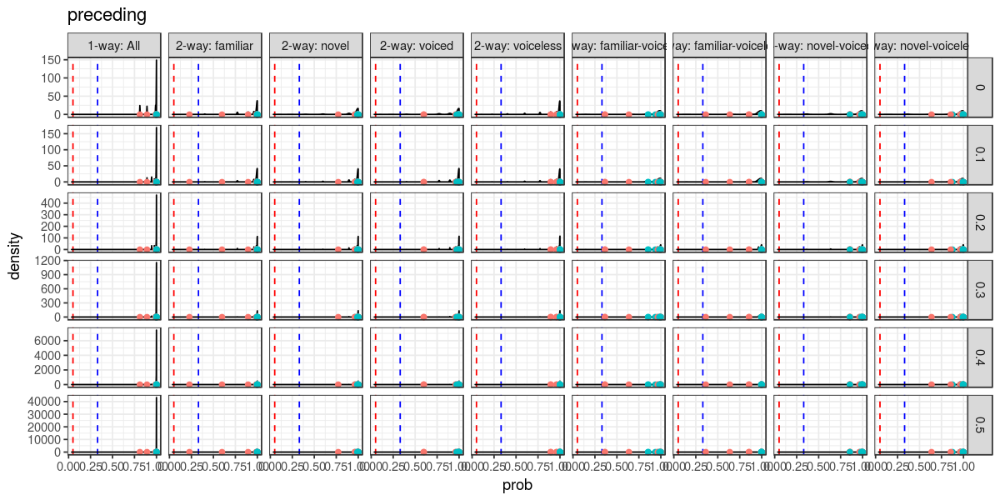

In [66]:
# takes a long time to run because of the bootstrapping
sim_preceding = getPlotForMethod(fixbin_dfs,adult_fixbin_dfs, 'preceding')
options(repr.plot.width=10, repr.plot.height=5)
print(sim_preceding$p1)
ggsave('figures/binomialTest_preceding.pdf', width=20, height=10)

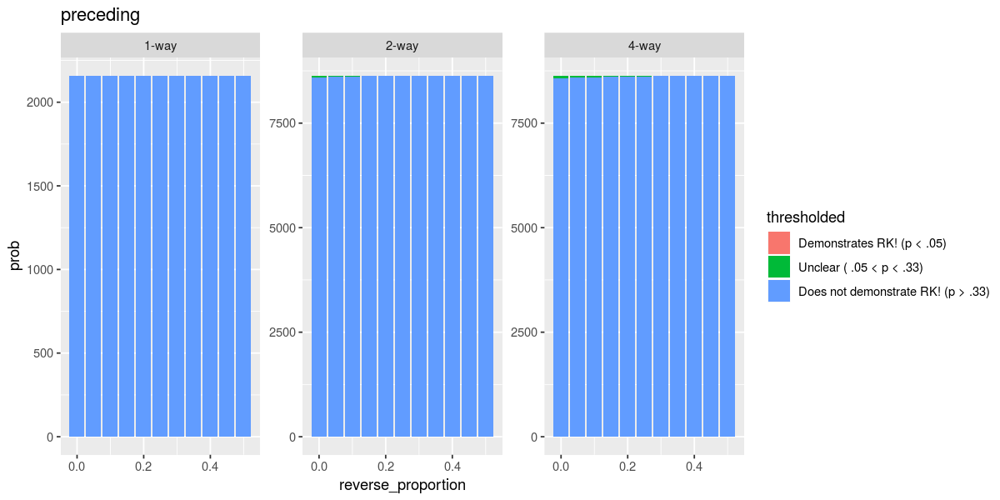

In [67]:
sim_preceding$p2

# Experimental Plot Types

In [135]:
fixreport_path = 'results/smflip3_fixreport.txt'
participant_name = gsub('.txt','',tail(strsplit(fixreport_path, '/')[[1]]))[2]

gaze = blabr::fixations_report(fixreport_path)
gaze = merge(gaze, audio_timings[,c('audiotarget','disambig_time')])
gaze$CURRENT_FIX_END = gaze$CURRENT_FIX_END - gaze$disambig_time
gaze$CURRENT_FIX_START = gaze$CURRENT_FIX_START - gaze$disambig_time

fixbins = binifyFixations(gaze, keepCols=c("RECORDING_SESSION_LABEL",
"CURRENT_FIX_INTEREST_AREA_LABEL",
"RT",
"expt_index",
"target",
"s_form",
"novelty",
"animacystatus",
"voicing"))
subset(fixbins, Time==3200)

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Warning message:
“Length of logical index must be 1 or 13104, not 13103”

timeBin,FixationID,RECORDING_SESSION_LABEL,CURRENT_FIX_INTEREST_AREA_LABEL,RT,expt_index,target,s_form,novelty,animacystatus,voicing,Time
160,32,flipsm,DISTRACTOR,-1,26,pl,dup,novel,animate,voiceless,3200
160,53,flipsm,DISTRACTOR,-1,18,pl,nop,novel,inanimate,voiceless,3200
160,68,flipsm,TARGET,-1,20,s,kib,novel,animate,voiced,3200
160,89,flipsm,DISTRACTOR,-1,27,s,mip,novel,inanimate,voiceless,3200
160,155,flipsm,TARGET,-1,12,pl,kib,novel,animate,voiced,3200
160,173,flipsm,TARGET,-1,29,pl,deg,novel,animate,voiced,3200
160,193,flipsm,TARGET,-1,9,pl,teb,novel,inanimate,voiced,3200
160,212,flipsm,TARGET,-1,15,pl,pib,novel,inanimate,voiced,3200
160,224,flipsm,TARGET,-1,30,s,duck,familiar,animate,voiceless,3200
160,234,flipsm,TARGET,-1,23,s,ant,familiar,animate,voiceless,3200


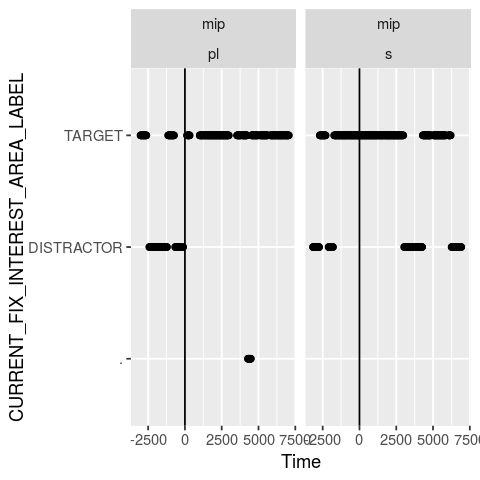

In [136]:
ggplot(subset(fixbins, s_form =='mip')) + geom_point(aes(x=Time, y=CURRENT_FIX_INTEREST_AREA_LABEL)
) + facet_wrap(~s_form * target) + geom_vline(xintercept=0,
	colour='black')

In [137]:
# just find the switches
# distribution over switches to targets vs. distractors, singulars vs. plurals

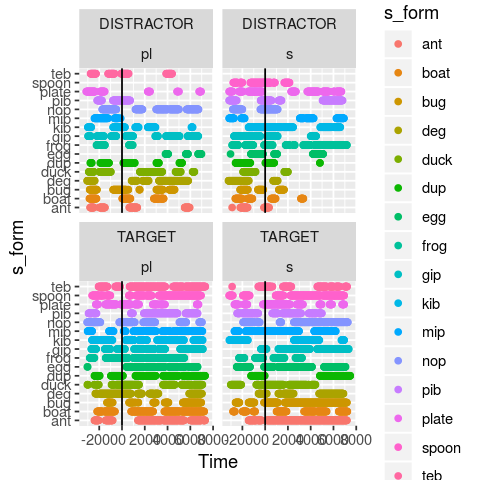

In [138]:
ggplot(subset(sm_fixbins, CURRENT_FIX_INTEREST_AREA_LABEL!='.')) + geom_point(aes(x=Time,
                                                                               y=s_form, colour=s_form)) + facet_wrap(CURRENT_FIX_INTEREST_AREA_LABEL ~ target) + geom_vline(xintercept=0, colour='black')

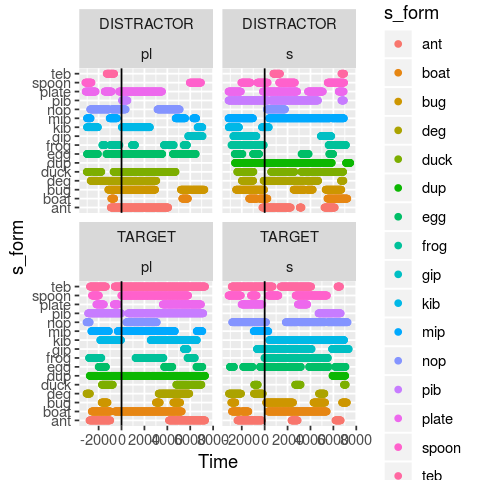

In [139]:
ggplot(subset(pl00_fixbins, CURRENT_FIX_INTEREST_AREA_LABEL!='.')) + geom_point(aes(x=Time,
    y=s_form, colour=s_form)) + facet_wrap(CURRENT_FIX_INTEREST_AREA_LABEL ~ target) + geom_vline(xintercept=0, colour='black')

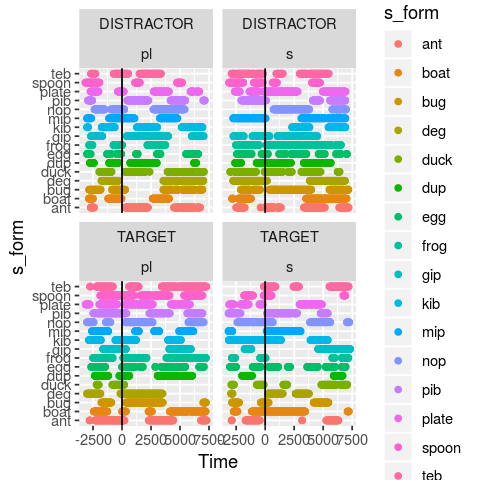

In [140]:
ggplot(subset(pl01_fixbins, CURRENT_FIX_INTEREST_AREA_LABEL!='.')) + geom_point(aes(x=Time,
    y=s_form, colour=s_form)) + facet_wrap(CURRENT_FIX_INTEREST_AREA_LABEL ~ target) + geom_vline(xintercept=0, colour='black')

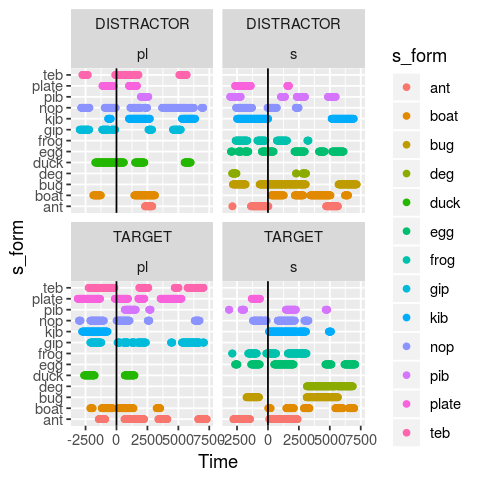

In [141]:
ggplot(subset(pl03_fixbins, CURRENT_FIX_INTEREST_AREA_LABEL!='.')) + geom_point(aes(x=Time,
    y=s_form, colour=s_form)) + facet_wrap(CURRENT_FIX_INTEREST_AREA_LABEL ~ target) + geom_vline(xintercept=0, colour='black')

In [ ]:
# [X]  does the eye tracking recording start relative to the beginning of the audio? that would explain the difference at 2500 ms
# CURRENT_FIX_INTEREST_AREA_LABEL not recorded correctly when moved from old folder to new folder
# [X] split out by singulars and plurals

# Production Data

In [70]:
p_coded = read.csv('productions_coded.csv', stringsAsFactors=F)
print(names(p_coded))
print(nrow(p_coded))

[1] "child"         "itemId"        "Lemma"         "Singular.IPA" 
[5] "Singular.Code" "Plural.IPA"    "Plural.Code"   "Comments"     
[1] 220


In [71]:
codebook = c(
    'No data (0)',
    'No verbal response (1)',
    'Not identifiable/babble (2)',
    'Other word (not noun) (3)',
    'Noun from context (4)',
    'Singular form (5)',
    'Non-conventional plural form (6)',
    'Plural form, approximate articulation (7)',
    'Plural form, adult-like articulation (8)' 
)

codes = data.frame(code = seq(0,8), description = codebook)
codes$description = factor(codes$description, levels = codebook)

In [72]:
names(p_coded)

[1] "child"         "itemId"        "Lemma"         "Singular.IPA" 
[5] "Singular.Code" "Plural.IPA"    "Plural.Code"   "Comments"

In [73]:
# get the item properties into here
pt_ds = read.csv('../PLEARN_experiments/plearn_productiveTask_datasource.csv')
p_coded = merge(p_coded, pt_ds, by.x='Lemma', by.y='s_form')
nrow(p_coded)

[1] 176

In [74]:
print(names(p_coded))
nrow(p_coded)

 [1] "Lemma"              "child"              "itemId"            
 [4] "Singular.IPA"       "Singular.Code"      "Plural.IPA"        
 [7] "Plural.Code"        "Comments"           "novel_id"          
[10] "background_context" "vowel_carrier"      "full_carrier"      
[13] "s_carrier"          "s_punct"            "s_wav_index"       
[16] "s_sentence"         "pl_form"            "pl_carrier"        
[19] "pl_punct"           "pl_wav_index"       "pl_sentence"       
[22] "novelty"            "voicing"            "simple_pl_stim"    
[25] "simple_s_stim"      "animacyStatus"      "test_index"        
[28] "trial_index"        "Trial"              "Practice"          
[31] "NovelColor"         "book"              


[1] 176

In [75]:
s_codes = aggregate(itemId ~ Singular.Code + child, p_coded, length)
names(s_codes) = c('code', 'child', 'count')
s_codes = merge(s_codes, codes)
s_codes$type ='singular'
s_codes

code,child,count,description,type
0,pl01,1,No data (0),singular
1,pl01,3,No verbal response (1),singular
1,pl11,14,No verbal response (1),singular
1,pl05,14,No verbal response (1),singular
1,pl15,1,No verbal response (1),singular
1,pl03,3,No verbal response (1),singular
1,pl09,8,No verbal response (1),singular
2,pl01,2,Not identifiable/babble (2),singular
2,pl03,1,Not identifiable/babble (2),singular
2,pl15,1,Not identifiable/babble (2),singular


In [76]:
p_codes = aggregate(itemId ~ Plural.Code + child, p_coded, length)
names(p_codes) = c('code', 'child','count')
p_codes = merge(p_codes, codes)
p_codes$type = 'plural'
p_codes

code,child,count,description,type
0,pl01,2,No data (0),plural
1,pl01,2,No verbal response (1),plural
1,pl03,2,No verbal response (1),plural
1,pl05,12,No verbal response (1),plural
1,pl15,1,No verbal response (1),plural
1,pl11,16,No verbal response (1),plural
1,pl09,13,No verbal response (1),plural
2,pl04,1,Not identifiable/babble (2),plural
2,pl01,4,Not identifiable/babble (2),plural
2,pl16,1,Not identifiable/babble (2),plural


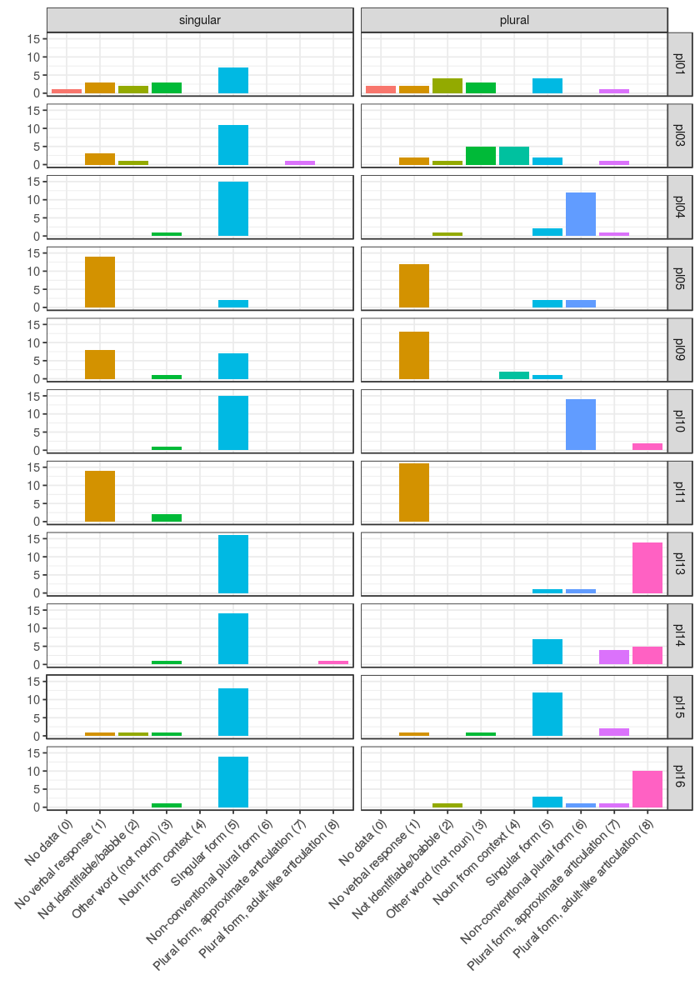

In [77]:
library('plyr')
library('ggplot2')
code_counts = rbind.fill(s_codes, p_codes)
code_counts$type = factor(code_counts$type, levels =c('singular','plural'))
options(repr.plot.width=7, repr.plot.height=10)
ggplot(code_counts) + geom_bar(aes(x=description, y=count, fill=description), stat='identity'
) + theme_bw() +theme(legend.position="none") + theme(axis.text.x = element_text(angle = 45, 
hjust = 1)) + xlab('') + ylab('') + facet_grid(child~type)

code,child,count,description,type
0,pl01,1,No data (0),plural
1,pl03,1,No verbal response (1),plural
1,pl09,4,No verbal response (1),plural
2,pl16,1,Not identifiable/babble (2),plural
2,pl04,1,Not identifiable/babble (2),plural
3,pl01,2,Other word (not noun) (3),plural
3,pl03,3,Other word (not noun) (3),plural
3,pl15,1,Other word (not noun) (3),plural
4,pl03,4,Noun from context (4),plural
4,pl09,2,Noun from context (4),plural


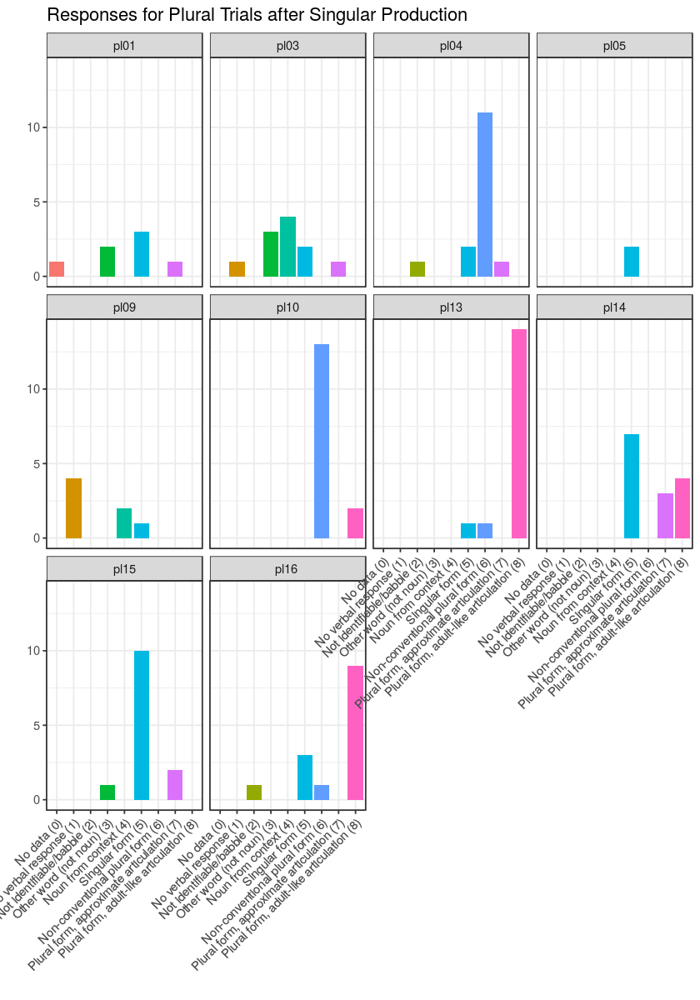

In [78]:
# coded trials after  singular productions, #5
p_codes = aggregate(itemId ~ Plural.Code + child, subset(p_coded, Singular.Code == 5), length)
names(p_codes) = c('code', 'child','count')
p_codes = merge(p_codes, codes)
p_codes$type = 'plural'
p_codes
ggplot(p_codes) + geom_bar(aes(x=description, y=count, fill=description), stat='identity'
) + theme_bw() +theme(legend.position="none") + theme(axis.text.x = element_text(angle = 45, 
hjust = 1)) + xlab('') + ylab(''
) + ggtitle('Responses for Plural Trials after Singular Production') + facet_wrap(~child)

# Logistic Regression Model for Production

In [79]:
library('lme4')

Loading required package: Matrix


In [80]:
p_coded$s_success = NA 
p_coded$s_success[p_coded$Singular.Code %in% c(5)] = 1
p_coded$s_success[p_coded$Singular.Code %in% seq(1,4)] = 0
p_coded$pl_success = NA 
p_coded$pl_success[p_coded$Plural.Code %in% c(7,8)] = 1
p_coded$pl_success[p_coded$Plural.Code %in% seq(1,6)] = 0

In [81]:
subset(p_coded, pl_success == T)

,Lemma,child,itemId,Singular.IPA,Singular.Code,Plural.IPA,Plural.Code,Comments,novel_id,background_context,⋯,simple_s_stim,animacyStatus,test_index,trial_index,Trial,Practice,NovelColor,book,s_success,pl_success
1,ant,pl14,10,ant,5,ant(th),7,,!,tree,⋯,Look at the ant!,animate,9,5,12,n,!,2,1,1
2,ant,pl16,10,I don't know what they ant,5,two ants on… two ants… two ant,8,,!,tree,⋯,Look at the ant!,animate,9,5,12,n,!,2,1,1
5,boat,pl10,6,boat splish splash,5,two boats,8,,!,hill,⋯,Look at the boat!,inanimate,13,7,13,n,!,2,1,1
8,bug,pl14,1,no….bug,5,bugs… more bugs,8,,!,house,⋯,Look at the bug!,animate,1,1,3,n,!,2,1,1
12,cat,pl13,16,cat,5,two cats,8,,!,house,⋯,Look at the cat!,animate,10,5,16,n,!,1,1,1
13,cat,pl15,16,cat,5,cats…cat,7,,!,house,⋯,Look at the cat!,animate,10,5,16,n,!,1,1,1
19,cow,pl15,14,caow,5,cow(sh),7,,!,house,⋯,Can you find the cow?,animate,2,1,10,n,!,1,1,1
29,cup,pl13,11,cu,5,two cups,8,,!,couch,⋯,Can you find the cup?,inanimate,14,7,4,n,!,1,1,1
36,deg,pl16,3,it's too (agrees to hard),3,two degs,8,,2048-600,tree,⋯,Can you find the deg?,animate,17,9,1,n,red,2,0,1
41,dup,pl16,12,I don't know what the dup,5,two dups,8,,2028-600,hill,⋯,Look at the dup!,animate,25,13,8,n,blue,2,1,1


### Singular Production

In [82]:
table(p_coded$s_success)


  0   1 
 58 114 

In [83]:
library('optimx')

In [84]:
lm = glmer(s_success~novelty+ voicing + animacyStatus + 
    (novelty + voicing + animacyStatus |child) +(1|itemId), family=binomial, data=p_coded,
 control = glmerControl(optimizer="bobyqa",optCtrl=list(maxfun=100000)))
summary(lm)

Warning message:
“'rBind' is deprecated.
 Since R version 3.2.0, base's rbind() should work fine with S4 objects”

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: s_success ~ novelty + voicing + animacyStatus + (novelty + voicing +  
    animacyStatus | child) + (1 | itemId)
   Data: p_coded
Control: glmerControl(optimizer = "bobyqa", optCtrl = list(maxfun = 1e+05))

     AIC      BIC   logLik deviance df.resid 
   179.8    227.0    -74.9    149.8      157 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.9380 -0.3796  0.2167  0.3757  2.5612 

Random effects:
 Groups Name                   Variance Std.Dev. Corr          
 itemId (Intercept)            0.0000   0.0000                 
 child  (Intercept)            2.8414   1.6856                 
        noveltynovel           0.5478   0.7402   0.60          
        voicingvoiceless       0.6664   0.8163   0.38 0.97     
        animacyStatusinanimate 0.4142   0.6436   0.60 1.00 0.97
Number of obs: 172, groups:  itemId, 16; child, 11

Fixed effects:

### Plural Production

In [85]:
table(subset(p_coded, Singular.Code ==5)$pl_success)


 0  1 
76 37 

In [86]:
lm = glmer(pl_success~novelty+ voicing + animacyStatus + 
    (novelty+ voicing + animacyStatus|child) +(1|itemId), family=binomial, 
    data=subset(p_coded, Singular.Code ==5),
 control = glmerControl(optimizer="bobyqa",optCtrl=list(maxfun=100000)))

In [87]:
summary(lm)

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: pl_success ~ novelty + voicing + animacyStatus + (novelty + voicing +  
    animacyStatus | child) + (1 | itemId)
   Data: subset(p_coded, Singular.Code == 5)
Control: glmerControl(optimizer = "bobyqa", optCtrl = list(maxfun = 1e+05))

     AIC      BIC   logLik deviance df.resid 
   134.1    175.0    -52.0    104.1       98 

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-2.24247 -0.53523 -0.08618  0.44594  1.86835 

Random effects:
 Groups Name                   Variance Std.Dev. Corr          
 itemId (Intercept)             0.0000  0.0000                 
 child  (Intercept)             0.1799  0.4241                 
        noveltynovel           12.1200  3.4814   0.98          
        voicingvoiceless        0.3056  0.5528   0.92 0.98     
        animacyStatusinanimate  1.5743  1.2547   0.18 0.36 0.55
Number of obs: 113, groups:

# Age vs. Plural Knowledge

In [91]:
subj_info = read.csv('subject_info.csv')
subj_info$age_in_months = subj_info$age_in_days / 30.5
print(subj_info)

     id age_in_days gender age_in_months
1  pl00         769      F      25.21311
2  pl01         788      F      25.83607
3  pl03         810      F      26.55738
4  pl04         858      F      28.13115
5  pl05         862      F      28.26230
6  pl06          NA                   NA
7  pl07          NA                   NA
8  pl08          NA                   NA
9  pl09         796      F      26.09836
10 pl10         897      M      29.40984
11 pl11         792      M      25.96721
12 pl13        1450      M      47.54098
13 pl14        1057      M      34.65574
14 pl15         876      F      28.72131
15 pl16        1049      M      34.39344


   code            description   id age_in_days gender age_in_months count
1     0            No data (0) pl01         788      F      25.83607     2
2     0            No data (0) pl01         788      F      25.83607     1
3     1 No verbal response (1) pl01         788      F      25.83607     2
4     1 No verbal response (1) pl05         862      F      28.26230    12
5     1 No verbal response (1) pl11         792      M      25.96721    14
6     1 No verbal response (1) pl15         876      F      28.72131     1
7     1 No verbal response (1) pl05         862      F      28.26230    14
8     1 No verbal response (1) pl11         792      M      25.96721    16
9     1 No verbal response (1) pl03         810      F      26.55738     2
10    1 No verbal response (1) pl03         810      F      26.55738     3
       type
1    plural
2  singular
3    plural
4    plural
5  singular
6    plural
7  singular
8    plural
9    plural
10 singular


Warning message:
“position_stack requires non-overlapping x intervals”Warning message:
“position_stack requires non-overlapping x intervals”

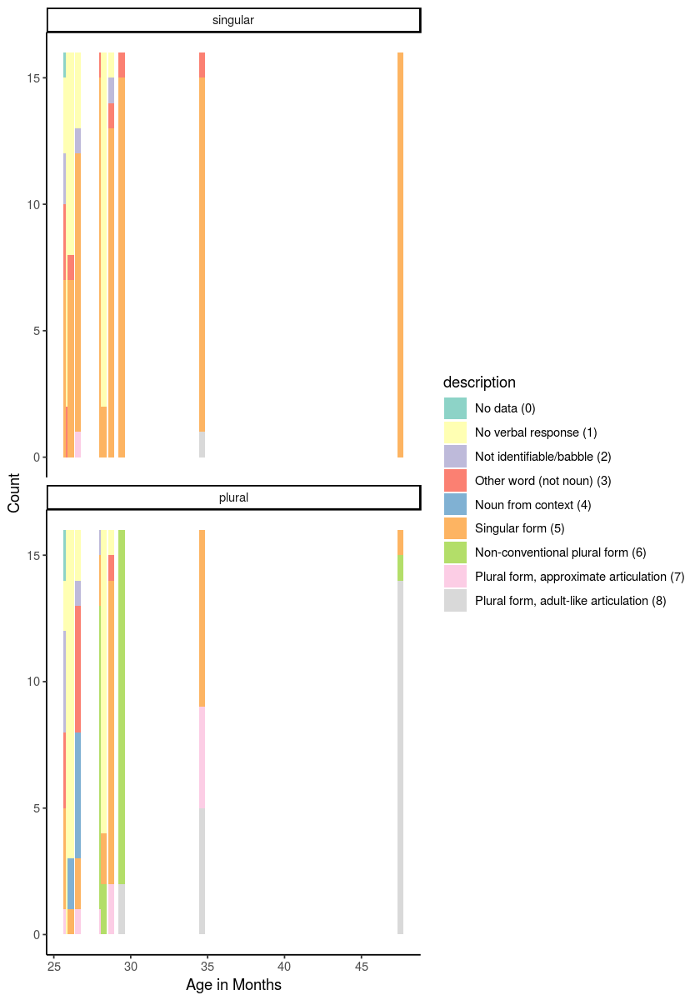

In [106]:
code_counts_with_age = merge(subj_info, code_counts, by.x='id', by.y='child')
code_counts_with_age = merge(code_counts_with_age, codes)
print(code_counts_with_age[1:10,])
ggplot(code_counts_with_age) + geom_bar(aes(x=age_in_months, y=count, fill=description),
stat="identity",  width = 0.4) + scale_fill_brewer(palette="Set3"
) + facet_wrap(~type, nrow=2) + xlab('Age in Months') + ylab('Count'
) + theme_classic() 

Compare with existing studies: 

- Zapf and Smith (2007):
- Zapf and Ettlinger (2011): for 22-35 months (m=25.8): 52% correct plurals; 33% singulars, remainder are non-answers
Experimenter says "Can you tell Teddy to get ____" and point to the singulars or the plurals. Common familiar nouns. Teddy bear picks up things or not.


# Proposed scoring methods

In [107]:
computeScores = function(codes, method = 'narrow'){
    if (method == 'narrow'){
        sum(codes %in% c(7,8)) / sum(codes %in% seq(6,8))
    } else if (method == 'broad') {
        sum(codes %in% c(7,8)) / sum(codes %in% seq(2,8))
    }
}

aggregate(Plural.Code ~ child, subset(p_coded, Singular.Code == 5), computeScores)

child,Plural.Code
pl01,1.00000000
pl03,1.00000000
pl04,0.08333333
pl05,NaN
pl09,NaN
pl10,0.13333333
pl13,0.93333333
pl14,1.00000000
pl15,1.00000000
pl16,0.90000000


In [108]:
aggregate(Plural.Code ~ child, subset(p_coded, Singular.Code == 5), function(x){computeScores(x,'broad')})

child,Plural.Code
pl01,0.16666667
pl03,0.10000000
pl04,0.06666667
pl05,0.00000000
pl09,0.00000000
pl10,0.13333333
pl13,0.87500000
pl14,0.50000000
pl15,0.15384615
pl16,0.64285714


# RT

In [111]:
metadata_cols = c('animacystatus', 'background_context','distractorimage',
'distractorloc', 'expt_index', 'full_carrier', 'novel_id', 'novelcolor',
'novelty', 'order', 'pl_carrier', 'pl_form', 'pl_punct', 'pl_sentence',
'pl_wav_index', 'practice', 's_carrier', 's_form', 's_punct',
's_sentence', 's_wav_index', 'simple_pl_stim', 'simple_s_stim', 'target',
'targetimage', 'targetloc', 'targetside', 'test_index', 'trial', 'voicing', 'vowel_carrier',
'RECORDING_SESSION_LABEL')

fixation_paths = c(
'results/smflip3_fixreport.txt',
'results/pl06_fixations.txt',    
'results/pl07_fixations.txt',    
'results/pl08_fixations.txt',
'results/pl12_fixations.txt',
'results/adultpilot_pl13_fixations.txt',
'results/adultpilot_pl14_fixations.txt',
'results/adultpilot_pl15_fixations.txt',
'results/adultpilot_pl16_fixations.txt')

In [112]:
fixreports = lapply(fixation_paths, function(fixation_path){
    gaze = blabr::fixations_report(fixation_path)
    gaze = merge(gaze, audio_timings[,c('audiotarget','disambig_time')])    
    gaze$CURRENT_FIX_END = gaze$CURRENT_FIX_END - gaze$disambig_time # 0 is now disambig time
    gaze$CURRENT_FIX_START = gaze$CURRENT_FIX_START - gaze$disambig_time
    gaze = gaze[order(gaze$TRIAL_INDEX, gaze$CURRENT_FIX_INDEX),]
    return(gaze)    
})

Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logical(),
  CURRENT_FIX_DURATION = col_double(),
  CURRENT_FIX_END = col_double(),
  CURRENT_FIX_INDEX = col_double(),
  CURRENT_FIX_IS_RT_END = col_logical(),
  CURRENT_FIX_MSG_COUNT = col_double(),
  CURRENT_FIX_PUPIL = col_double(),
  CURRENT_FIX_START = col_double(),
  CURRENT_FIX_X = col_double(),
  CURRENT_FIX_X_RESOLUTION = col_double(),
  CURRENT_FIX_Y = col_double(),
  CURRENT_FIX_Y_RESOLUTION = col_double(),
  IP_END_EVENT_MATCHED = col_logical(),
  IP_END_TIME = col_double(),
  IP_START_EVENT_MATCHED = col_logical(),
  IP_START_TIME = col_double(),
  TRIAL_FIXATION_TOTAL = col_double(),
  TRIAL_START_TIME = col_double(),
  RT = col_double()
  # ... with 8 more columns
)
See spec(...) for full column specifications.
Parsed with column specification:
cols(
  .default = col_character(),
  TRIAL_INDEX = col_double(),
  CURRENT_FIX_ADJUSTED = col_logic

In [113]:
source('PLEARN_analysis_helper.R')
test_df = do.call('rbind',lapply(fixreports, function(fixreport){
    getParticipantRTs(380, fixreport, label_colname="CURRENT_FIX_INTEREST_AREA_LABEL", metadata_cols, include_non_roi_label=T)
})) 

In [122]:
getRTComparisonPlot = function(test_df, split_var, facet_var = NULL){
    
    agg_equation = paste("rt ~", split_var)
    if (!is.null(facet_var)){
        agg_equation = paste(agg_equation, "+", facet_var)
    }
    summary_df = do.call(data.frame, aggregate(as.formula(agg_equation), data = test_df, FUN = function(x)
        c(mean = mean(x), sd = sd(x))))
    print(names(summary_df))                   
    
    options(repr.plot.width=4, repr.plot.height=4)
    p1 = ggplot(test_df) + geom_violin(mapping=aes(y=rt, x=factor(test_df[[split_var
]]), colour=factor(test_df[[split_var]]))) + theme_bw(
) + geom_errorbar(data = summary_df, mapping=aes(x=factor(summary_df[[split_var
]]), ymin =  rt.mean - rt.sd, ymax = rt.mean + rt.sd), width = 0.1, alpha=.5) + geom_errorbar(data = summary_df, mapping=aes(x=factor(summary_df[[split_var
]]), ymin =  rt.mean, ymax = rt.mean)) + theme_bw(
) + geom_hline(yintercept=0, colour='black', linetype='dashed'
) + geom_hline(yintercept=367, colour='forestgreen') + coord_flip(
ylim= c(0,2000)) + xlab(split_var) + ylab(''
) + theme(legend.position="none")
    
    if (!is.null(facet_var)){
        options(repr.plot.width=4, repr.plot.height=8)
        p1 = p1 + facet_wrap(as.formula(paste('~', facet_var, sep='')), ncol=1)
    }
    print(p1)
                                               
    p2 = ggplot(test_df) + geom_histogram(mapping=aes(x=rt, fill=factor(test_df[[split_var]]))
    ) + theme_bw() + geom_errorbarh(data = summary_df, 
    mapping=aes(y=factor(summary_df[[split_var]]), xmin =  rt.mean - rt.sd, xmax = rt.mean + rt.sd),
    width = 0.1, alpha=.5) + geom_errorbarh(data = summary_df, mapping=aes(y=factor(summary_df[[split_var
    ]]), xmin =  rt.mean, xmax = rt.mean)) + theme_bw() + geom_vline(xintercept=0, 
    colour='black', linetype='dashed') + geom_vline(xintercept=367, colour='forestgreen'
    ) + coord_cartesian(xlim= c(0,2000)) + theme(legend.position="none")
    
    if (!is.null(facet_var)){
        options(repr.plot.width=4, repr.plot.height=8)
        p2 = p2 + facet_wrap(as.formula(paste('~', facet_var, '+', split_var, sep='')), ncol=1)
    } else {
        p2 = p2 + facet_wrap(as.formula(paste('~', split_var, sep='')), ncol=1)
    }
    #print(p2)                                  
                                               
                                               
}

In [123]:
names(test_df)

[1] "rt"                      "time_to_last_nonna"     
 [3] "track_loss_at_0"         "animacystatus"          
 [5] "background_context"      "distractorimage"        
 [7] "distractorloc"           "expt_index"             
 [9] "full_carrier"            "novel_id"               
[11] "novelcolor"              "novelty"                
[13] "order"                   "pl_carrier"             
[15] "pl_form"                 "pl_punct"               
[17] "pl_sentence"             "pl_wav_index"           
[19] "practice"                "s_carrier"              
[21] "s_form"                  "s_punct"                
[23] "s_sentence"              "s_wav_index"            
[25] "simple_pl_stim"          "simple_s_stim"          
[27] "target"                  "targetimage"            
[29] "targetloc"               "targetside"             
[31] "test_index"              "trial"                  
[33] "voicing"                 "vowel_carrier"          
[35] "RECORDING_SESSION_LABEL"

[1] "RECORDING_SESSION_LABEL" "target"                 
[3] "rt.mean"                 "rt.sd"                  


Warning message:
“Removed 138 rows containing non-finite values (stat_ydensity).”Warning message:
“Ignoring unknown parameters: width”

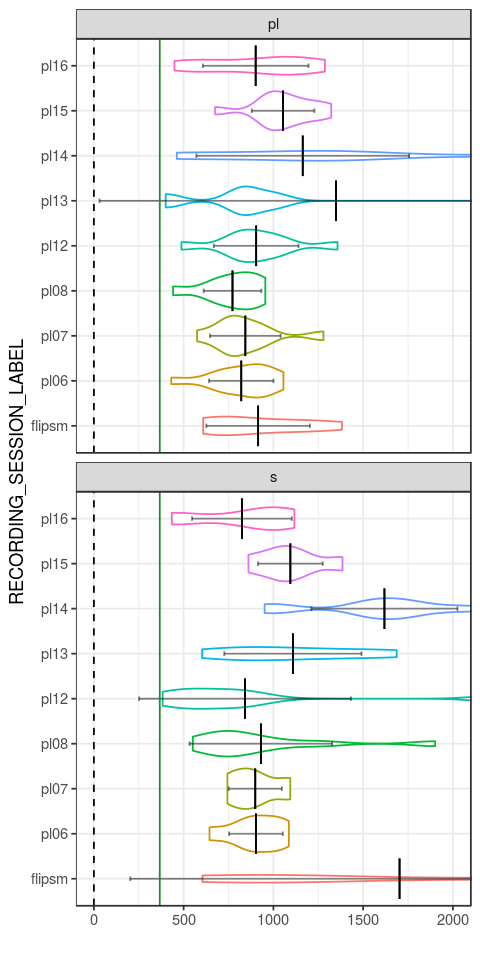

In [124]:
getRTComparisonPlot(test_df, split_var = 'RECORDING_SESSION_LABEL', facet_var='target')

[1] "target"  "rt.mean" "rt.sd"  


Warning message:
“Removed 138 rows containing non-finite values (stat_ydensity).”Warning message:
“Ignoring unknown parameters: width”

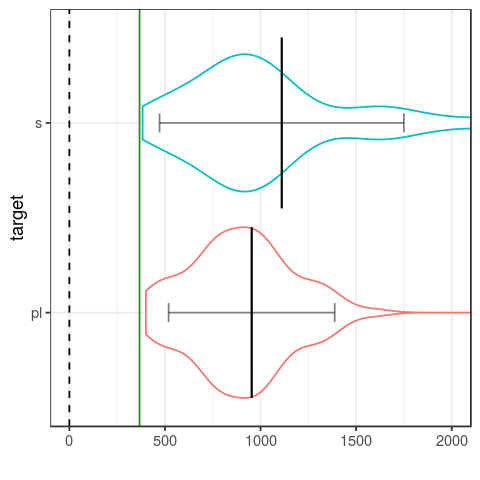

In [125]:
getRTComparisonPlot(test_df, split_var = 'target')

[1] "target"                  "RECORDING_SESSION_LABEL"
[3] "rt.mean"                 "rt.sd"                  


Warning message:
“Removed 138 rows containing non-finite values (stat_ydensity).”Warning message:
“Ignoring unknown parameters: width”

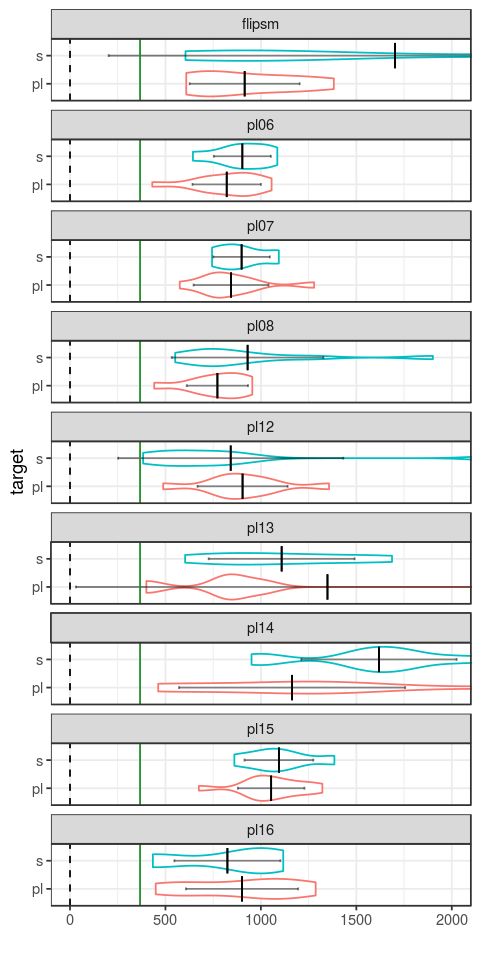

In [126]:
getRTComparisonPlot(test_df, split_var = 'target', facet_var = 'RECORDING_SESSION_LABEL')

[1] "voicing" "target"  "rt.mean" "rt.sd"  


Warning message:
“Removed 138 rows containing non-finite values (stat_ydensity).”Warning message:
“Ignoring unknown parameters: width”

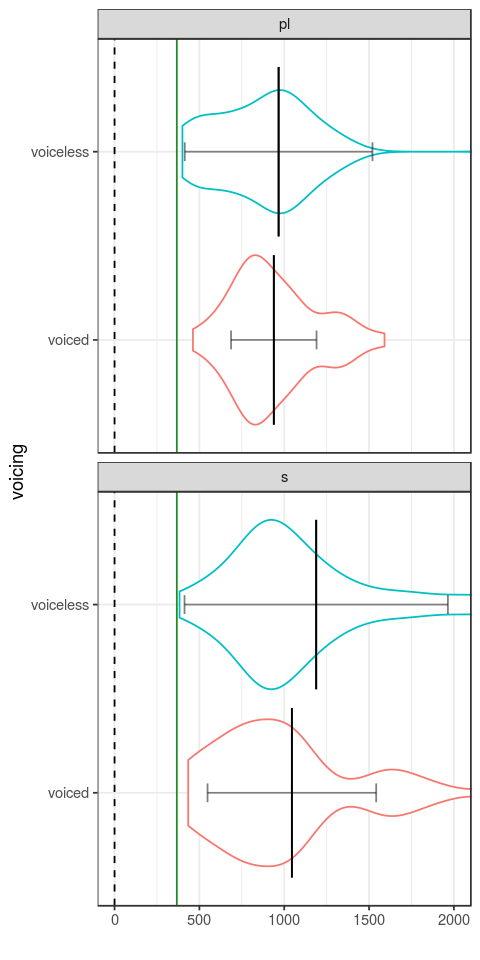

In [127]:
getRTComparisonPlot(test_df,split_var = 'voicing', facet_var='target')

[1] "novelty" "target"  "rt.mean" "rt.sd"  


Warning message:
“Removed 138 rows containing non-finite values (stat_ydensity).”Warning message:
“Ignoring unknown parameters: width”

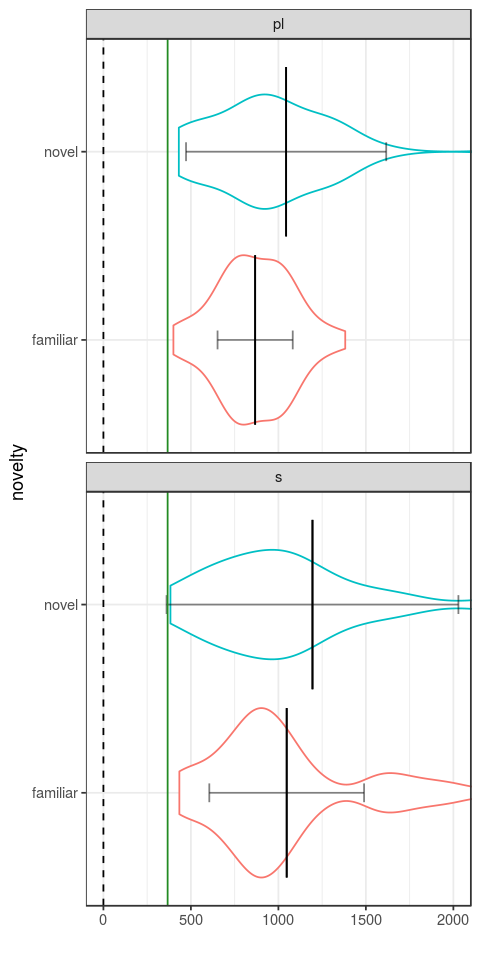

In [128]:
getRTComparisonPlot(test_df,split_var = 'novelty', facet_var='target')

[1] "animacystatus" "target"        "rt.mean"       "rt.sd"        


Warning message:
“Removed 138 rows containing non-finite values (stat_ydensity).”Warning message:
“Ignoring unknown parameters: width”

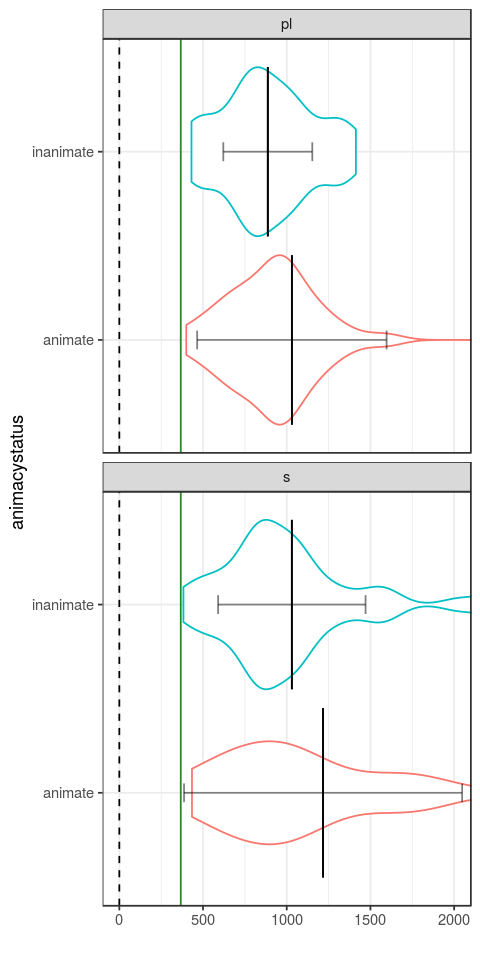

In [129]:
getRTComparisonPlot(test_df,split_var = 'animacystatus', facet_var='target')

In [130]:
names(test_df)

[1] "rt"                      "time_to_last_nonna"     
 [3] "track_loss_at_0"         "animacystatus"          
 [5] "background_context"      "distractorimage"        
 [7] "distractorloc"           "expt_index"             
 [9] "full_carrier"            "novel_id"               
[11] "novelcolor"              "novelty"                
[13] "order"                   "pl_carrier"             
[15] "pl_form"                 "pl_punct"               
[17] "pl_sentence"             "pl_wav_index"           
[19] "practice"                "s_carrier"              
[21] "s_form"                  "s_punct"                
[23] "s_sentence"              "s_wav_index"            
[25] "simple_pl_stim"          "simple_s_stim"          
[27] "target"                  "targetimage"            
[29] "targetloc"               "targetside"             
[31] "test_index"              "trial"                  
[33] "voicing"                 "vowel_carrier"          
[35] "RECORDING_SESSION_LABEL"

In [131]:
library('lme4')
lm = lmer(rt ~ novelty + voicing + animacystatus + 
    (novelty + voicing + animacystatus | RECORDING_SESSION_LABEL) +(1|s_form), data=
 test_df, )
summary(lm)

Linear mixed model fit by REML ['lmerMod']
Formula: rt ~ novelty + voicing + animacystatus + (novelty + voicing +  
    animacystatus | RECORDING_SESSION_LABEL) + (1 | s_form)
   Data: test_df

REML criterion at convergence: 2252.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.8205 -0.4390 -0.0867  0.2651  6.1421 

Random effects:
 Groups                  Name                   Variance Std.Dev. Corr       
 s_form                  (Intercept)               268.5  16.39              
 RECORDING_SESSION_LABEL (Intercept)             30132.0 173.59              
                         noveltynovel            32608.1 180.58    0.71      
                         voicingvoiceless         8283.0  91.01    0.55  0.98
                         animacystatusinanimate  40658.1 201.64   -0.77 -0.99
 Residual                                       239740.7 489.63              
      
      
      
      
      
 -0.95
      
Number of obs: 150, groups:  s_form, 32; RECORDING_SES

# Preference Before Disambig

In [132]:
beforeafter_disambig_df = subset(adult_fixbins_coded, 
    CURRENT_FIX_INTEREST_AREA_LABEL %in% c('TARGET','DISTRACTOR'))
beforeafter_disambig_df$looking_at_plural = 0
beforeafter_disambig_df$looking_at_plural[
    beforeafter_disambig_df$CURRENT_FIX_INTEREST_AREA_LABEL == 'TARGET' & 
    beforeafter_disambig_df$target == 'pl'] = 1
beforeafter_disambig_df$looking_at_plural[
    beforeafter_disambig_df$CURRENT_FIX_INTEREST_AREA_LABEL == 'DISTRACTOR' & 
    beforeafter_disambig_df$target == 's'] = 1
beforeafter_disambig_df$beforeafter = 'After Disambiguation'
beforeafter_disambig_df$beforeafter[beforeafter_disambig_df$Time < 367] = 'Before Disambiguation'
beforeafter_disambig_preference = aggregate(looking_at_plural ~ participant_name + beforeafter + TRIAL_INDEX, 
    beforeafter_disambig_df, mean)

beforeafter_disambig_by_subject = do.call(data.frame, aggregate(looking_at_plural ~ participant_name +  beforeafter, beforeafter_disambig_preference, FUN = function(x){c(mean=mean(x), sd = sd(x))}))                                       

print(beforeafter_disambig_by_subject)

            participant_name           beforeafter looking_at_plural.mean
1  adultpilot_pl13_fixations  After Disambiguation              0.5158088
2  adultpilot_pl14_fixations  After Disambiguation              0.5038737
3  adultpilot_pl15_fixations  After Disambiguation              0.4857293
4  adultpilot_pl16_fixations  After Disambiguation              0.4912726
5             pl06_fixations  After Disambiguation              0.5088005
6             pl07_fixations  After Disambiguation              0.4915883
7             pl08_fixations  After Disambiguation              0.5117331
8             pl12_fixations  After Disambiguation              0.5042678
9          smflip3_fixreport  After Disambiguation              0.5012732
10 adultpilot_pl13_fixations Before Disambiguation              0.5649460
11 adultpilot_pl14_fixations Before Disambiguation              0.5002115
12 adultpilot_pl15_fixations Before Disambiguation              0.5110441
13 adultpilot_pl16_fixations Before Di

In [133]:
beforeafter_disambig_by_subject$looking_at_plural_low = 
    beforeafter_disambig_by_subject$looking_at_plural.mean - beforeafter_disambig_by_subject$looking_at_plural.sd
beforeafter_disambig_by_subject$looking_at_plural_high = 
    beforeafter_disambig_by_subject$looking_at_plural.mean + beforeafter_disambig_by_subject$looking_at_plural.sd

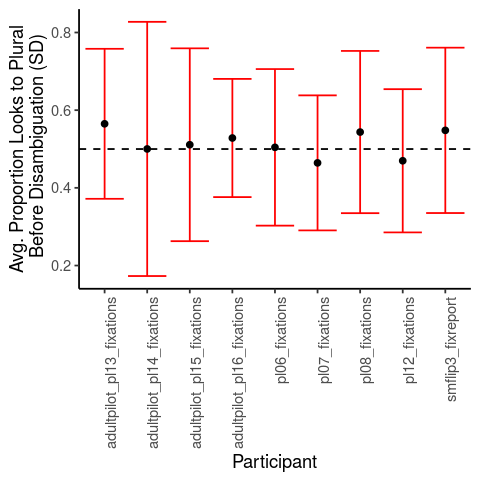

In [134]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(subset(beforeafter_disambig_by_subject, beforeafter == "Before Disambiguation"
)) + geom_errorbar(aes(x=participant_name, ymin= looking_at_plural_low,
 ymax= looking_at_plural_high), color='red') + geom_point(aes(x=participant_name, 
y=looking_at_plural.mean)) + theme_classic() + geom_hline(yintercept=.5, linetype = 'dashed'
) + xlab('Participant') + ylab('Avg. Proportion Looks to Plural\n Before Disambiguation (SD)'
) + theme(axis.text.x = element_text(angle = 90, hjust = 1))


In [ ]:
# should the last fix before disambig be excluded
#[X] Confirm that 0 is the point of disambig for everyone
#[X] propagate the information about the trials
#[X] Make sure that my ordering is doing the right thing
#[X] how to account for the 200 ms exclusion
#[X] have a bit of a buffer on either side of 0 in case there’s an NA instead of a 0/1 in that exact timebin
#    -- so far this is just looking backwards
#[ ] need to recompute wrt the beginning of the /s/ or /z/ segment, not the end